In [1]:
import pandas as pd
from wordcloud import WordCloud
import matplotlib.pyplot as plt

df = pd.read_csv(f"billboard_stats_caption.csv",  header=0)

/var/folders/00/6v4ypdjx7mlb7kcwyj2mg58m0000gn/T/ipykernel_13801/190177120.py:1: DeprecationWarning: 
Pyarrow will become a required dependency of pandas in the next major release of pandas (pandas 3.0),
(to allow more performant data types, such as the Arrow string type, and better interoperability with other libraries)
but was not found to be installed on your system.
If this would cause problems for you,
please provide us feedback at https://github.com/pandas-dev/pandas/issues/54466
        
  import pandas as pd


In [589]:
word_of_interest = ' cd'
filtered_df = df[df['text_without_seed'].str.contains(word_of_interest, case=False, na=False)]
filtered_df[['image_name', 'text_without_seed']]

,image_name,text_without_seed
97,1963_102.png,a picture of a cd cover with a picture of a ma...
160,1971_166.png,a picture of a cd cover of a band playing on s...
275,1979_281.png,eagles - the long run - cd - flac
316,1985_322.png,beverly hills - beverly hills - lp - cd - flac...
390,1992_396.png,deffaman - adrenalize cd album cover
...,...,...
2946,2020_3135.png,a yellow cd case with a cd on it
2958,2020_3149.png,a close up of a cd cover with a picture of a b...
2994,2021_3186.png,youngboy - the essential collection - cd
3003,2021_3195.png,abba - gold greatest hits cd


In [526]:
genres_series = df['big_genres'].str.split(', ').explode()

unique_genres = genres_series.unique()
unique_genres_df = pd.DataFrame(unique_genres, columns=['Unique Genres'])
unique_genres_df.sort_values(by='Unique Genres', inplace=True)
unique_genres_df.reset_index(drop=True, inplace=True)

genres_list = unique_genres_df['Unique Genres'].tolist()

genre_counts = {genre: 0 for genre in genres_list}

# Iterate through each row of the dataframe
for index, row in df.iterrows():
    # This assumes that each cell in 'big_genres' is a string of genres separated by commas
    genres = row['big_genres'].split(',')
    # Count each genre
    for genre in genres:
        genre = genre.strip()  # Remove any leading/trailing whitespace
        if genre in genre_counts:
            genre_counts[genre] += 1

genre_counts_df = pd.DataFrame(list(genre_counts.items()), columns=['Genre', 'Count'])
genre_counts_df['Percentage'] = round((genre_counts_df['Count'] ) / len(df), 3)
genre_counts_df = genre_counts_df.sort_values(by='Count', ascending=False)
genre_counts_df.reset_index(drop=True, inplace=True)

frequent_genres = genre_counts_df['Genre'][:30].tolist()
#genre_counts_df

In [603]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

def plot_wordcloud(word_counts_df):
    wordcloud = WordCloud(width = 800, height = 400, background_color ='white').generate_from_frequencies(dict(zip(word_counts_df['Word'], word_counts_df['Frequency'])))
    
    # Display the generated image:
    plt.figure(figsize=(15,10))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")
    plt.show()
    
def get_common_words(df, column_name):
    remove_words = ["they", "got", "saga","wheel", "them", "away", "at", "surfboard", "curtain", "lights", "air", 
                    "christian", "curly", "collection", "frank", "arafed", "snoop", "men", "sings", "liquid",
                    "chains", "wayne", "ultimate", "try", "name", "john", "outstretched", "another", "summer",
                    "devil", "eagles", "seether", "shades", "water", "image", "neck", "mac", "baby", "stones", 
                    "what", "sex", "two", "araffe", "leopard", "ribbon", "led", "stripe", "life", "battle",
                    "doors", "jon", "open", "beatles", "justin", "a", "wings", "banana", "bob", "halen", "arms",
                    "elton", "love", "blue", "essential", "still", "sad", "nirvana", "clay", "time", "take", "big", 
                    "tears", "sheet", "against", "dirt", "&", "pink", "red", "side", "wine", "season", "montana", 
                    "world", "years",   "that's", "joe", "disney", "lady", "cole", "chicago",
                    "miller", "other", "gold", "lil", "globe", "me", "glenn", "friends", "george", "is", 
                    "records", "bunch", "presley", "dead", "several", "hard", "faith", "background", "maroon",
                    "front", "sky", "through", "day", "good", "hunger", "bruce", "song", "lonely", "year", "third",
                    "faces", "green", "celtic", "stars", "christmas", "painted", "dreadlocks", "lee",
                    "merry", "johnny", "re", "desk", "dark", "thomas", "bald", "gaga", "stage", "logo",
                    "plane", "masks", "lap", "luke", "floor", "mouth", "keith", "cent", "susan", "design",
                    "billy", "plaid", "concert", "of", "uniform", "motion", "furious", "paint", "says",
                    "ray", "songs", "people", "today", "hood", "blood", "middle", "imagine", "feet", "harris", 
                    "surface", "josh", "aldean", "artists", "pool", "butterfly", "that", "last", "little", "shown",
                    "pitbull", "days", "now", "broken", "prince", "small", "chapter", "music", "totally", "laptop",
                    "inside", "him", "frozen", "three", "about", "hands", "behind", "chesney", "dvd", "kelly", "jack", 
                    "peas", "whitney", "band", "dogg", "crowns", "ac", "or", "an", "more", "mustache", "roses", 
                    "hannah", "chest", "it", "church", "human", "complete", "hot", "country", "night", "perfect", 
                    "ludacris", "call", "flacco", "bryan", "legs", "ear", "dreads", "towel", "with", "by", "group",
                    "new", "ac/dc", "so", "large", "colored", "cash", "hits", "from", "girl", "buble", "shelton",
                    "buffett", "special", "sessions", "trio", "combs", "mark", "style", "next", "direction",
                    "florence", "blonde", "series", "beyonce", "silver", "here", "bush", "to", "step", "mp", "punch",
                    "cell", "space", "taylor", "rain", "trans", "earth", "helmet", "mind", "pop", "santana", "no", 
                    "know", "smith", "game", "blurry", "body", "heart", "boyz", "dirty", "youngboy", "shirts", "afro",
                    "nickelback", "songbook", "movie", "this", "my", "stone", "tower", "final", "tuxedo", "fence", 
                    "jayz", "written", "sinatra", "around", "finger", "van", "rings", "black", "b", "araff", "flock", 
                    "reloaded", "grammy", "wanted", "lipstick", "melody", "couple", "eyed", "audio", "charlie", 
                    "colorful", "first", "show", "stewart", "full", "heads", "close", "snow", "all", "rick", "object",
                    "his", "ross", "dc", "michael", "jeezy", "vol", "doorway", "kidz", "nominees", "like", "coat", 
                    "emie", "number", "many", "jay", "biggest", "sweater", "trees", "second", "titled", "brown",
                    "system", "rascal", "headphones", "bat", "boy", "set", "hipsnick", "fan", "hello", "great", 
                    "future", "david", "story", "creed", "sword", "most", "over", "be", "explicit", "for", "family",
                    "various", "guns", "dolls", "neon", "together", "long", "planet", "end", "are", 
                    "soundtrack", "into", "martina", "american", "food", "who", "cap", "dresses", "covered", 
                    "photograph", "statue", "paper", "again", "magazine", "chin", "springsteen", "hip", "brothers", 
                    "card", "on", "vase", "kids", "wow", "tongue", "theater", "barry", "blake", "araffeswritten", 
                    "party", "single", "elvis", "subway", "classics", "purple", "keyshia", "kenny", "mix", 
                    "character", "you", "flats", "striped", "th", "tour", "circular", "young", "clarkson", 
                    "track", "outfit", "out", "city", "top", "tunnel", "only", "bow", "glee", "poses", "us",
                    "birds", "the", "shoulder", "each", "andrea", "am", "blues", "speed", "boys", "print", "ghost",
                    "shorts", "off", "lp", "wooden", "characters", "snake", "pictures", "back", "ocean", "your",
                    "light", "store", "james", "-", "watch", "johnson", "bad", "madonna", "best", "jason", "weeknd", 
                    "get", "video", "jimmy", "pockets", "musical", "fifty", "alien", "bottle", "makeup", "there",
                    "rich", "live", "god", "queen", "made", "tim", "sounds", "dance", "picture", "fire", "right",
                    "forest", "map", "jet", "throne", "lot", "feel", "bodysuit", "ones", "film", "her", "old", "sound",
                    "eric", "born", "just", "original", "butterflies", "rock", "come", "machine", "we", "flames", 
                    "official", "boyle", "one", "flac", "up", "dont", "words", "clear", "hill", "orchestra", 
                    "celebration", "somewhere", "photo", "dmx", "photos",  "in", "feat", "peace", "four",
                    "ground", "download", "word", "across", "down", "line", "jackson", "not", "dj", "fighters",
                    "crowd", "tattoo", "pac", "strait", "rose", "ladder", "teddy", "mary", "mercy", "idol", "yellow", 
                    "near", "greatest", "teeth", "stairs", "how", "journey", "while", "money", "blond", "death",
                    "edition", "home", "parked", "diamond", "smile", "park", "and", "cover", "sidewalk", "rainbow",
                    "worship", "soul", "dragons", "different", "harrison", "hips", "roof", "woods", "crossed", 
                    "eyes", "foo", "five", "gray", "zeppelin", "forever", "blanket", "children", "bopp", "suits",
                    "way", "stand", "art", "paul", "their", "white", "mcgraw", "rope", "very", "im", "rod", "araffes",
                   "box", "star", "hats", "collage", "poster", "angels", "mans", "shirt", "album", "shows", "hair",
                    "santa", "denim", "handwritten", "choke", "formal", "bloody", "golden", "shaped", "substance",
                    "spread", "shape", "america", "handwritten", "choke", "pile", "fireplace", "turban",
                    "formal", "braid", "bag", "porch", "bloody", "square", "golden", "snowflake", "mohawk", "shaped",
                    "ornament", "substance", "headdress", "bouquet", "shape", "america", "presents", "stick", "sunset",
                    "surrounded", "outfits", "child", "pair", "desert", "ledge", "frame", "colors", "its",
                    "silhouette", "pattern", "message", "attire", "items", "record", "smoke",
                    "closed", "awards", "cast", "images", "persons", "swirl", "tall", "dread", "title", "lines","costume",
                    "mans", "pain", "persons", "calvin", "television", "leaves", "hole", "lake",
                    "cloud",  "room", "guetta", "selena", "spears", "gomez", "image"
                   
                   ]

    '''remove_words = ["the", "that", "album", "an", "shows", "cover", "of", "with", "in", "on", "and", "it", "his", 
                    "her", "hits", "to", "for", "image", "is", "next", "up", "other", "now", "what", "arafed",
                   "greatest", "red"]'''
 
    regex_pattern = r'\b(?:{})\b|\d+|\b\w+ing\b|[^a-zA-Z ]'.format('|'.join(remove_words))

    def process_row(row):
        # Lowercase the text to make it uniform
        text = row.lower()
        # Remove unwanted words and numbers using regex
        
        text = text.replace('men', 'man'
                                    ).replace('women', 'woman'
                                    ).replace('people', 'group'
                                    ).replace('womans', 'woman'
                                    ).replace('mans', 'man'
                                    ).replace('persons', 'group'
                                    ).replace('black man', 'blackman'
                                    ).replace('images', 'image'
                                    ).replace('pictures', 'image'
                                    ).replace('picture', 'image'
                                    ).replace('photo', 'image'
                                    ).replace('jackets', 'jacket'
                                    ).replace('guitars', 'guitar'
                                    ).replace('tattoos', 'tattoo'
                                    ).replace('skulls', 'skull'
                                    ).replace('leather jacket', 'leatherjacket'
                                    ).replace('leather pants', 'leatherpant'
                                    ).replace('leather pant', 'leatherpant'
                                    ).replace('leather jackets', 'leatherjacket'
                                    ).replace('baseball bat', 'baseballbat'
                                    ).replace('human', 'person'
                                    ).replace('face', 'person'
                                    ).replace('blonde hair', 'blondehair'
                                    ).replace('long hair', 'longhair'
                                    ).replace('girls', 'woman'
                                    )

        text = pd.Series(text).str.replace(regex_pattern, '', regex=True
                                          )[0]
        # Split the text into words, convert to a set to make them unique, then back to list
        unique_words = list(set(text.split()))
        # Return the list of unique words
        return unique_words
    
    # Apply the function to each row
    df['unique_words'] = df[column_name].apply(process_row)
    
    # Explode the DataFrame so that each word gets its own row
    words_list = df.explode('unique_words')['unique_words']
    
    # Filter out any remaining unwanted strings (like single dashes or ampersands if they still exist)
    words_list = words_list[words_list != '-']
    words_list = words_list[words_list != '&']
    words_list = words_list[words_list != "'"]
    words_list = words_list[words_list != "ii"]
    words_list = words_list[words_list != "x"]
    words_list = words_list[words_list != "dont"]
    words_list = words_list[words_list != "mp"]
    words_list = words_list[words_list != "or"]
    words_list = words_list[words_list != "th"]
    words_list = words_list[words_list != "nick"]
    words_list = words_list[words_list != "pac"]
    words_list = words_list[words_list != "im"]
    words_list = words_list[words_list != "award"]
    words_list = words_list[words_list != "mans"]
    words_list = words_list[words_list != "cd"]


    words_list = words_list[words_list.str.len() > 1] 
    word_counts = words_list.value_counts()

    word_counts_df = word_counts.reset_index()
    word_counts_df.columns = ['Word', 'Frequency']
    
    word_counts_df = word_counts_df[word_counts_df['Frequency']> 2]

    return word_counts_df


def plot_bar(df):
    top_words = df.sort_values(by='Frequency', ascending=False).head(10)

    # Plotting the bar chart
    plt.figure(figsize=(12, 8))
    plt.bar(top_words['Word'], top_words['Frequency'], color='skyblue')
    plt.xlabel('Words', fontsize=14)
    plt.ylabel('Frequency', fontsize=14)
    plt.title('Top 10 Most Frequent Words', fontsize=16)
    plt.xticks(rotation=45)
    plt.tight_layout()  # Adjust the layout to not cut off labels
    plt.show()

             Word  Frequency
0             man       1508
1           woman        737
2             hat        232
3           dress        137
4            suit        129
5          guitar        119
6          person        103
7        longhair         94
8          jacket         94
9      sunglasses         85
10            tie         82
11           head         75
12            car         66
13          chair         62
14         cowboy         60
15          beard         54
16          bench         45
17          couch         40
18           wall         38
19     microphone         38
20          field         34
21  leatherjacket         32
22     blondehair         32
23            dog         31
24           sign         30
25           tree         29
26           hand         27
27         street         23
28          clock         22
29           road         22
30            gun         22
31          jeans         22
32        glasses         22
33            

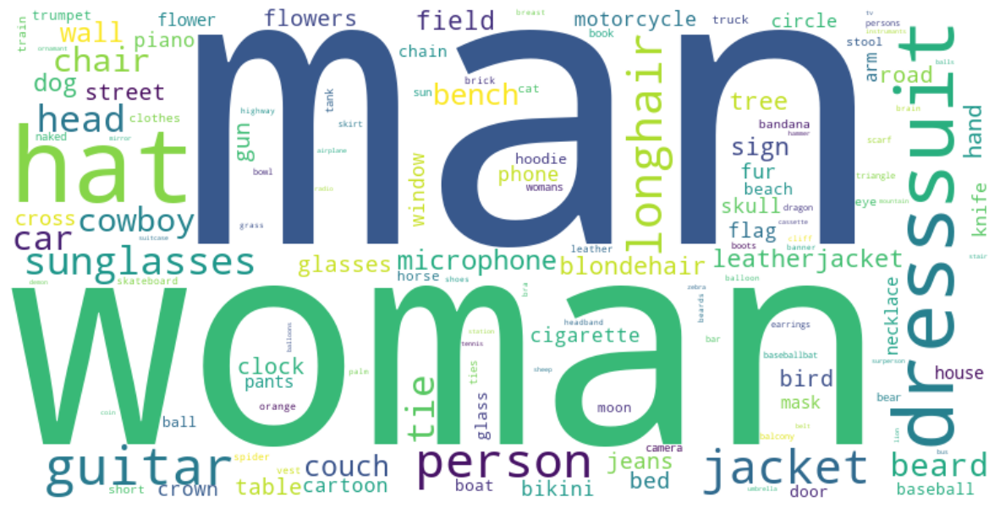

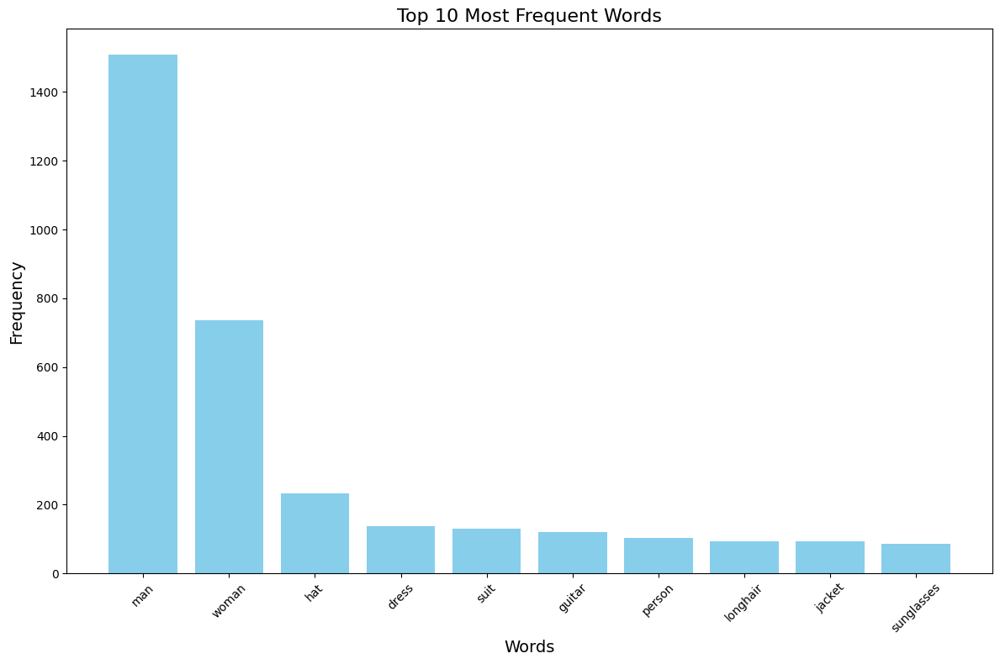

In [608]:
word_counts_df = get_common_words(df,'text_with_seed')
print(word_counts_df[:60])
if len(word_counts_df[:20]) > 0:
    plot_wordcloud(word_counts_df)
    plot_bar(word_counts_df)

             Word  Frequency
0             man        891
1           woman        470
2          person        315
3             hat        166
4           dress        102
5          guitar         80
6            wall         78
7          jacket         70
8            suit         65
9             car         57
10     sunglasses         56
11           head         55
12       longhair         54
13          chair         54
14           sign         53
15           hand         50
16            tie         43
17          beard         38
18          table         37
19          couch         36
20          bench         35
21         cowboy         33
22          field         32
23           book         31
24            bed         31
25          phone         28
26            dog         27
27         street         27
28  leatherjacket         26
29     microphone         26
30         window         24
31           road         23
32           tree         21
33      cigare

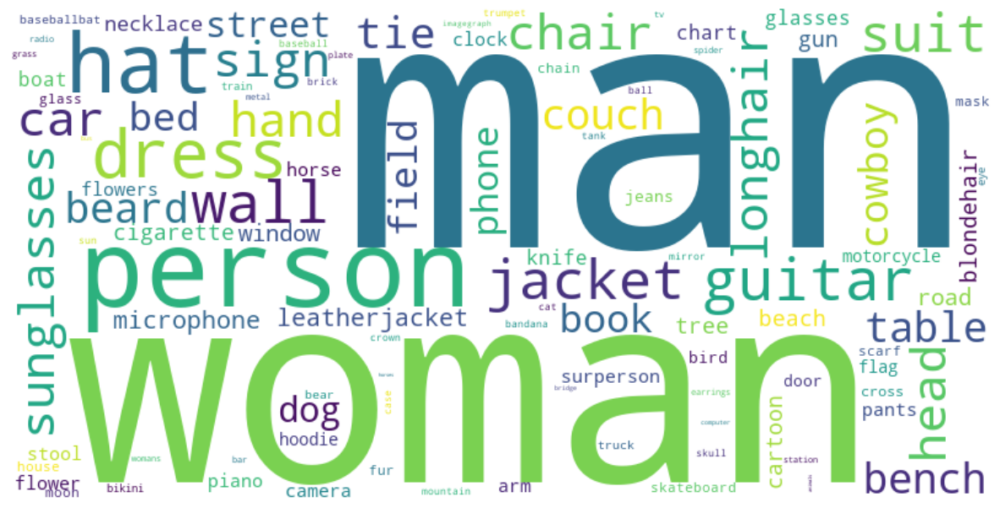

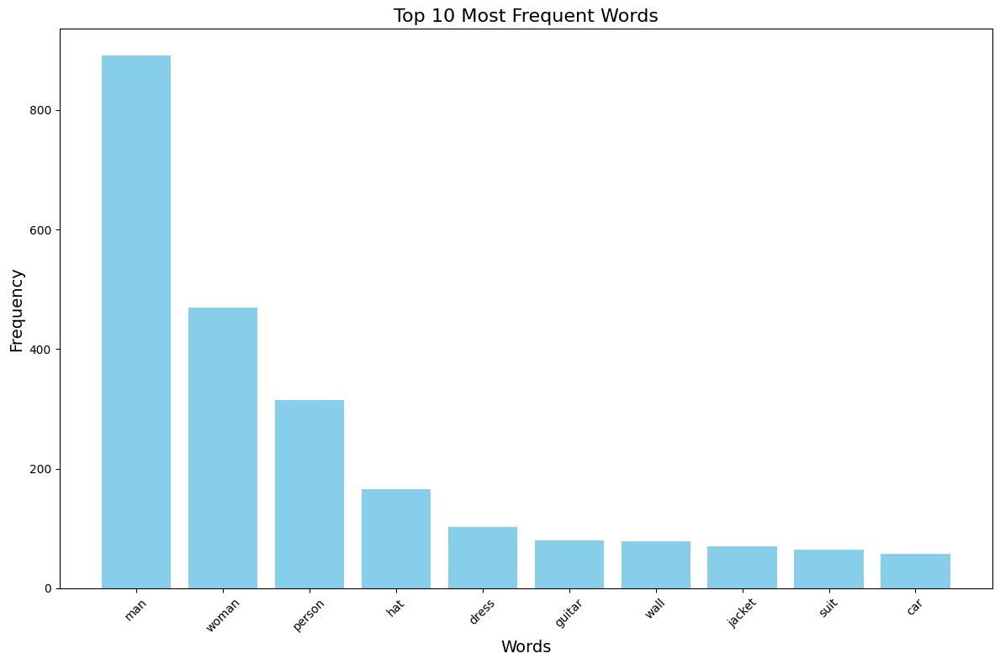

In [609]:
word_counts_df = get_common_words(df,'text_without_seed')
print(word_counts_df[:60])
if len(word_counts_df[:20]) > 0:
    plot_wordcloud(word_counts_df)
    plot_bar(word_counts_df)

--------------   Rock   -------------- 
--------------   WITH SEED    -------------- 


/var/folders/00/6v4ypdjx7mlb7kcwyj2mg58m0000gn/T/ipykernel_13801/914135198.py:132: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['unique_words'] = df[column_name].apply(process_row)


        Word  Frequency
0        man        293
1      woman        104
2     guitar         39
3       suit         22
4     person         21
5        hat         21
6       road         15
7      clock         15
8   longhair         14
9        car         14
10     dress         14
11     field         12
12    jacket         11
13       dog         11
14      tree         11
15     chair         11
16     couch         11
17      bird         11
18     bench         10
19      sign         10


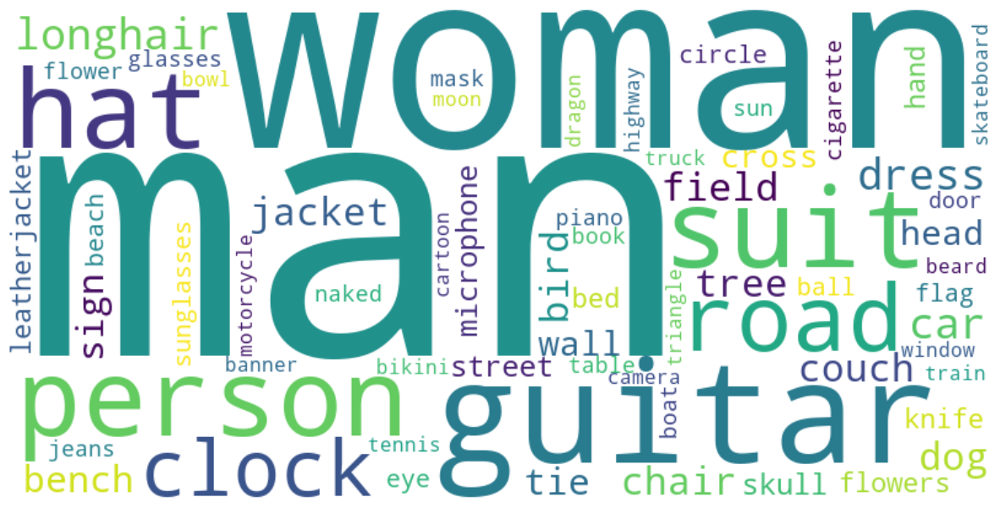

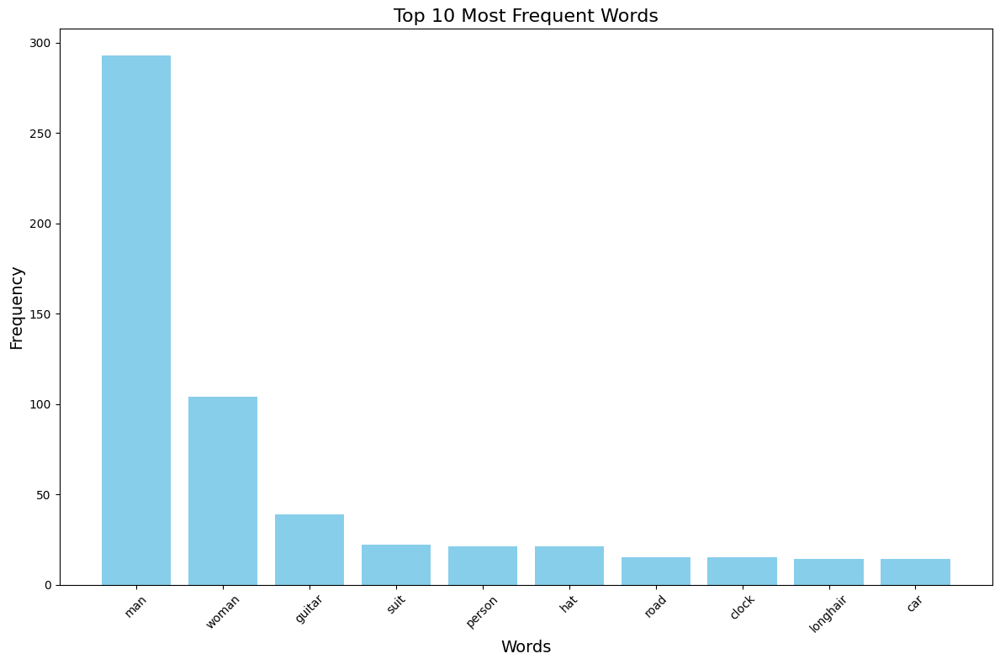

--------------   Rock   -------------- 
--------------   WITHOUT SEED    -------------- 
      Word  Frequency
0      man        177
1    woman         70
2   person         58
3   guitar         27
4     wall         22
5     sign         22
6      hat         15
7     book         15
8    chart         13
9    table         13
10     car         12
11   field         12
12    suit         11
13    road         10
14   clock         10
15     dog          9
16   beach          9
17   dress          9
18   chair          9
19    hand          8


/var/folders/00/6v4ypdjx7mlb7kcwyj2mg58m0000gn/T/ipykernel_13801/914135198.py:132: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['unique_words'] = df[column_name].apply(process_row)


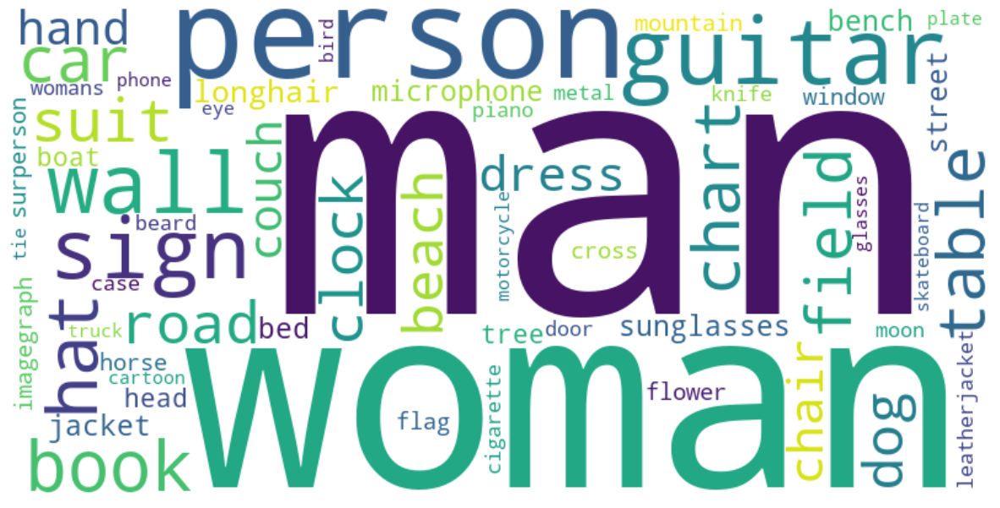

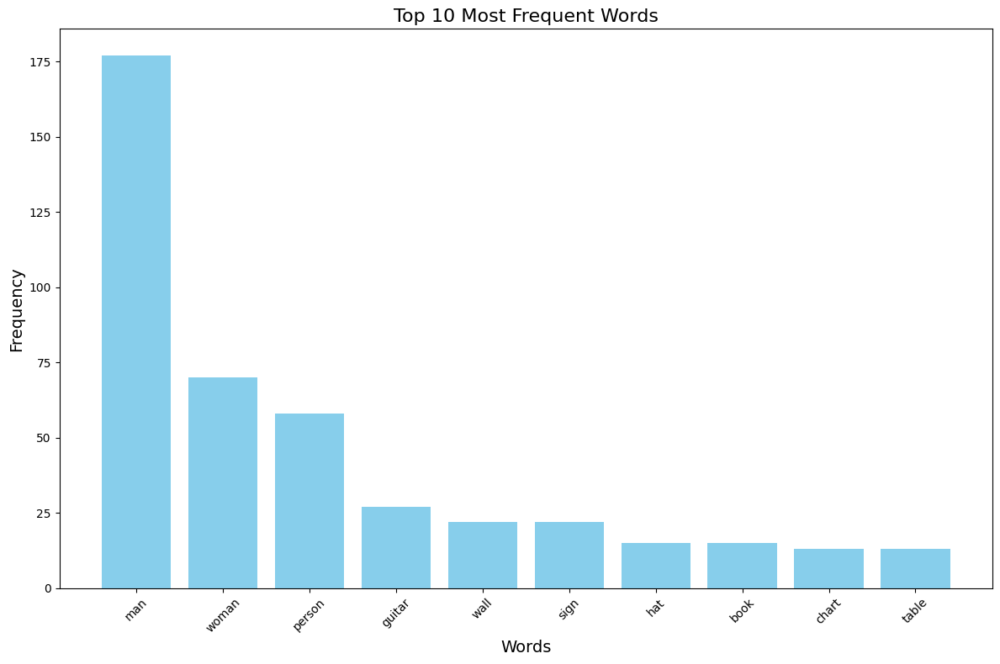

--------------   Pop   -------------- 
--------------   WITH SEED    -------------- 
             Word  Frequency
0           woman        340
1             man        263
2           dress         61
3        longhair         51
4            suit         41
5             hat         33
6          person         32
7             tie         23
8          jacket         22
9      blondehair         21
10          chair         18
11           head         17
12     sunglasses         16
13         guitar         16
14  leatherjacket         13
15          couch         12
16          bench         11
17            car          9
18          pants          8
19           hand          7


/var/folders/00/6v4ypdjx7mlb7kcwyj2mg58m0000gn/T/ipykernel_13801/914135198.py:132: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['unique_words'] = df[column_name].apply(process_row)


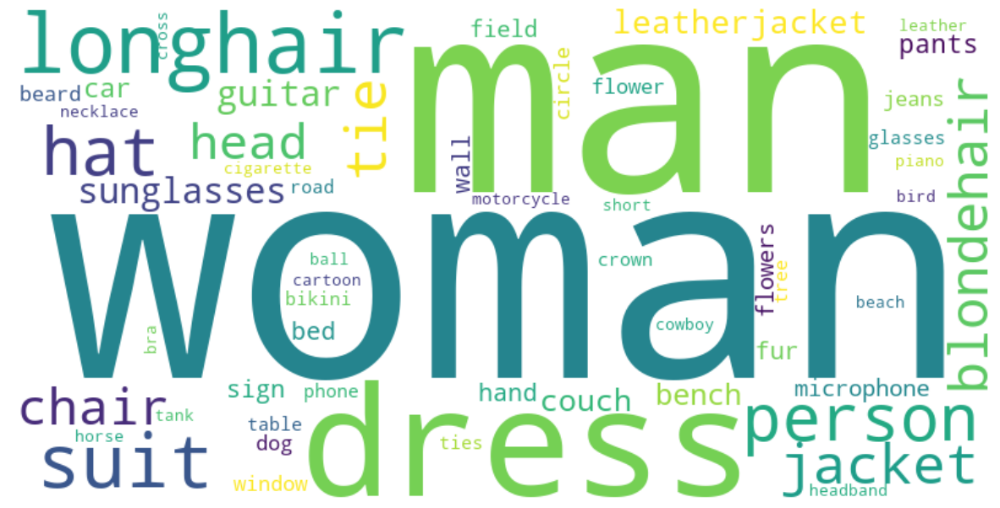

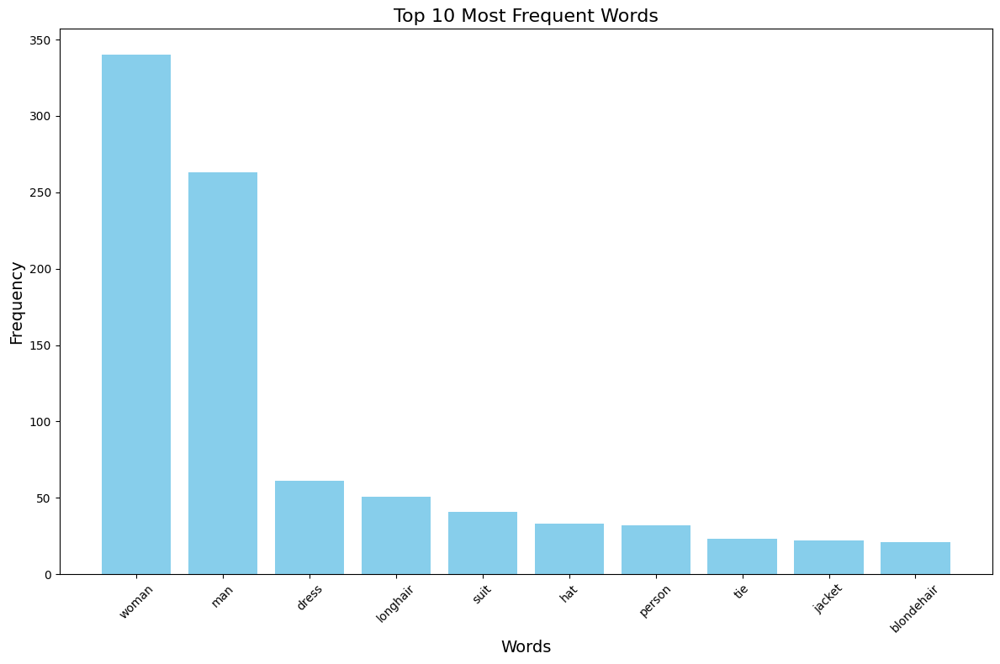

--------------   Pop   -------------- 
--------------   WITHOUT SEED    -------------- 
          Word  Frequency
0        woman        224
1          man        158
2       person         83
3        dress         53
4     longhair         33
5          hat         27
6         suit         20
7       jacket         19
8         wall         17
9         sign         16
10       chair         16
11        head         15
12         bed         15
13  blondehair         14
14       chart         13
15         tie         13
16  sunglasses         13
17        hand         12
18       couch         11
19       bench         10


/var/folders/00/6v4ypdjx7mlb7kcwyj2mg58m0000gn/T/ipykernel_13801/914135198.py:132: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['unique_words'] = df[column_name].apply(process_row)


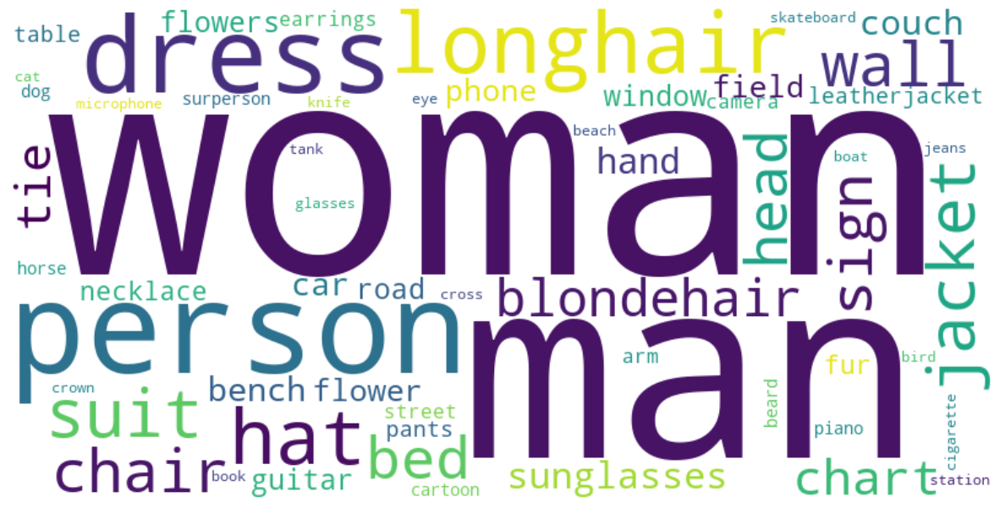

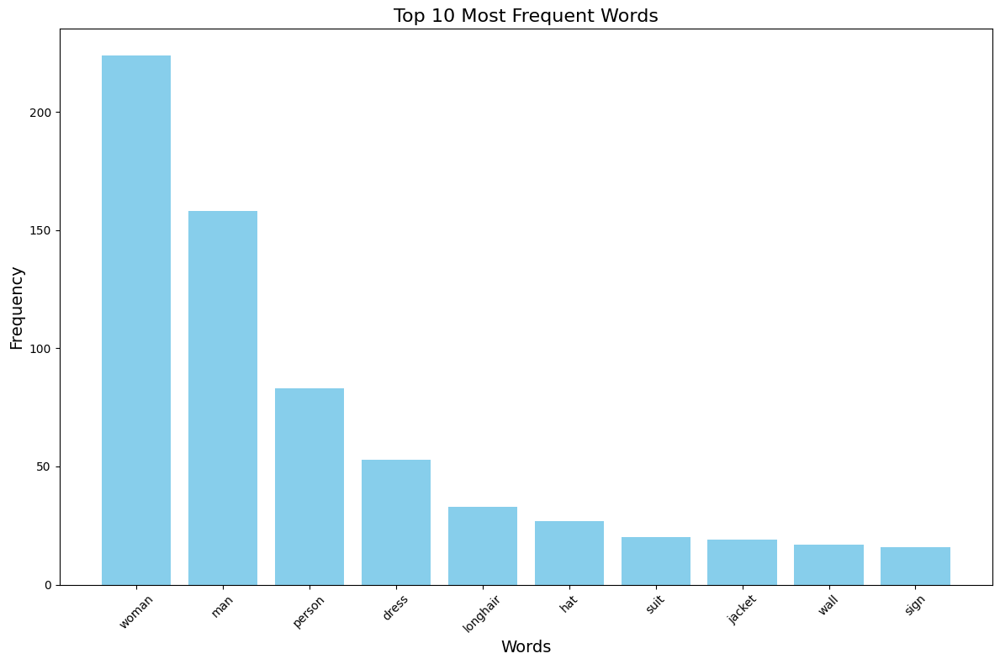

--------------   Hip Hop   -------------- 
--------------   WITH SEED    -------------- 
          Word  Frequency
0          man        444
1        woman         62
2          hat         54
3   sunglasses         40
4         head         32
5          car         28
6       person         26
7         suit         22
8       jacket         22
9        beard         15
10  microphone         12
11       dress         12
12         tie         12
13       bench         10
14       chair         10
15         gun          9
16   cigarette          8
17      hoodie          8
18       chain          8
19        hand          7


/var/folders/00/6v4ypdjx7mlb7kcwyj2mg58m0000gn/T/ipykernel_13801/914135198.py:132: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['unique_words'] = df[column_name].apply(process_row)


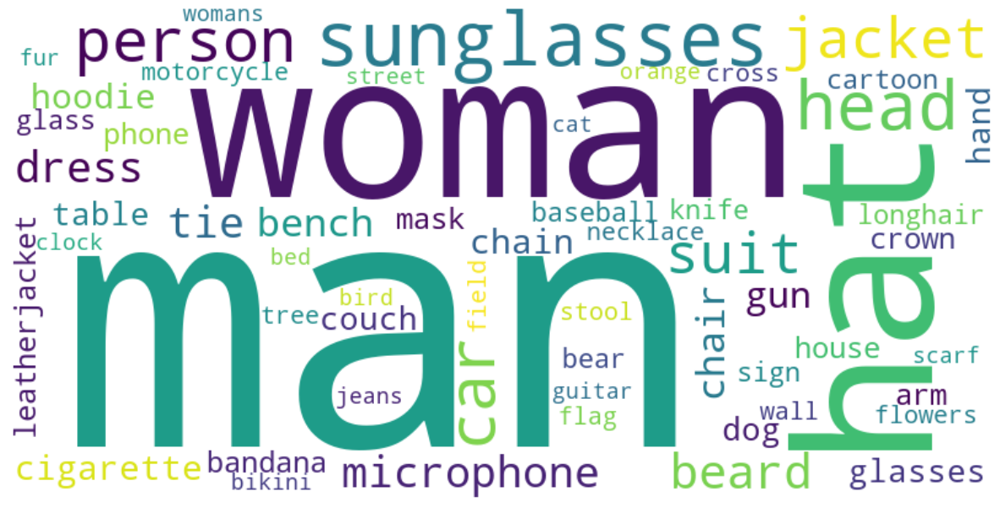

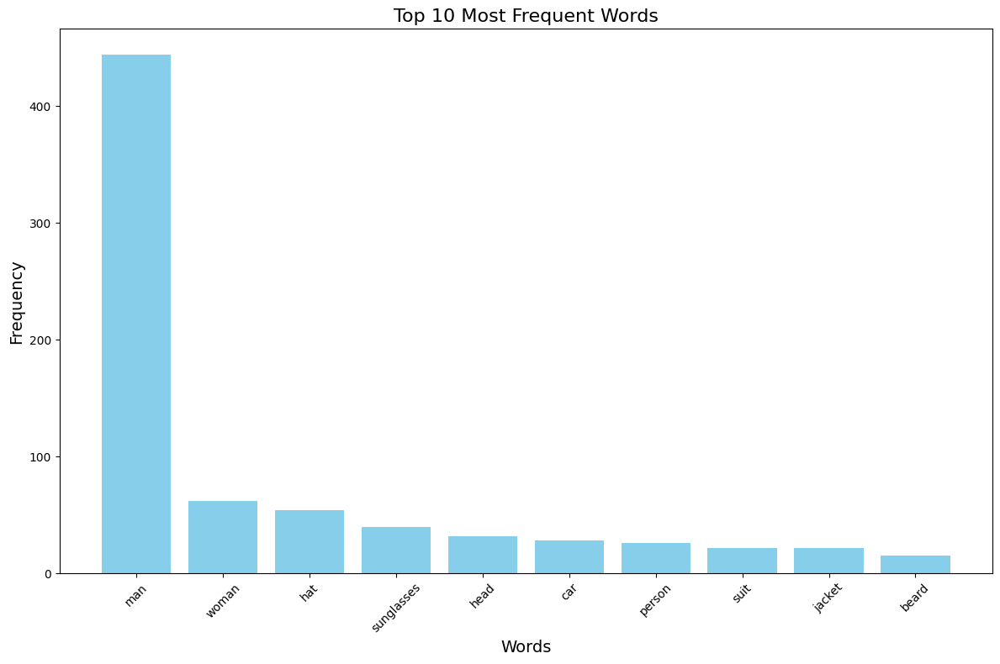

--------------   Hip Hop   -------------- 
--------------   WITHOUT SEED    -------------- 
          Word  Frequency
0          man        292
1       person         73
2        woman         41
3          hat         38
4   sunglasses         26
5          car         25
6         head         23
7       jacket         18
8         hand         17
9         wall         17
10        suit         15
11   cigarette         12
12       beard         12
13       dress         11
14       chair         11
15         tie         10
16       phone          9
17       bench          9
18  microphone          9
19        sign          9


/var/folders/00/6v4ypdjx7mlb7kcwyj2mg58m0000gn/T/ipykernel_13801/914135198.py:132: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['unique_words'] = df[column_name].apply(process_row)


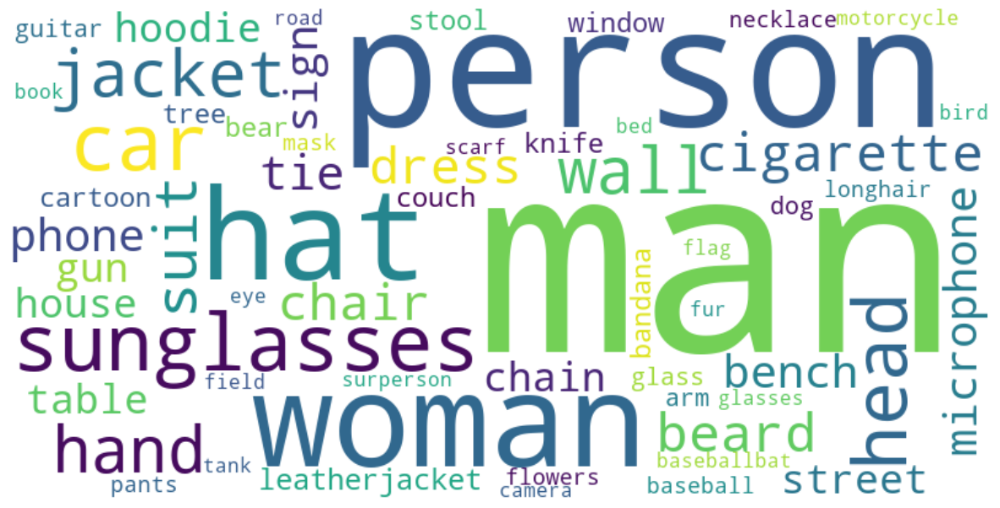

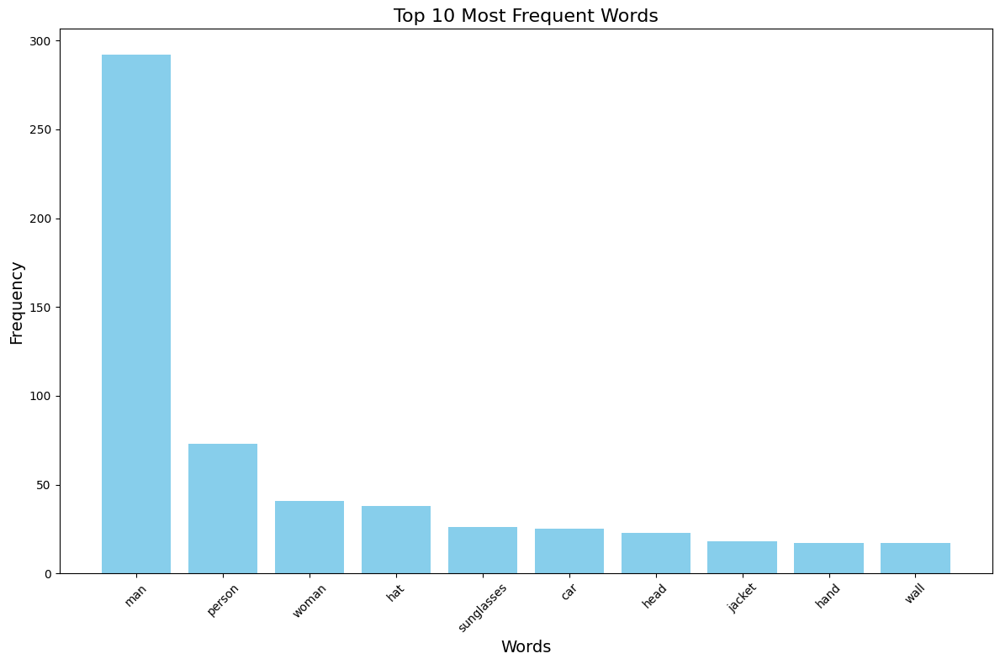

--------------   Country   -------------- 
--------------   WITH SEED    -------------- 
          Word  Frequency
0          man        228
1          hat         88
2        woman         74
3       cowboy         56
4       guitar         37
5       jacket         16
6        beard         15
7        chair         14
8     longhair         12
9        bench         11
10       dress          9
11        wall          9
12         car          8
13       jeans          8
14        suit          7
15  sunglasses          7
16       field          6
17         tie          6
18     glasses          5
19       couch          5


/var/folders/00/6v4ypdjx7mlb7kcwyj2mg58m0000gn/T/ipykernel_13801/914135198.py:132: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['unique_words'] = df[column_name].apply(process_row)


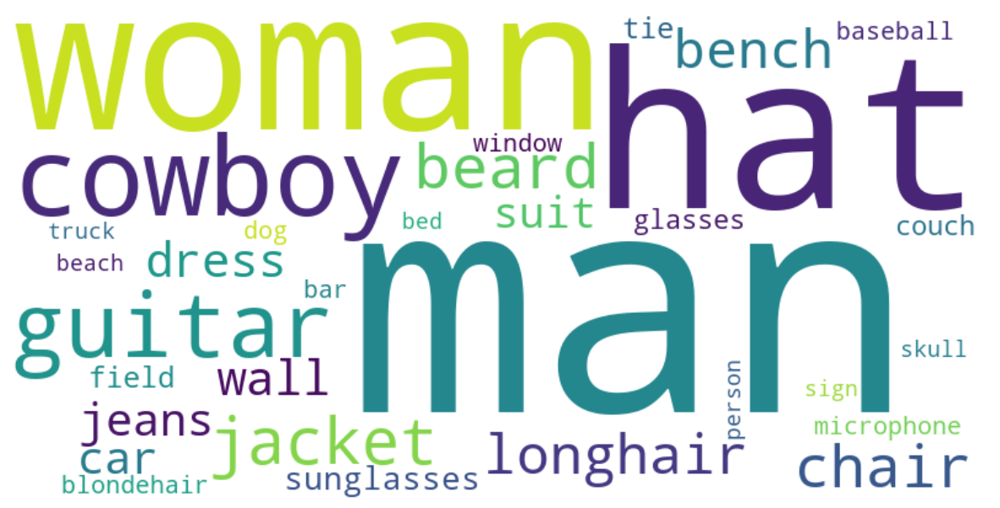

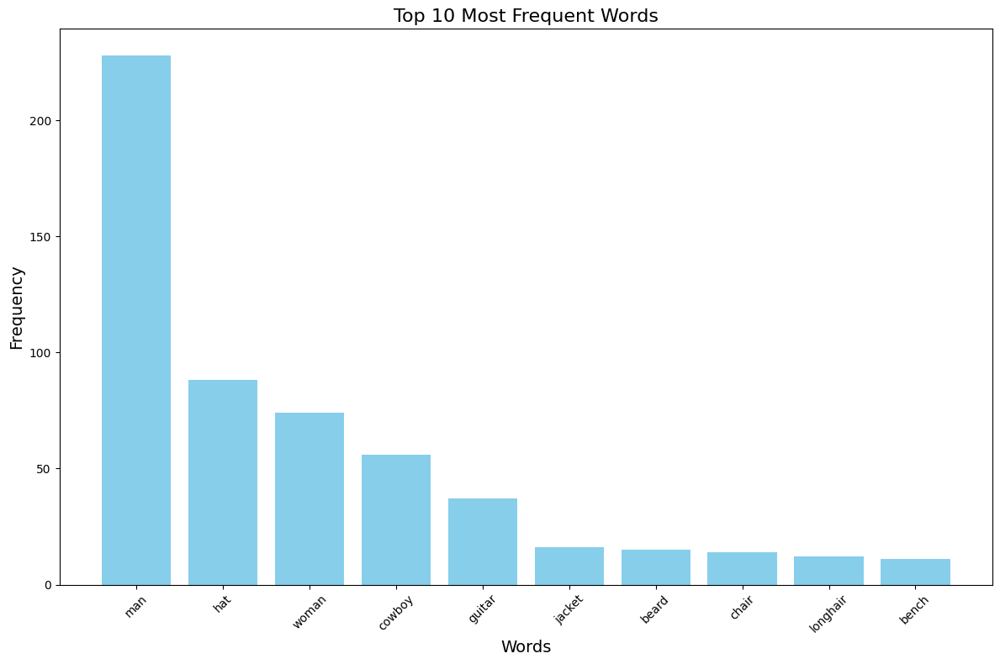

--------------   Country   -------------- 
--------------   WITHOUT SEED    -------------- 
        Word  Frequency
0        man        132
1        hat         63
2      woman         43
3     person         36
4     cowboy         32
5     guitar         28
6      chair         12
7     jacket         10
8       sign         10
9      beard          8
10     bench          7
11      wall          7
12       car          7
13      hand          7
14       dog          6
15      book          6
16     field          6
17  longhair          5
18     dress          5
19     jeans          5


/var/folders/00/6v4ypdjx7mlb7kcwyj2mg58m0000gn/T/ipykernel_13801/914135198.py:132: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['unique_words'] = df[column_name].apply(process_row)


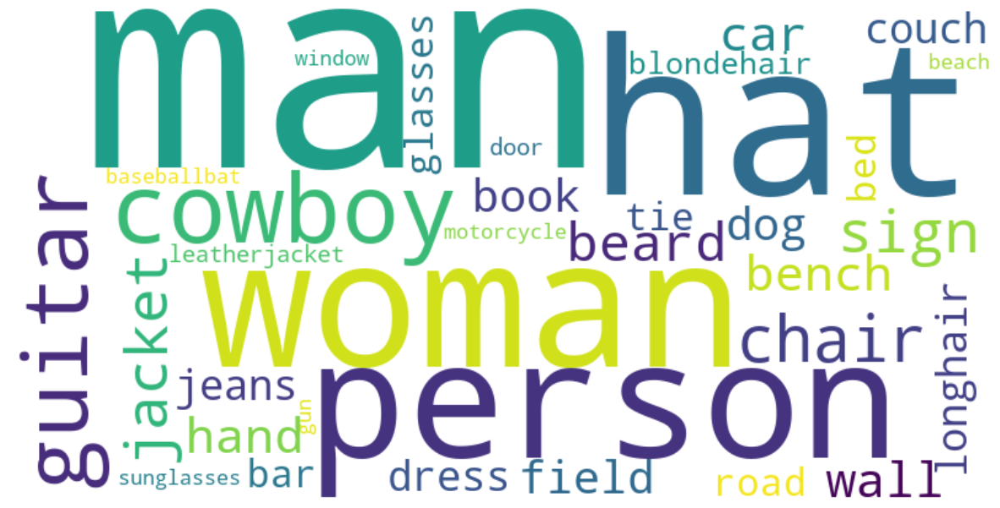

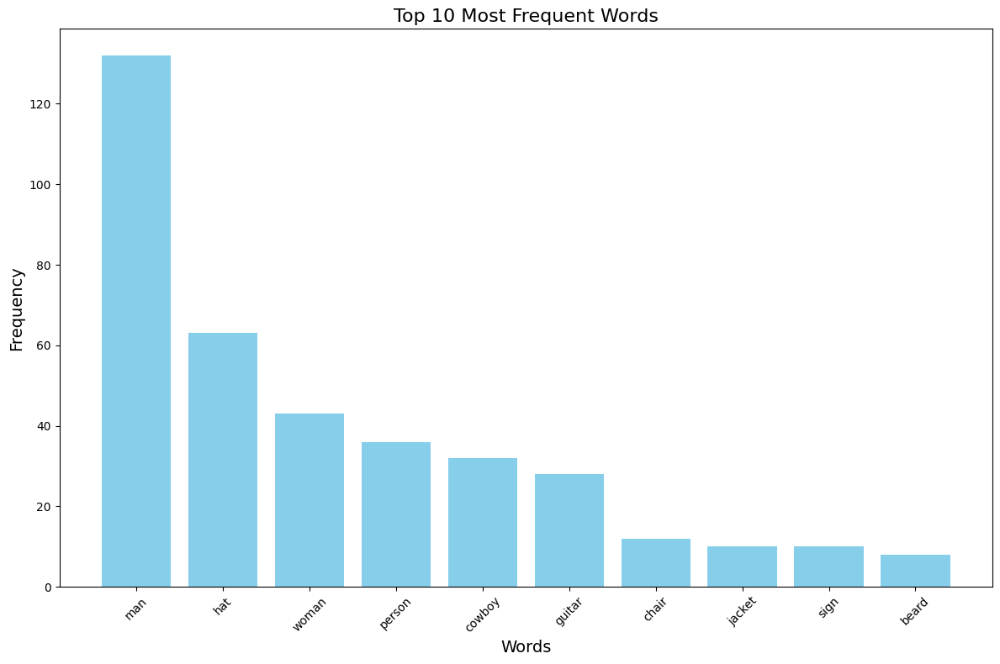

--------------   RnB   -------------- 
--------------   WITH SEED    -------------- 
             Word  Frequency
0             man        105
1           woman         89
2           dress         19
3             hat         17
4          jacket         14
5            suit         11
6      sunglasses         10
7   leatherjacket          8
8             tie          8
9          person          8
10       longhair          7
11           head          7
12          beard          6
13          chair          4
14        clothes          4
15            car          4
16         bikini          4
17          bench          4
18           hand          3
19            fur          3


/var/folders/00/6v4ypdjx7mlb7kcwyj2mg58m0000gn/T/ipykernel_13801/914135198.py:132: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['unique_words'] = df[column_name].apply(process_row)


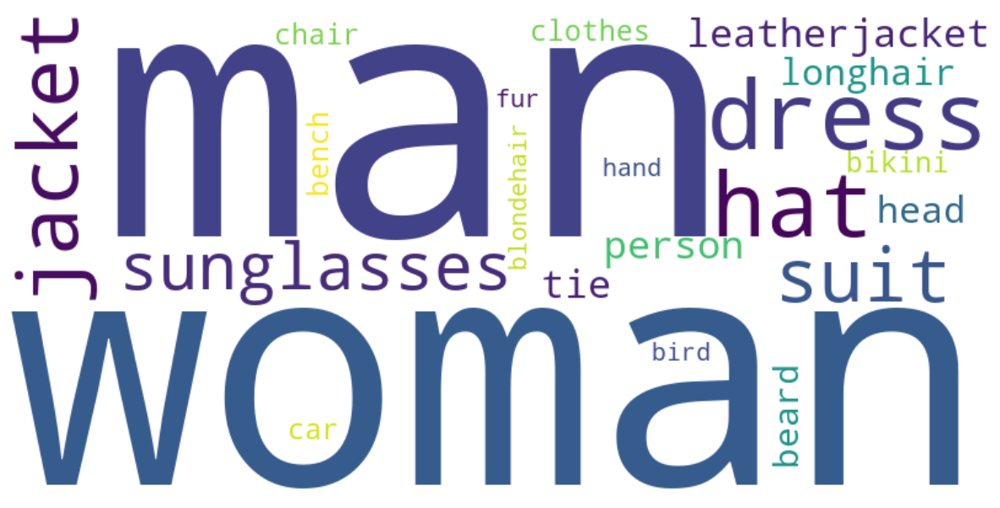

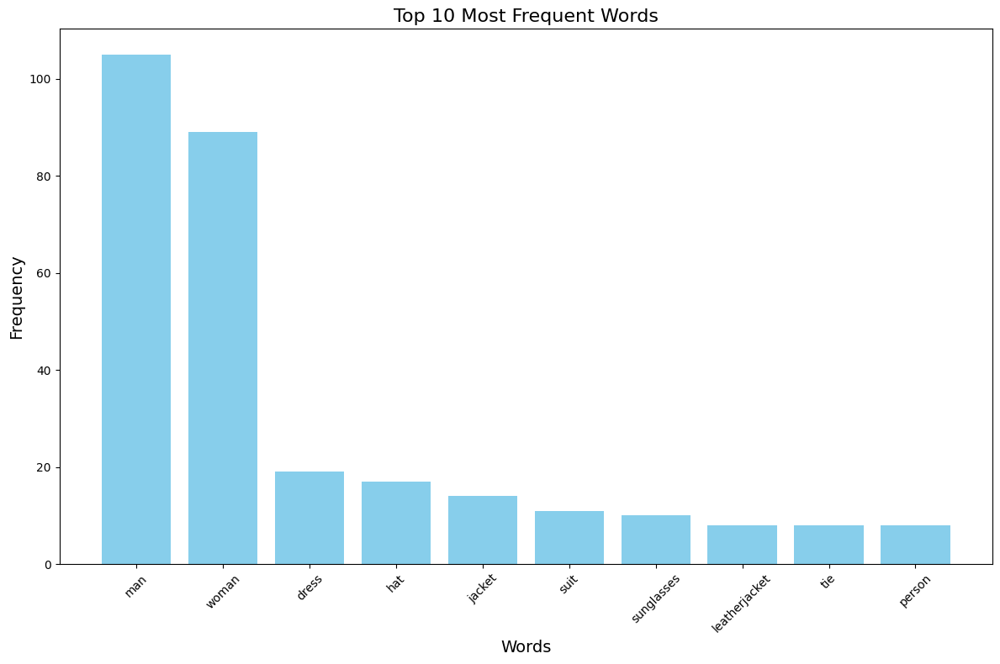

--------------   RnB   -------------- 
--------------   WITHOUT SEED    -------------- 
             Word  Frequency
0           woman         61
1             man         58
2          person         23
3             hat         12
4           dress         11
5          jacket         11
6            head          8
7            wall          7
8            suit          6
9        longhair          6
10     sunglasses          6
11         hoodie          5
12  leatherjacket          5
13          chair          4
14          bench          4
15         bikini          4
16            tie          4
17          table          4
18          phone          4
19          beard          3


/var/folders/00/6v4ypdjx7mlb7kcwyj2mg58m0000gn/T/ipykernel_13801/914135198.py:132: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['unique_words'] = df[column_name].apply(process_row)


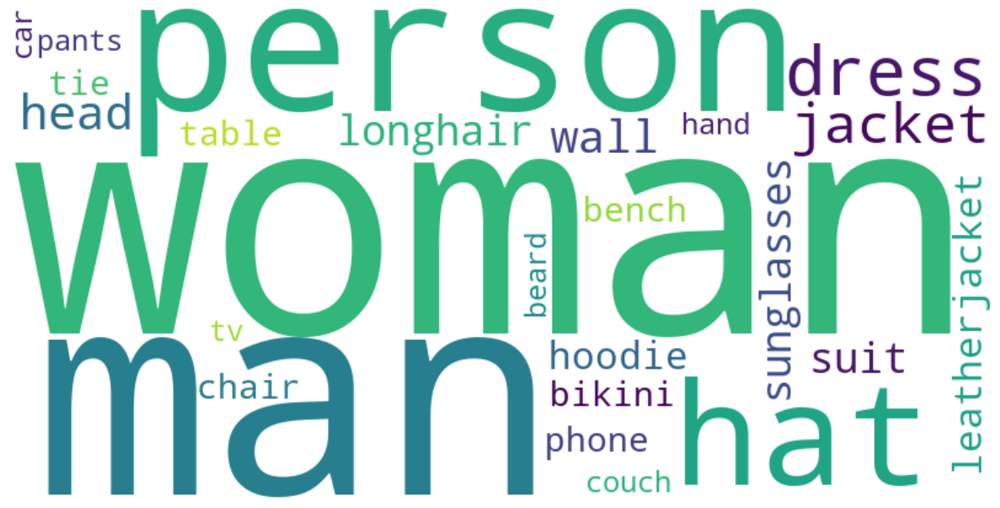

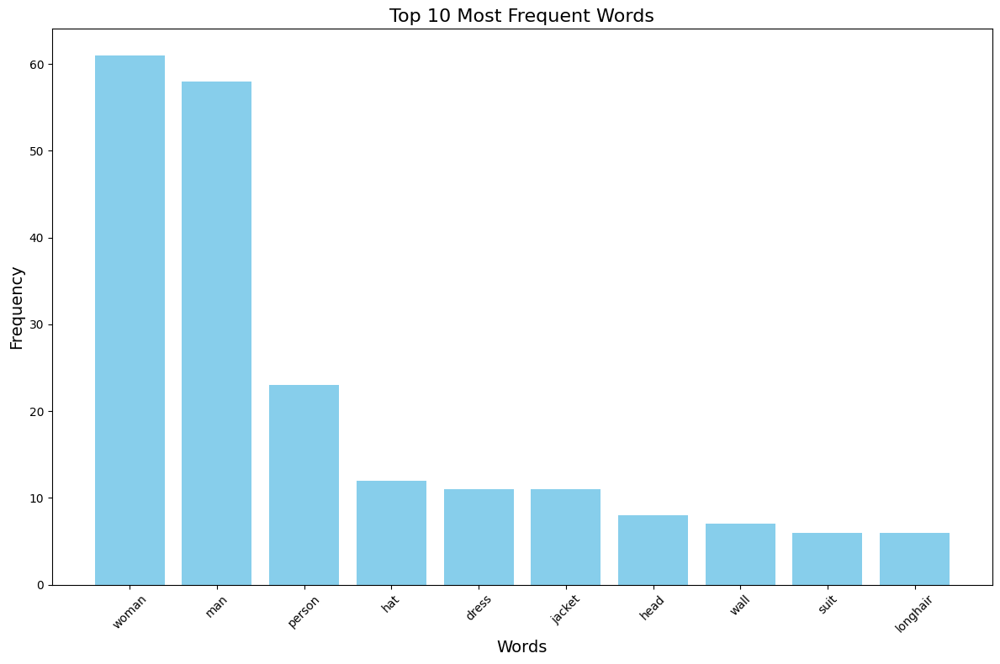

--------------   Electronic   -------------- 
--------------   WITH SEED    -------------- 
          Word  Frequency
0        woman         44
1          man         44
2     longhair          8
3          hat          8
4         head          6
5       person          6
6        dress          6
7       jacket          5
8   sunglasses          5
9        chair          5
10        suit          4
11        tank          3
12        sign          3


/var/folders/00/6v4ypdjx7mlb7kcwyj2mg58m0000gn/T/ipykernel_13801/914135198.py:132: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['unique_words'] = df[column_name].apply(process_row)


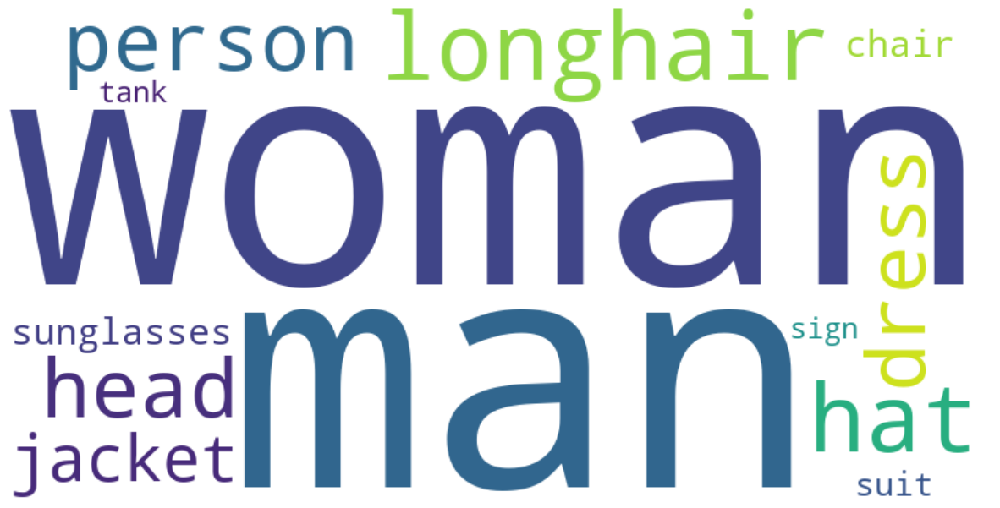

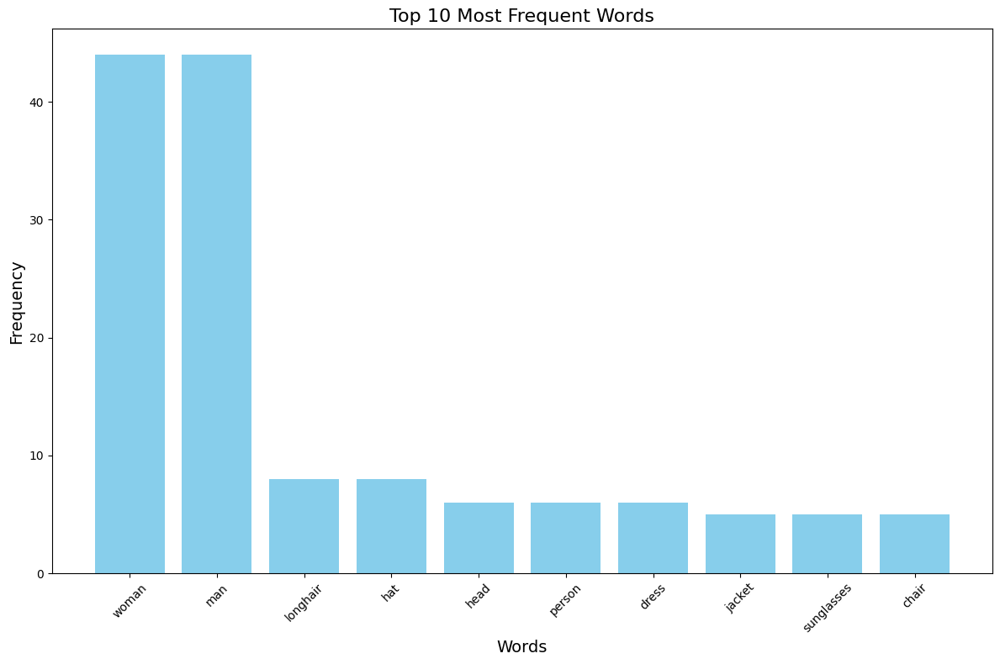

--------------   Electronic   -------------- 
--------------   WITHOUT SEED    -------------- 
        Word  Frequency
0      woman         28
1        man         23
2      chart         12
3     person         10
4      dress          5
5        hat          4
6   longhair          4
7       head          4
8     jacket          4
9       sign          4
10     chair          4
11      wall          3


/var/folders/00/6v4ypdjx7mlb7kcwyj2mg58m0000gn/T/ipykernel_13801/914135198.py:132: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['unique_words'] = df[column_name].apply(process_row)


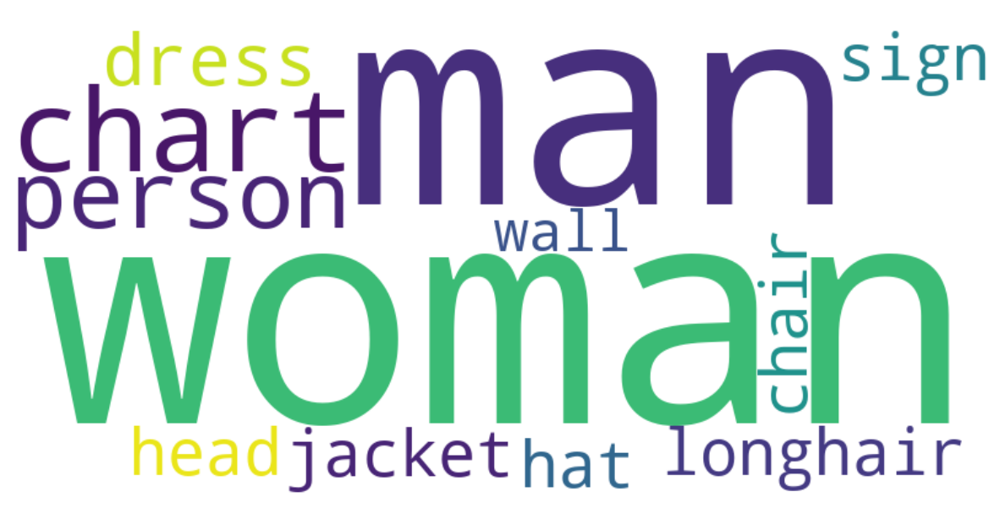

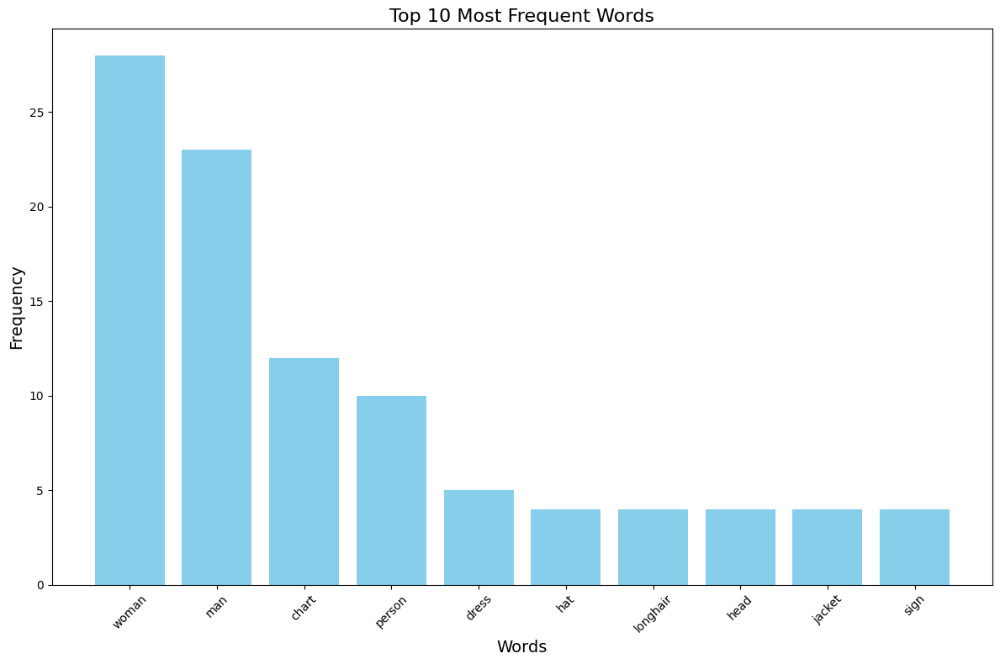

--------------   Show Tunes   -------------- 
--------------   WITH SEED    -------------- 
       Word  Frequency
0       man         41
1     woman         39
2     dress          8
3    guitar          6
4      suit          4
5   cartoon          3
6    street          3
7      boat          3
8       hat          3
9     field          3
10      tie          3


/var/folders/00/6v4ypdjx7mlb7kcwyj2mg58m0000gn/T/ipykernel_13801/914135198.py:132: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['unique_words'] = df[column_name].apply(process_row)


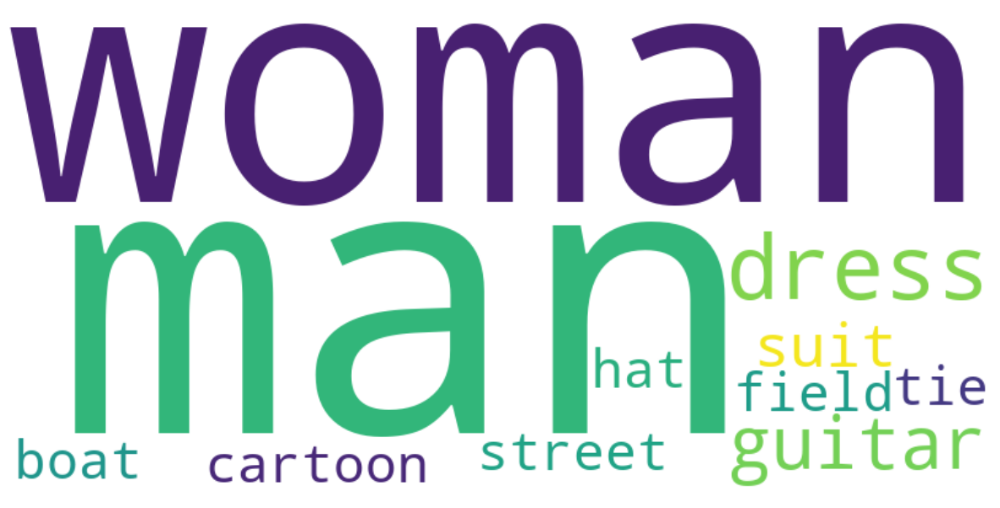

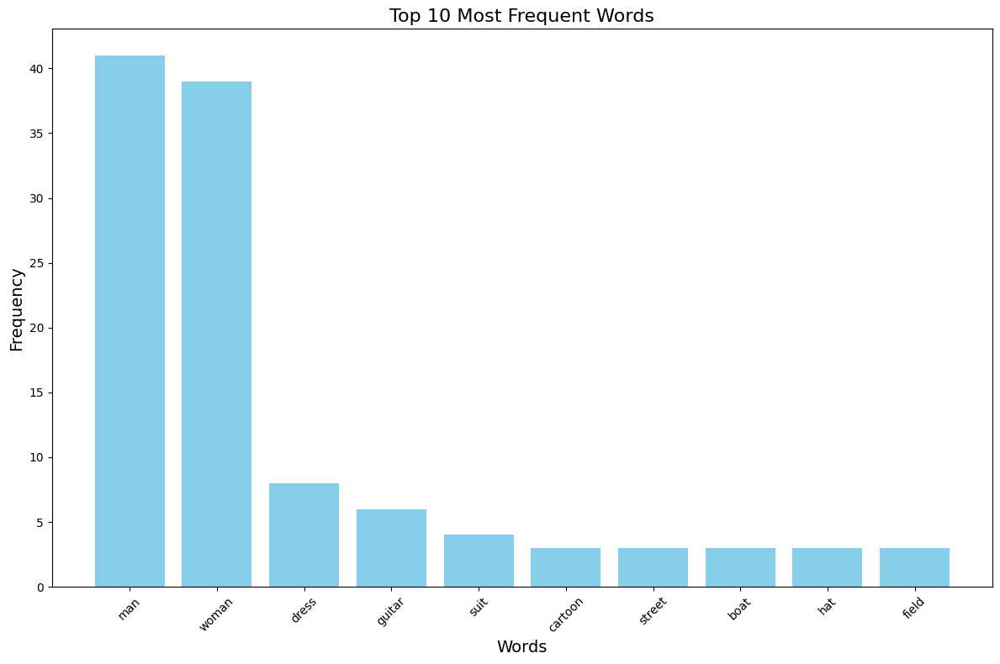

--------------   Show Tunes   -------------- 
--------------   WITHOUT SEED    -------------- 
     Word  Frequency
0   woman         15
1     man         15
2  person          5
3   dress          3


/var/folders/00/6v4ypdjx7mlb7kcwyj2mg58m0000gn/T/ipykernel_13801/914135198.py:132: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['unique_words'] = df[column_name].apply(process_row)


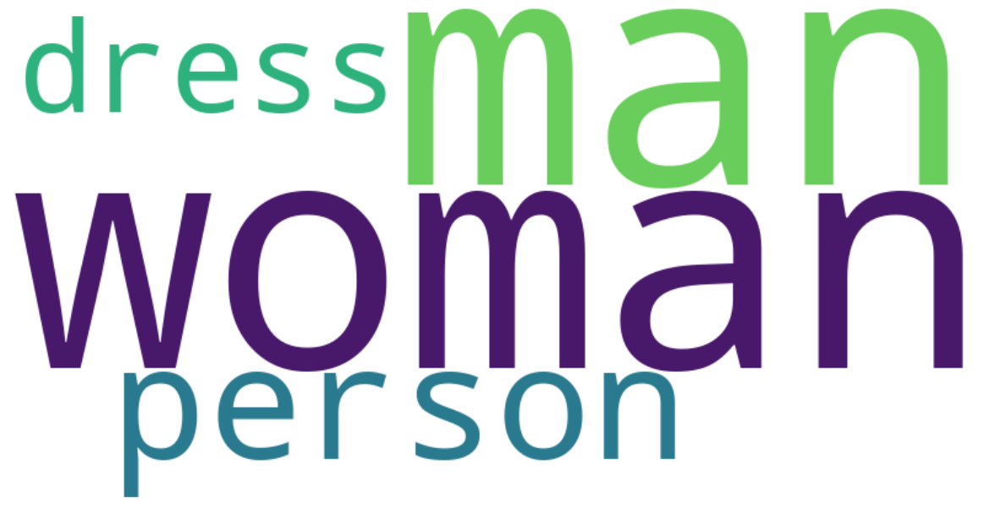

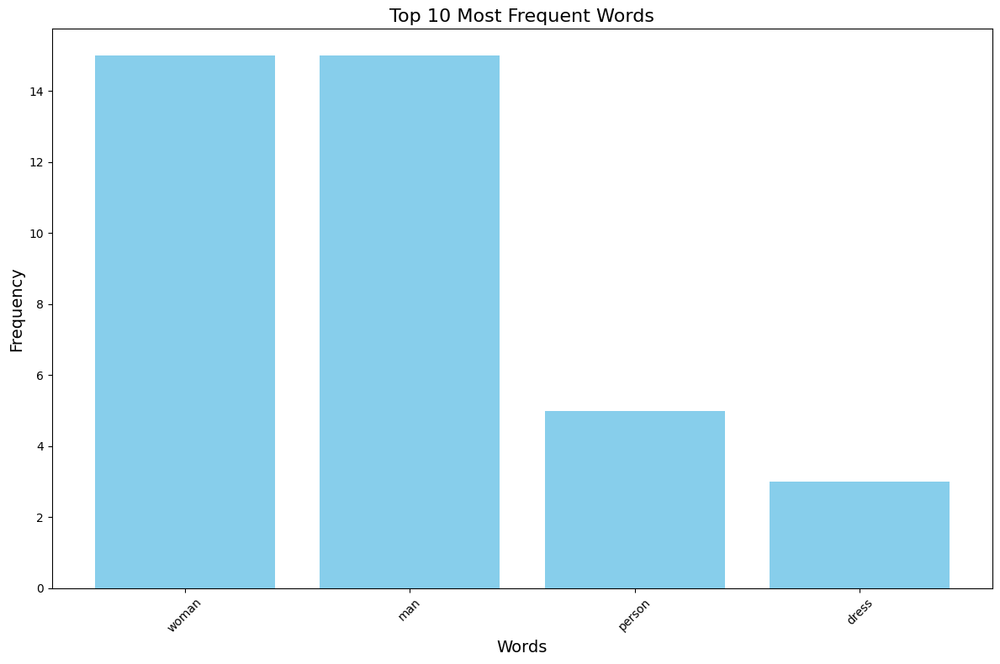

--------------   Soul   -------------- 
--------------   WITH SEED    -------------- 
             Word  Frequency
0             man         57
1           woman         54
2             hat          8
3          jacket          8
4           dress          8
5      sunglasses          7
6            suit          7
7           chair          7
8   leatherjacket          5
9          guitar          5
10            car          4
11          beard          4
12     microphone          4
13           wall          3
14            gun          3
15       longhair          3
16          piano          3
17           head          3
18            tie          3


/var/folders/00/6v4ypdjx7mlb7kcwyj2mg58m0000gn/T/ipykernel_13801/914135198.py:132: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['unique_words'] = df[column_name].apply(process_row)


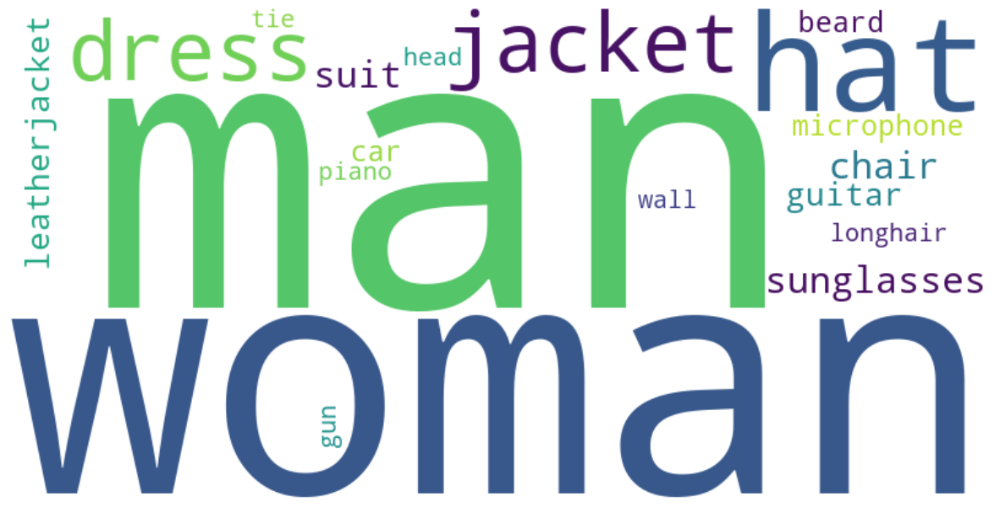

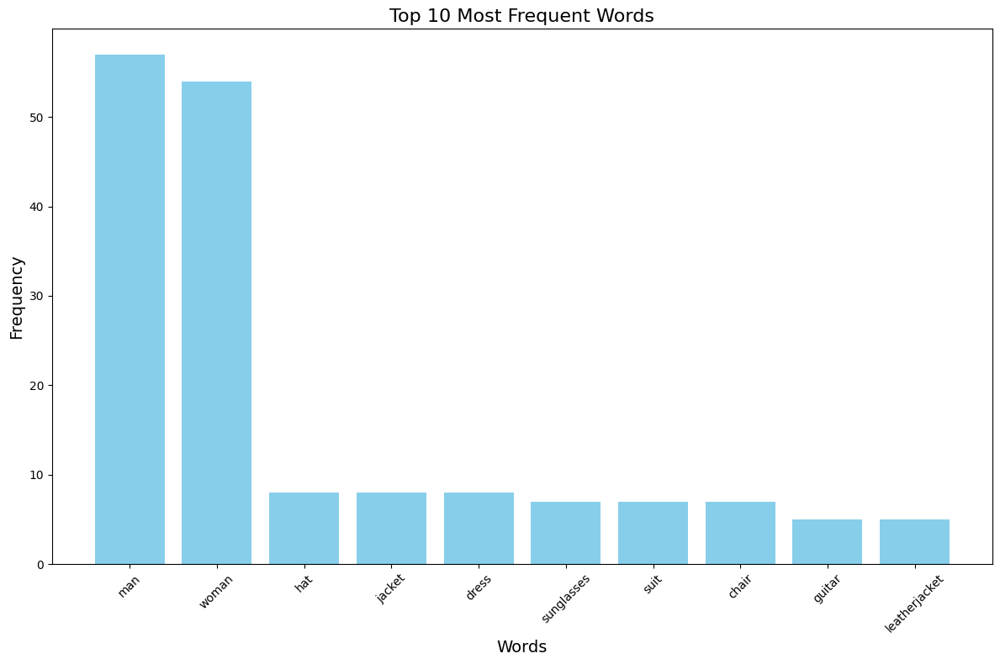

--------------   Soul   -------------- 
--------------   WITHOUT SEED    -------------- 
             Word  Frequency
0           woman         45
1             man         30
2          person         18
3           dress          8
4             hat          8
5            wall          7
6          jacket          5
7           phone          5
8           chair          5
9             car          4
10     sunglasses          4
11  leatherjacket          4
12           suit          3
13          beard          3
14          pants          3
15         guitar          3
16           head          3


/var/folders/00/6v4ypdjx7mlb7kcwyj2mg58m0000gn/T/ipykernel_13801/914135198.py:132: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['unique_words'] = df[column_name].apply(process_row)


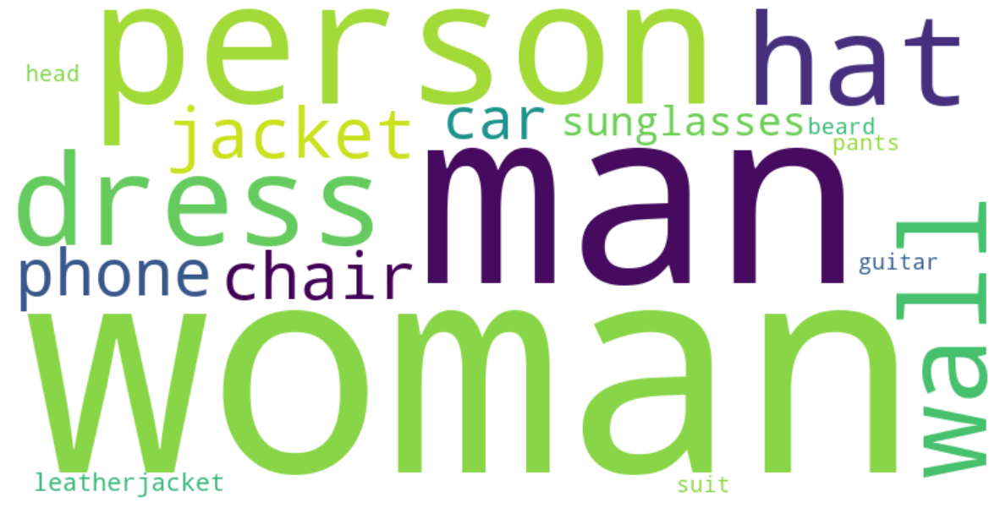

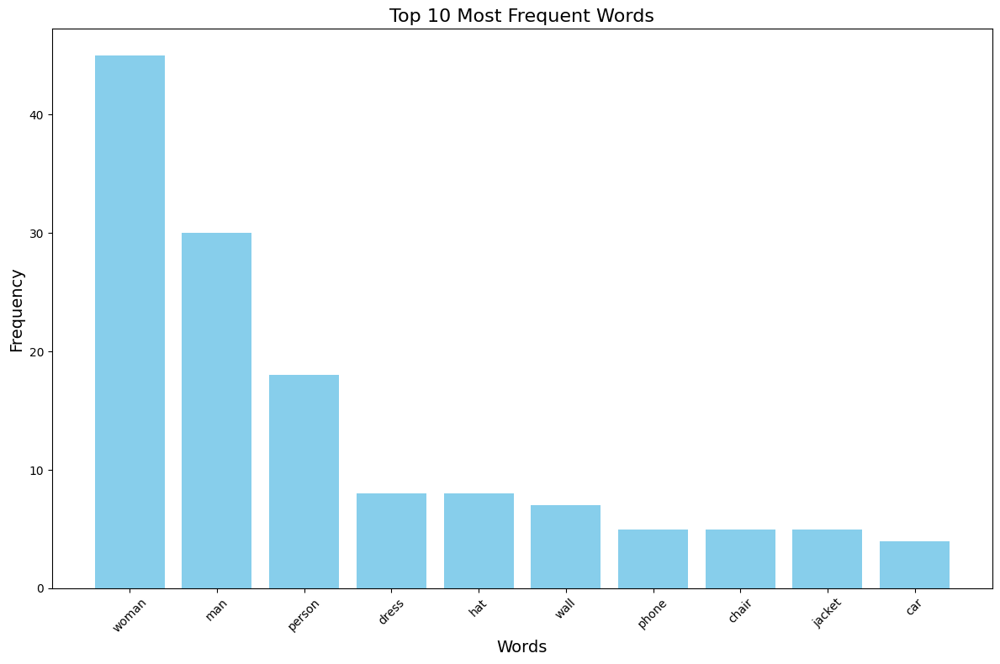

--------------   Metal   -------------- 
--------------   WITH SEED    -------------- 
        Word  Frequency
0        man         51
1      woman         10
2       head          8
3     person          8
4      skull          5
5      field          4
6      knife          3
7     street          3
8      dress          3
9       wall          3
10     demon          3
11       hat          3
12  longhair          3
13     cross          3


/var/folders/00/6v4ypdjx7mlb7kcwyj2mg58m0000gn/T/ipykernel_13801/914135198.py:132: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['unique_words'] = df[column_name].apply(process_row)


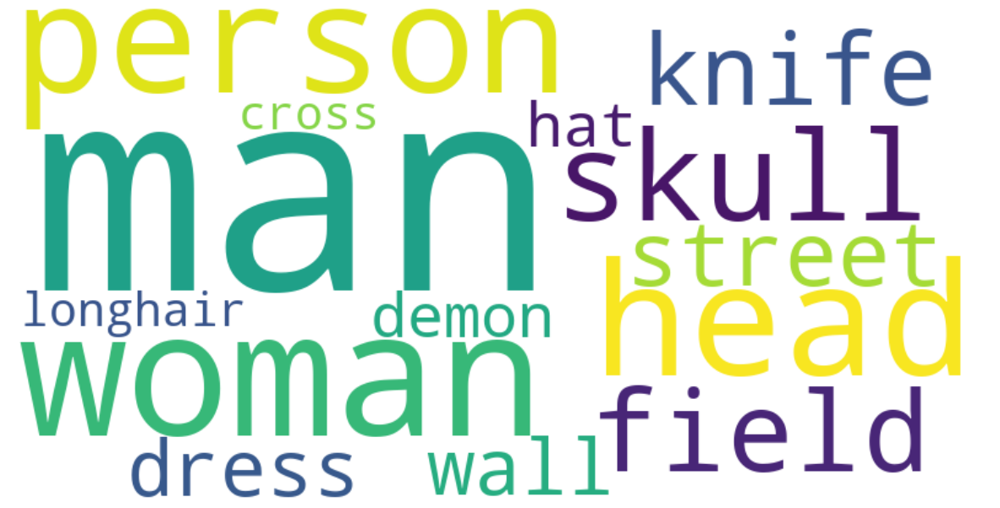

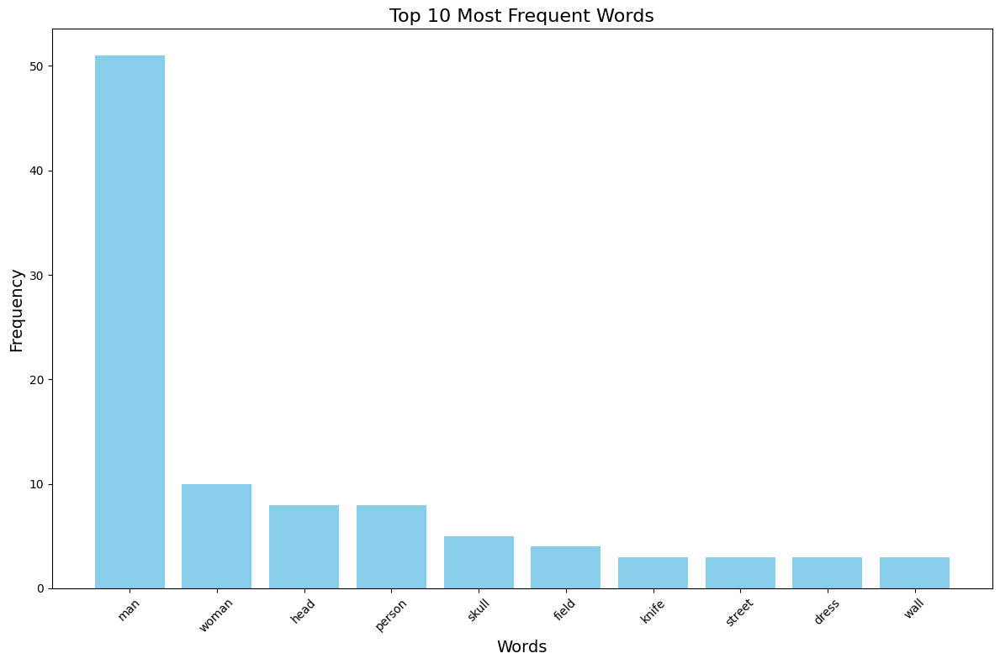

--------------   Metal   -------------- 
--------------   WITHOUT SEED    -------------- 
     Word  Frequency
0     man         28
1  person         11
2   metal          5
3   woman          5
4    wall          4
5   field          3
6   skull          3


/var/folders/00/6v4ypdjx7mlb7kcwyj2mg58m0000gn/T/ipykernel_13801/914135198.py:132: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['unique_words'] = df[column_name].apply(process_row)


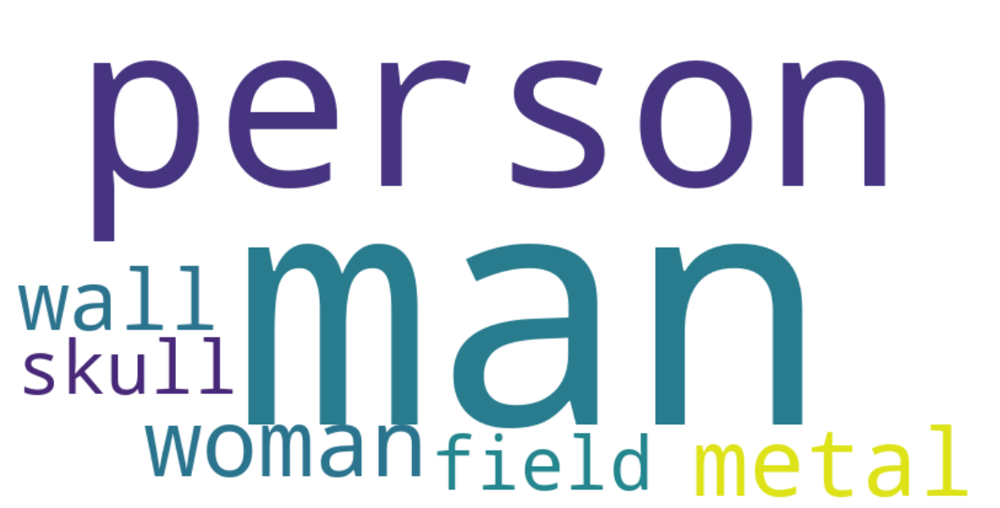

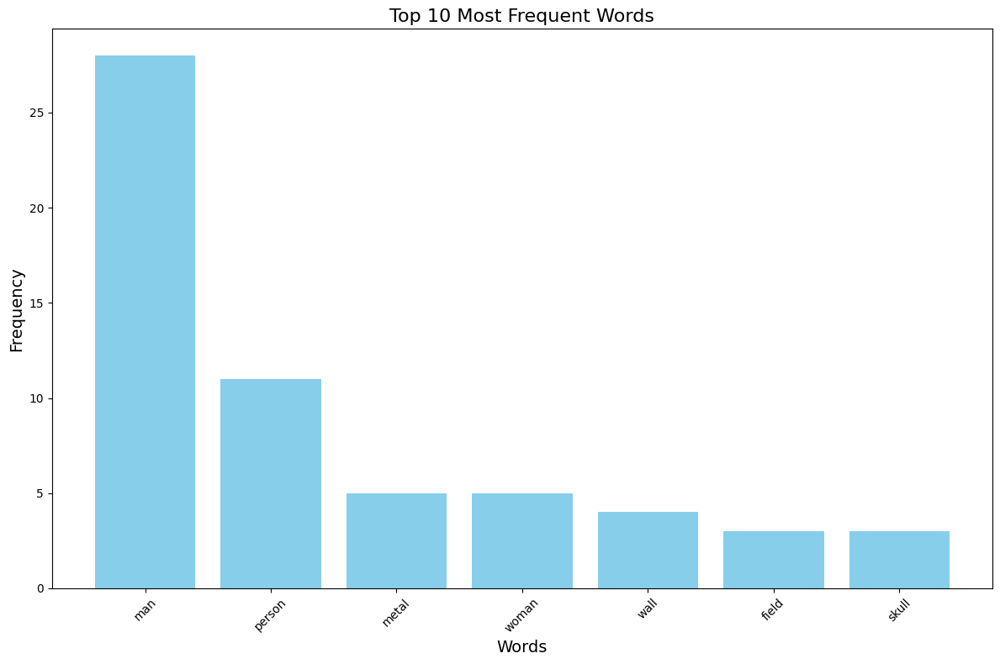

--------------   Jazz   -------------- 
--------------   WITH SEED    -------------- 
       Word  Frequency
0       man         44
1     woman         24
2      suit         14
3       tie         12
4     dress          7
5     chair          4
6   trumpet          4
7    jacket          4
8       hat          3
9     piano          3
10   guitar          3


/var/folders/00/6v4ypdjx7mlb7kcwyj2mg58m0000gn/T/ipykernel_13801/914135198.py:132: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['unique_words'] = df[column_name].apply(process_row)


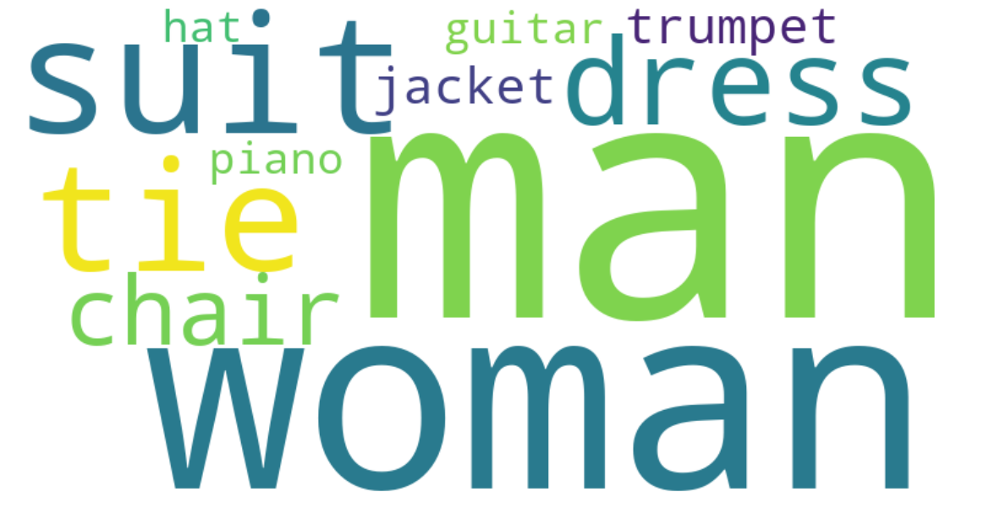

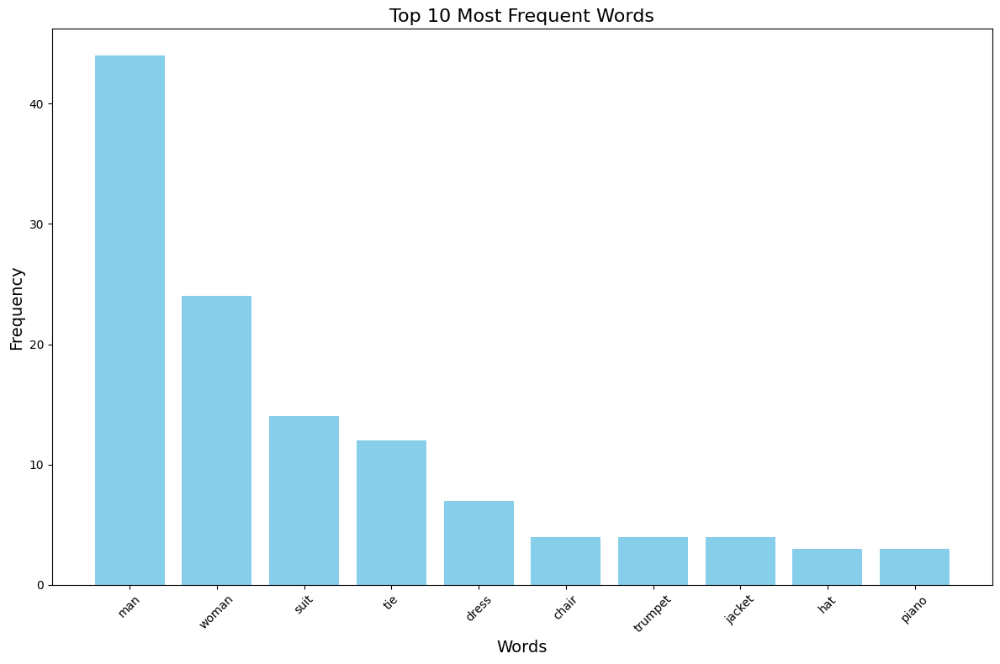

--------------   Jazz   -------------- 
--------------   WITHOUT SEED    -------------- 
     Word  Frequency
0     man         21
1   woman         20
2   dress          8
3  person          8
4    suit          5
5  window          3
6     tie          3
7   chair          3
8     hat          3


/var/folders/00/6v4ypdjx7mlb7kcwyj2mg58m0000gn/T/ipykernel_13801/914135198.py:132: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['unique_words'] = df[column_name].apply(process_row)


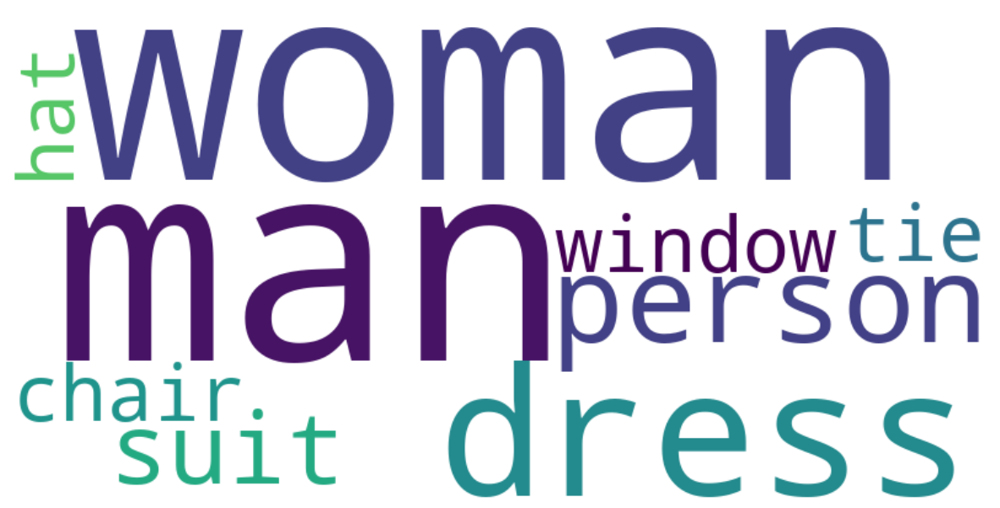

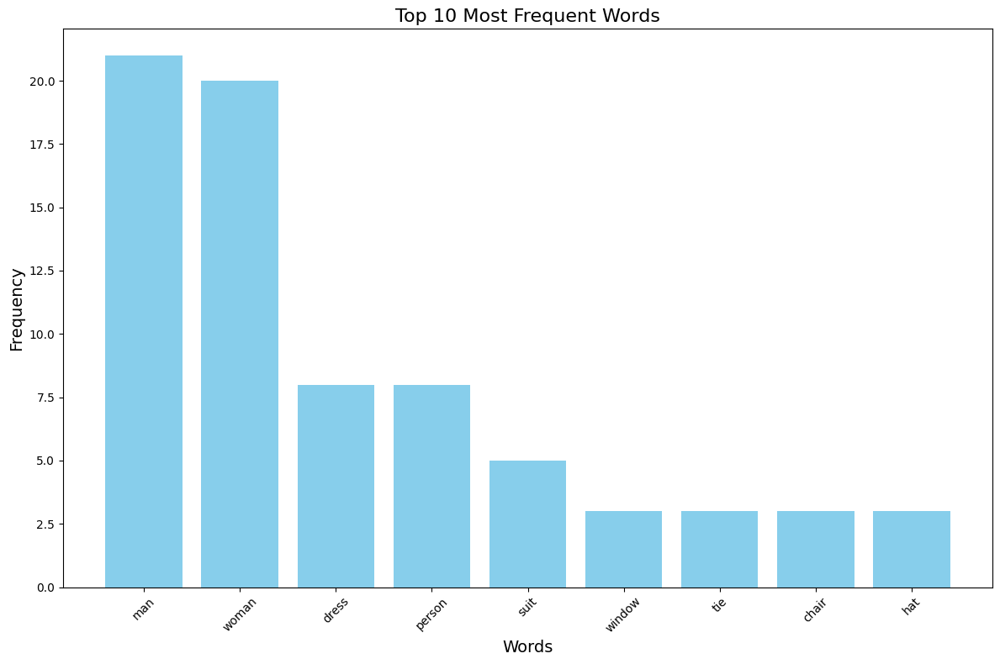

--------------   Rap   -------------- 
--------------   WITH SEED    -------------- 
     Word  Frequency
0     man         40
1     hat          6
2   woman          5
3    suit          3
4   dress          3
5  person          3


/var/folders/00/6v4ypdjx7mlb7kcwyj2mg58m0000gn/T/ipykernel_13801/914135198.py:132: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['unique_words'] = df[column_name].apply(process_row)


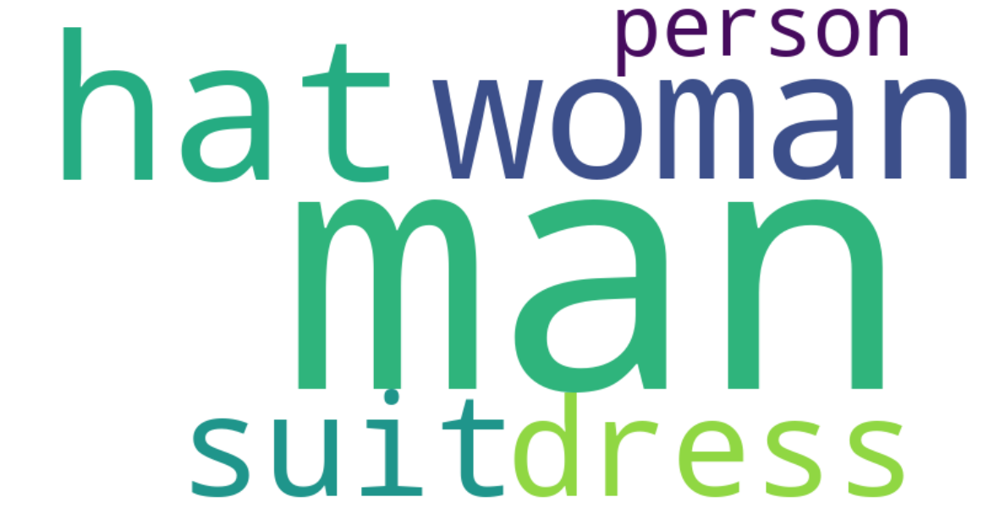

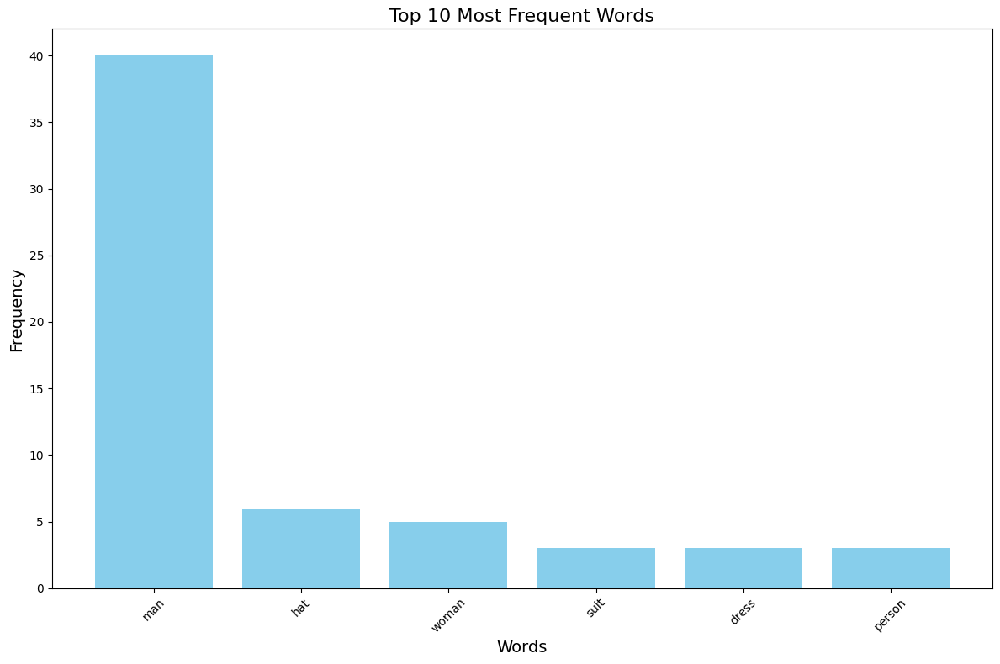

--------------   Rap   -------------- 
--------------   WITHOUT SEED    -------------- 
     Word  Frequency
0     man         26
1  person          7
2   woman          4


/var/folders/00/6v4ypdjx7mlb7kcwyj2mg58m0000gn/T/ipykernel_13801/914135198.py:132: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['unique_words'] = df[column_name].apply(process_row)


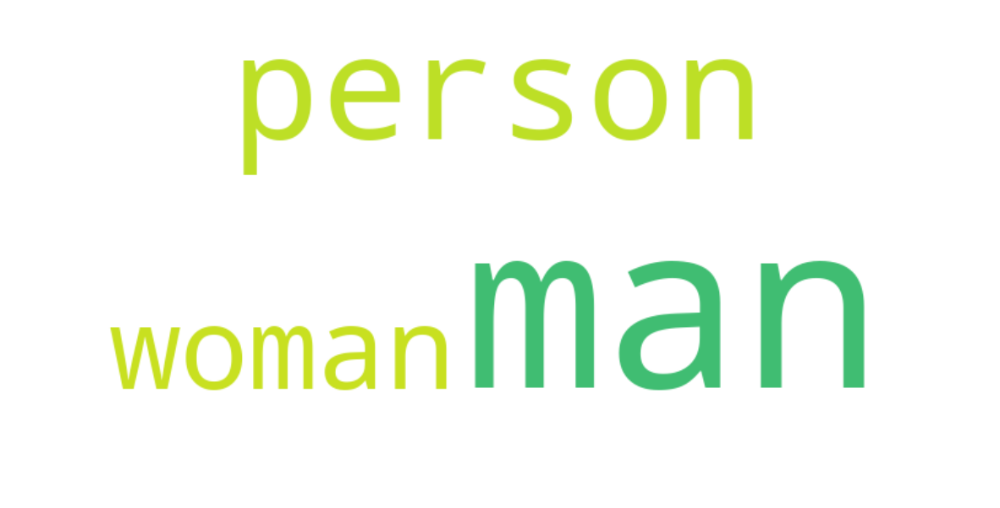

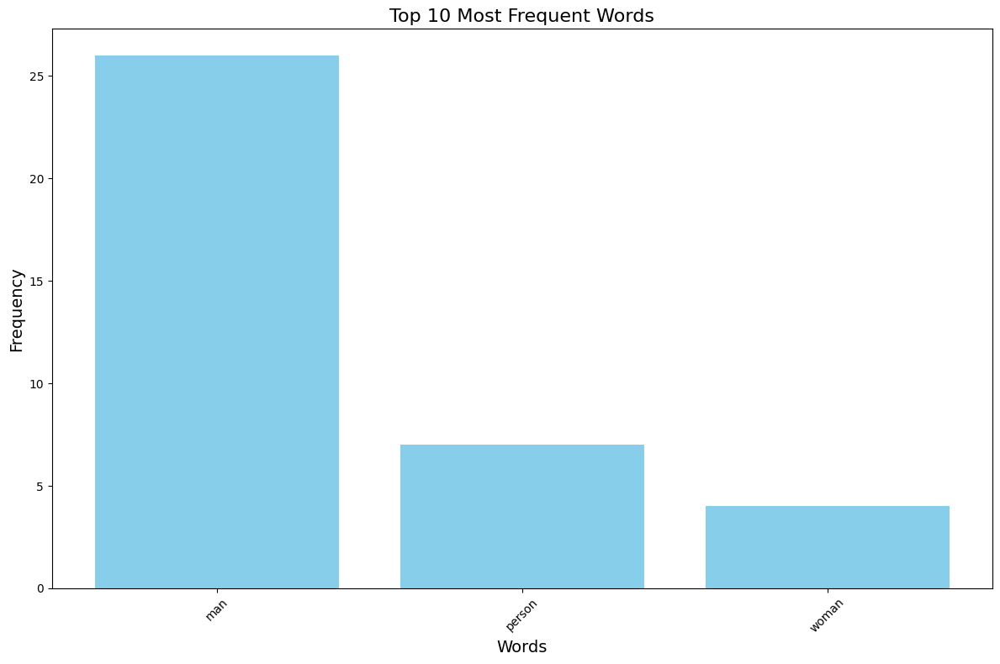

--------------   Folk   -------------- 
--------------   WITH SEED    -------------- 
     Word  Frequency
0     man         26
1   woman         13
2  guitar         10
3     hat          4


/var/folders/00/6v4ypdjx7mlb7kcwyj2mg58m0000gn/T/ipykernel_13801/914135198.py:132: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['unique_words'] = df[column_name].apply(process_row)


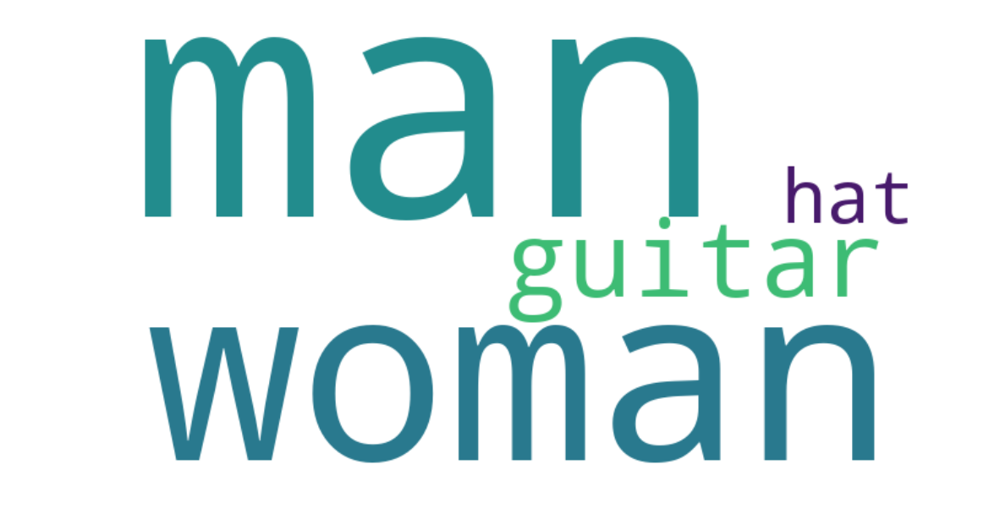

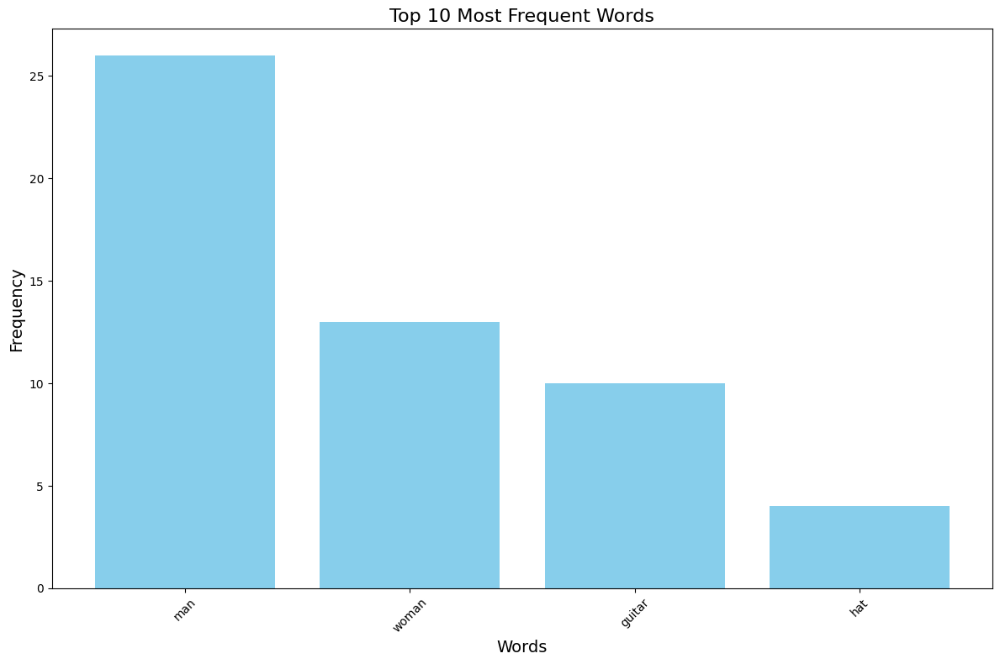

--------------   Folk   -------------- 
--------------   WITHOUT SEED    -------------- 
     Word  Frequency
0     man         15
1   woman          7
2  guitar          5
3  person          3
4    wall          3


/var/folders/00/6v4ypdjx7mlb7kcwyj2mg58m0000gn/T/ipykernel_13801/914135198.py:132: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['unique_words'] = df[column_name].apply(process_row)


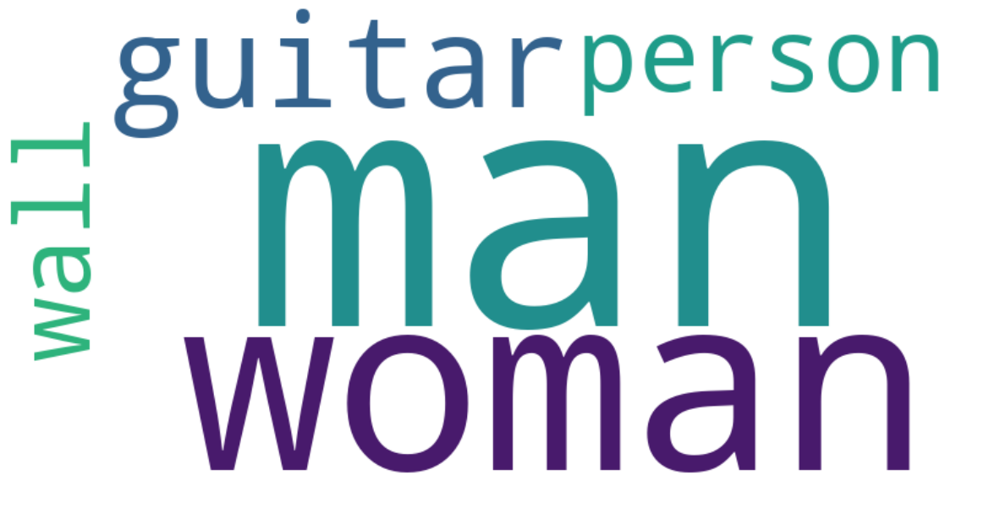

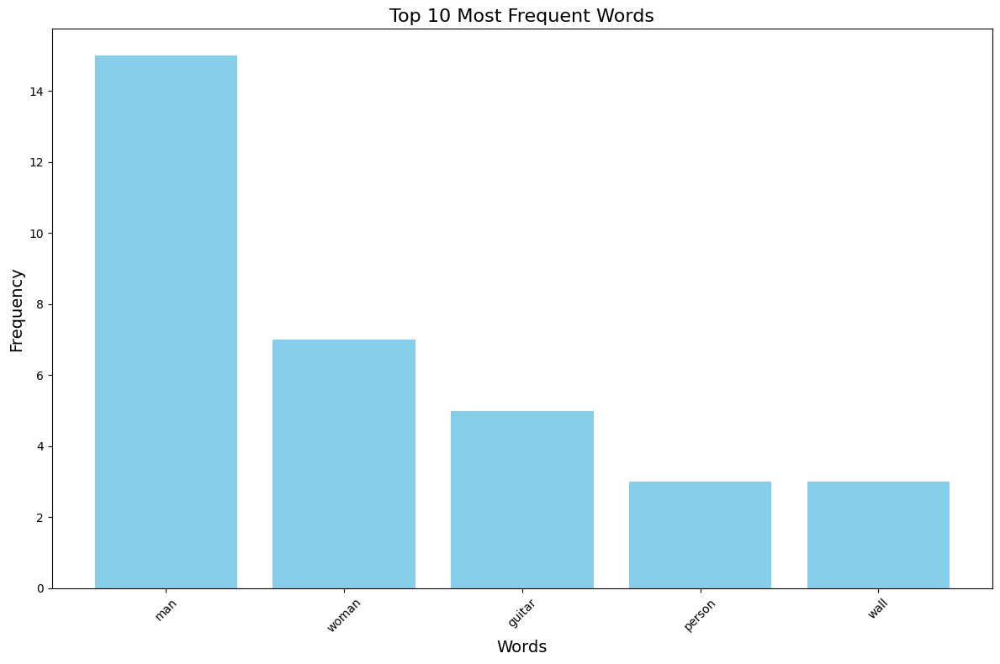

--------------   Various Artists   -------------- 
--------------   WITH SEED    -------------- 
     Word  Frequency
0  circle          3
1   woman          3
2    flag          3
3     man          3


/var/folders/00/6v4ypdjx7mlb7kcwyj2mg58m0000gn/T/ipykernel_13801/914135198.py:132: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['unique_words'] = df[column_name].apply(process_row)


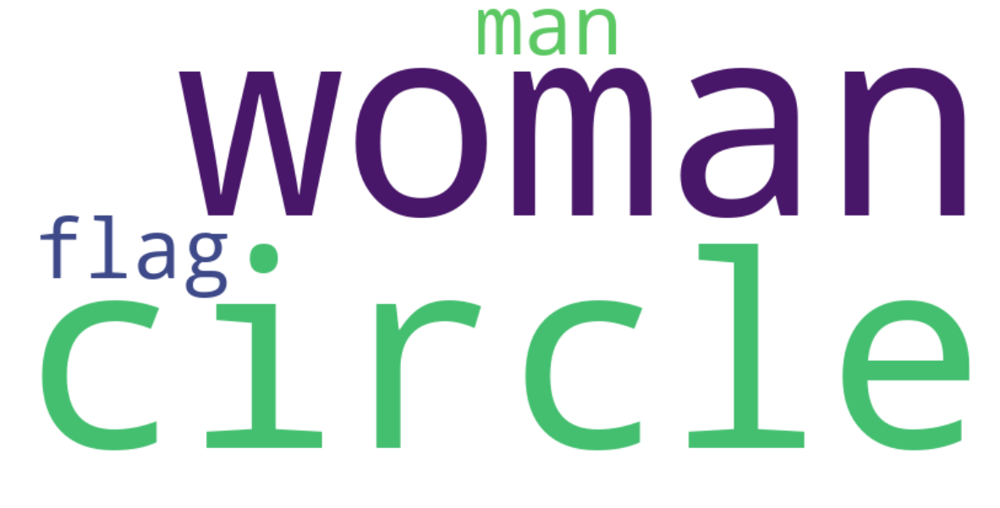

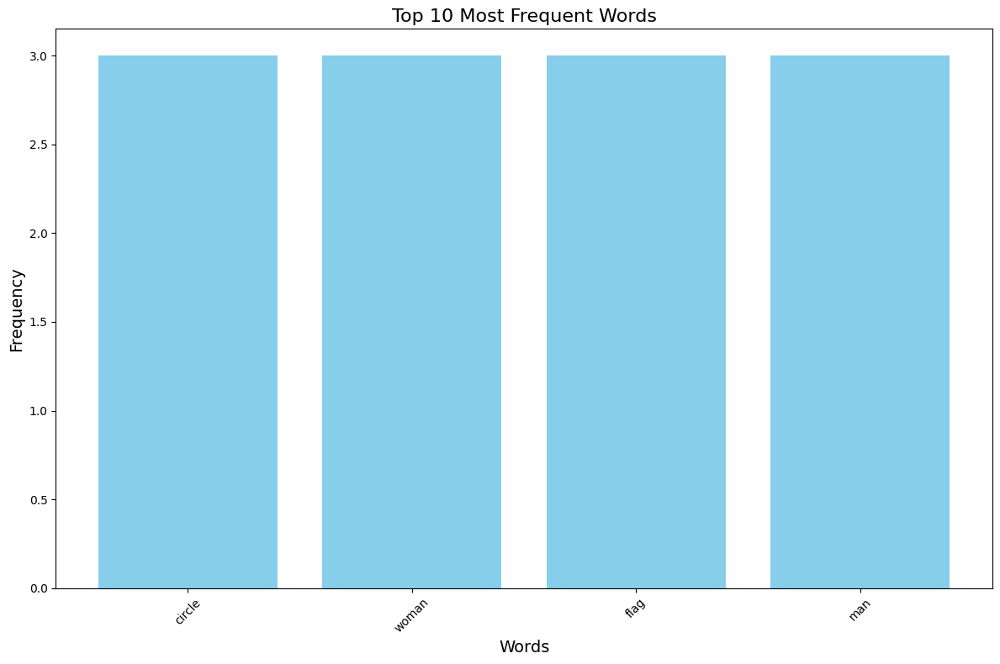

--------------   Various Artists   -------------- 
--------------   WITHOUT SEED    -------------- 
   Word  Frequency
0  flag          3


/var/folders/00/6v4ypdjx7mlb7kcwyj2mg58m0000gn/T/ipykernel_13801/914135198.py:132: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['unique_words'] = df[column_name].apply(process_row)


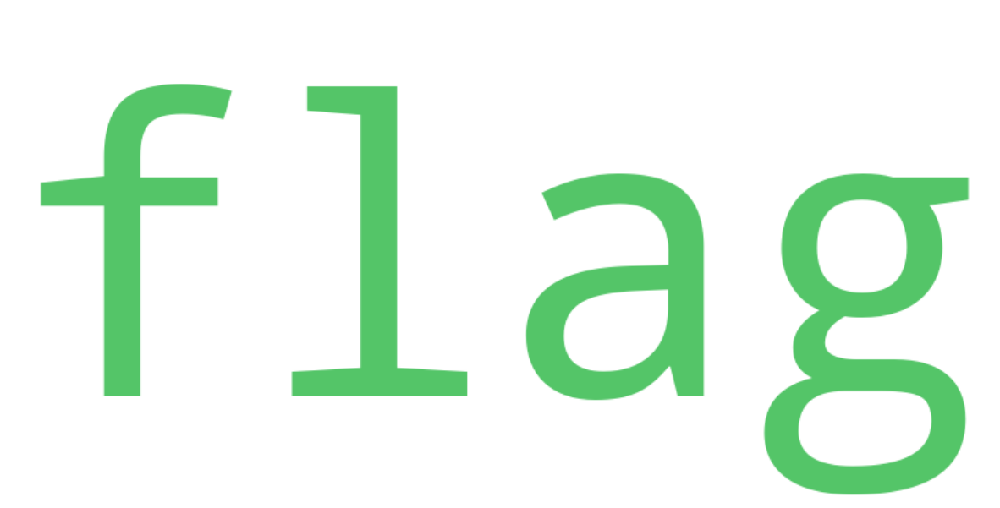

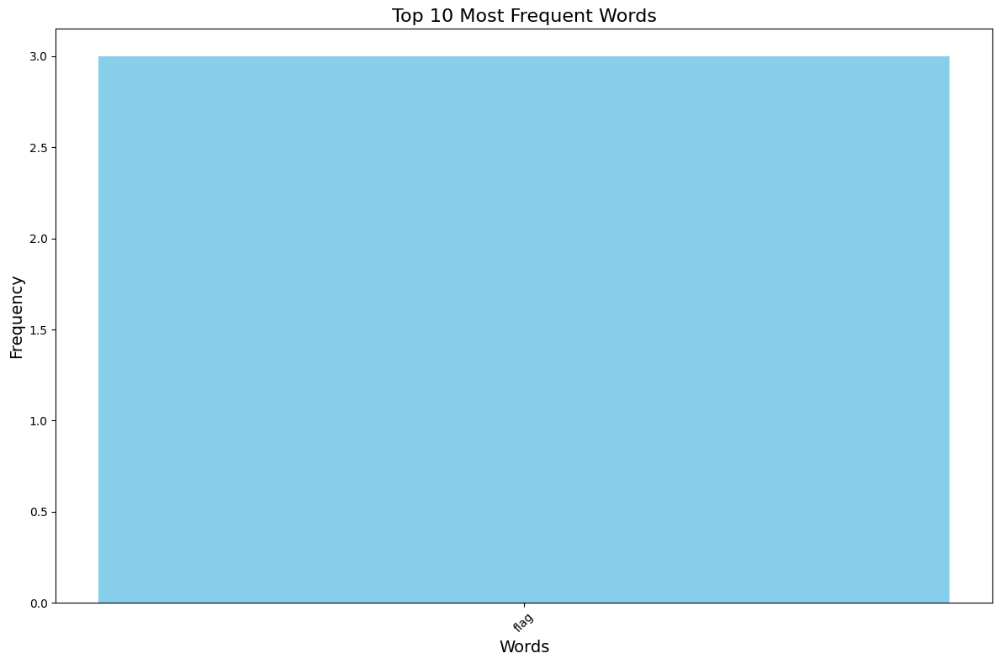

--------------   Funk   -------------- 
--------------   WITH SEED    -------------- 
         Word  Frequency
0         man         22
1       woman         10
2  microphone          4
3         car          3
4      jacket          3
5         hat          3


/var/folders/00/6v4ypdjx7mlb7kcwyj2mg58m0000gn/T/ipykernel_13801/914135198.py:132: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['unique_words'] = df[column_name].apply(process_row)


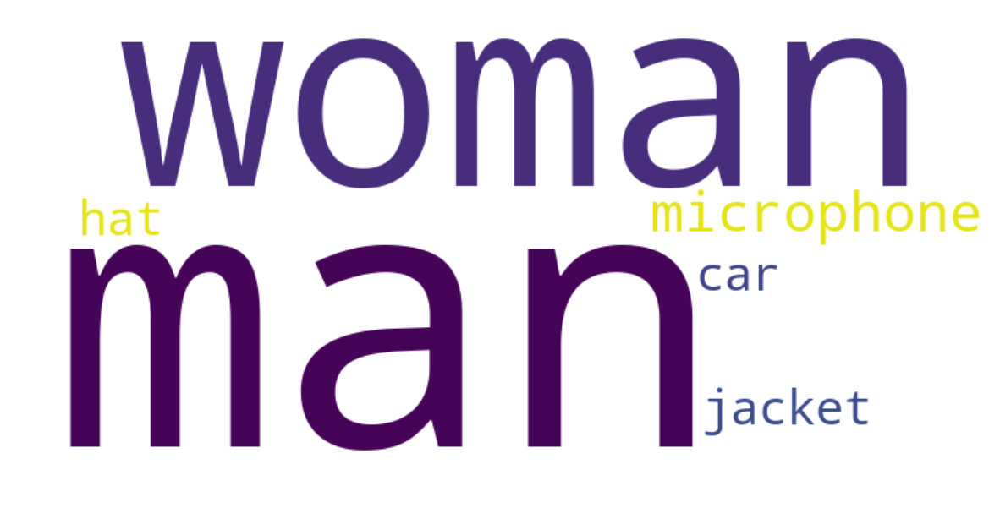

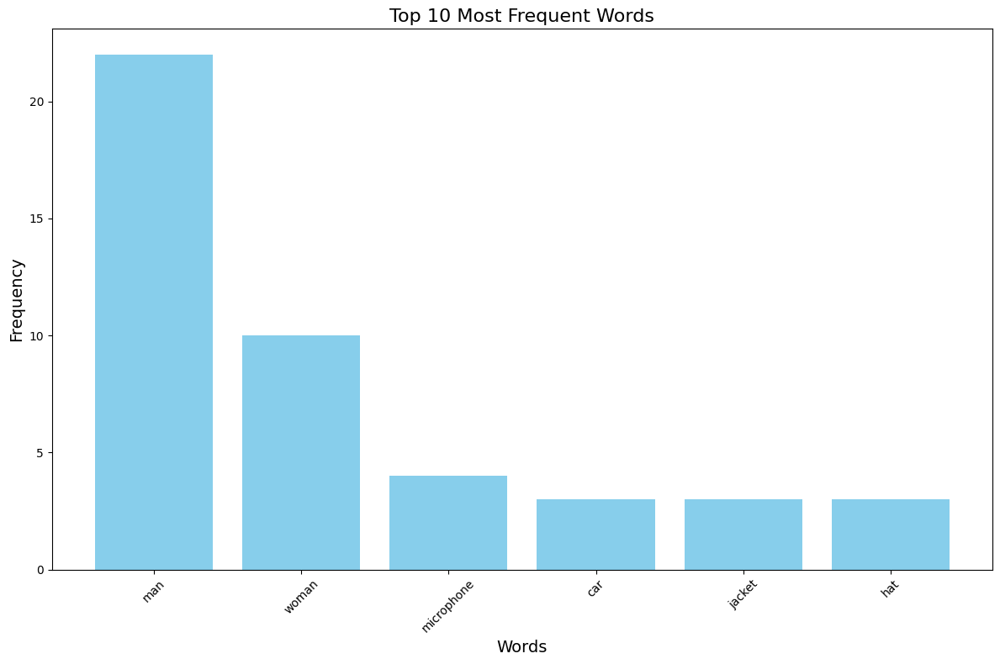

--------------   Funk   -------------- 
--------------   WITHOUT SEED    -------------- 
     Word  Frequency
0     man         12
1   woman          6
2  person          4
3     car          3
4     hat          3
5   dress          3


/var/folders/00/6v4ypdjx7mlb7kcwyj2mg58m0000gn/T/ipykernel_13801/914135198.py:132: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['unique_words'] = df[column_name].apply(process_row)


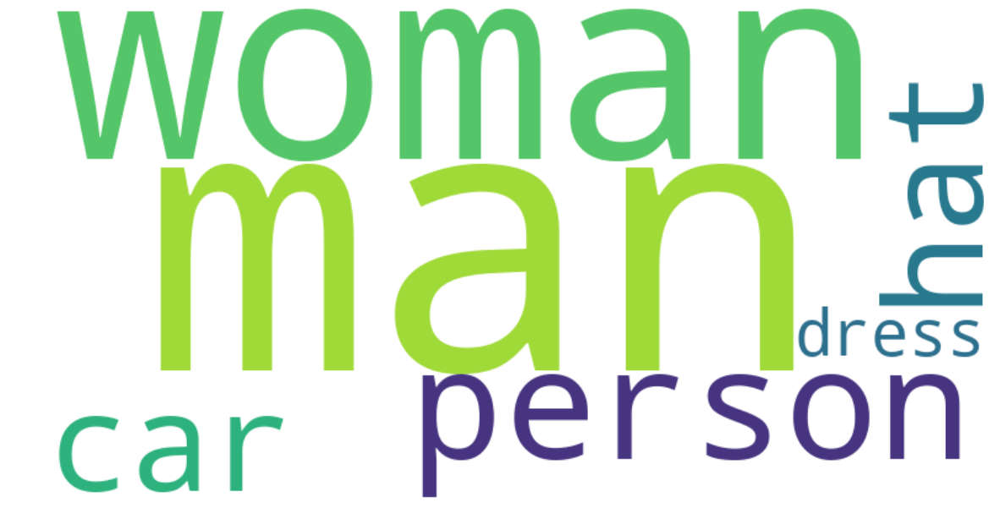

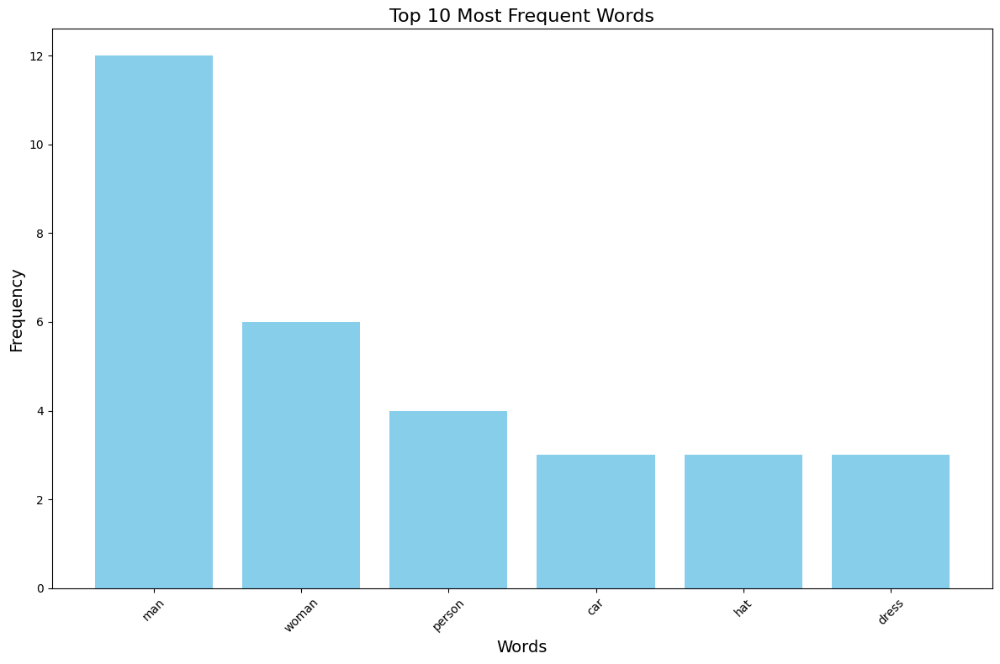

--------------   Latin   -------------- 
--------------   WITH SEED    -------------- 
         Word  Frequency
0         man         21
1       woman          8
2         hat          4
3  sunglasses          4
4    longhair          4
5      guitar          3
6      person          3
7        suit          3


/var/folders/00/6v4ypdjx7mlb7kcwyj2mg58m0000gn/T/ipykernel_13801/914135198.py:132: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['unique_words'] = df[column_name].apply(process_row)


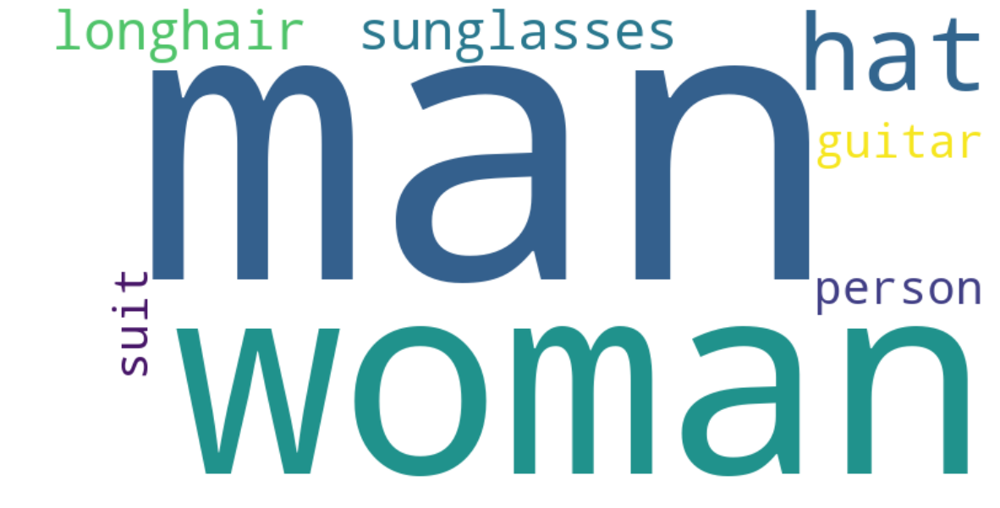

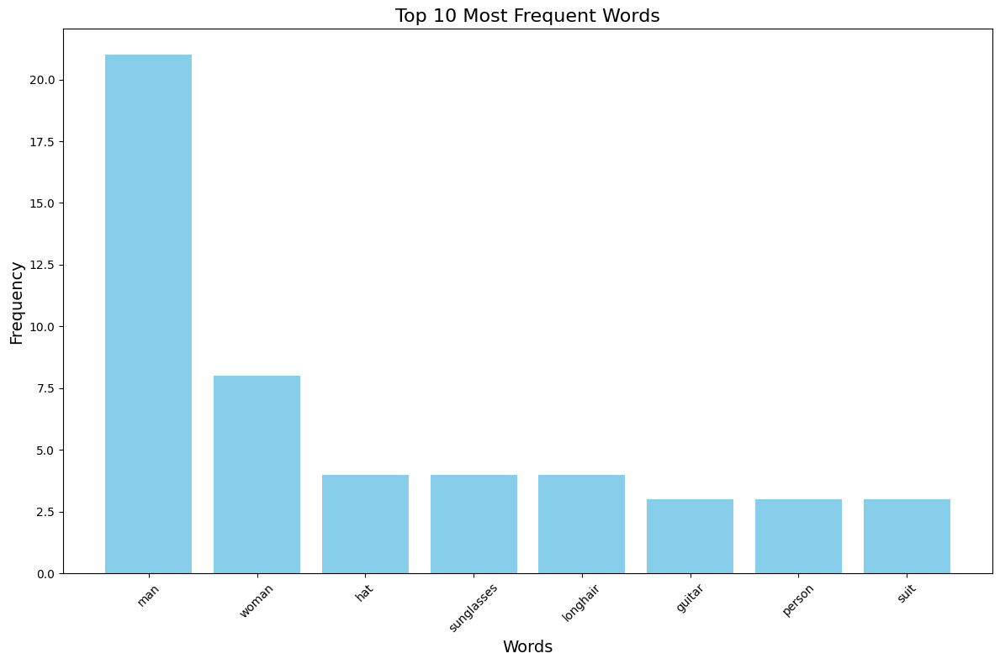

--------------   Latin   -------------- 
--------------   WITHOUT SEED    -------------- 
         Word  Frequency
0         man         13
1      person          8
2       woman          5
3      jacket          4
4    longhair          3
5     cartoon          3
6         hat          3
7  sunglasses          3


/var/folders/00/6v4ypdjx7mlb7kcwyj2mg58m0000gn/T/ipykernel_13801/914135198.py:132: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['unique_words'] = df[column_name].apply(process_row)


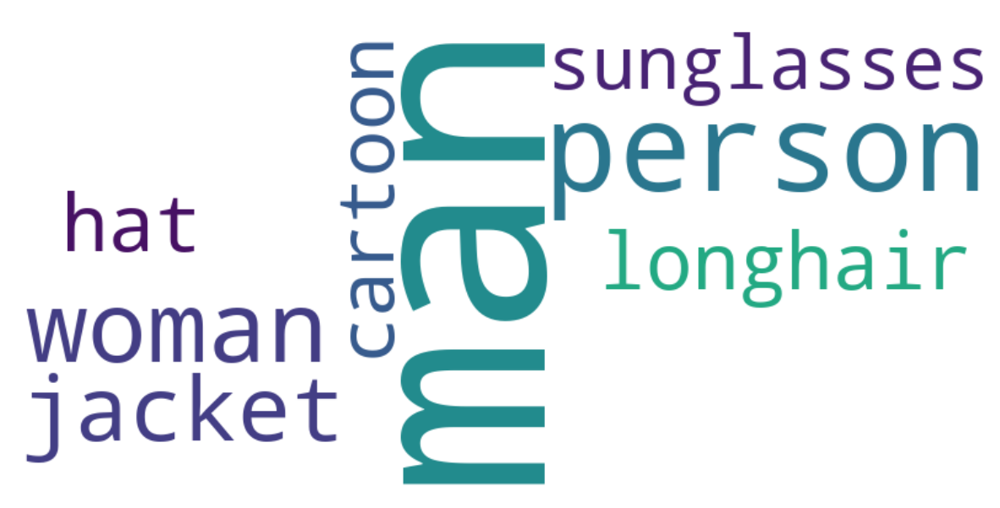

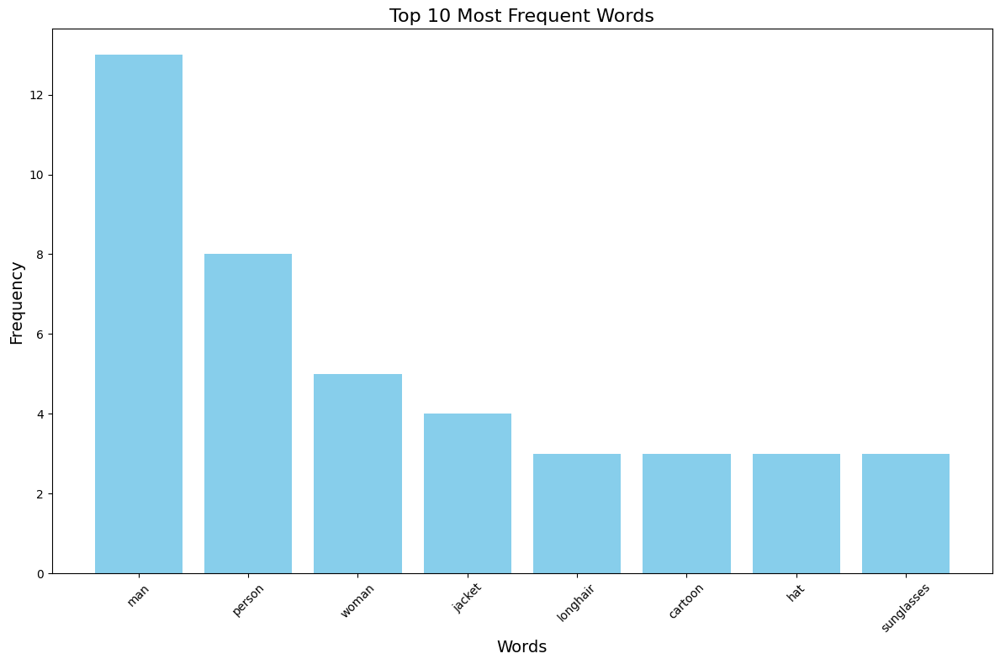

--------------   World Music   -------------- 
--------------   WITH SEED    -------------- 
    Word  Frequency
0  woman         10
1    man          6
2   tree          4
3  dress          3


/var/folders/00/6v4ypdjx7mlb7kcwyj2mg58m0000gn/T/ipykernel_13801/914135198.py:132: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['unique_words'] = df[column_name].apply(process_row)


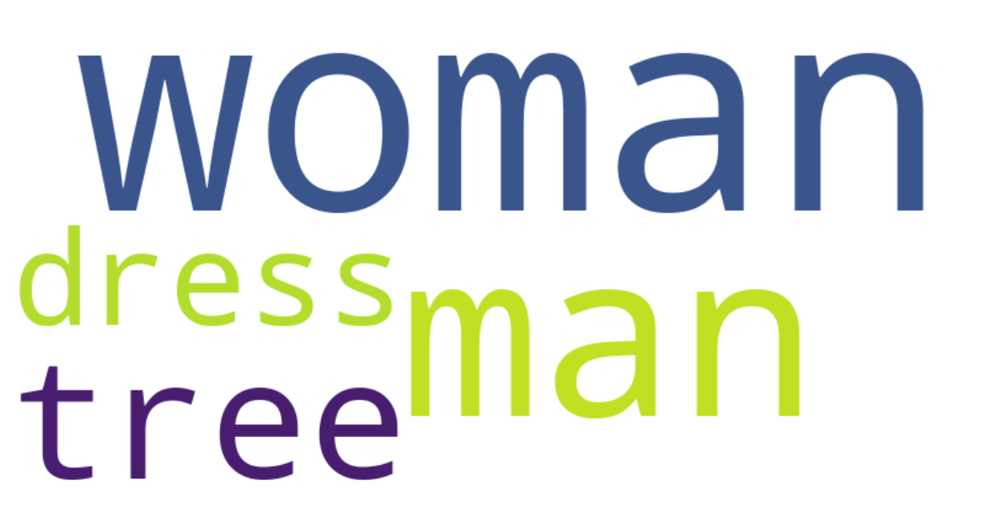

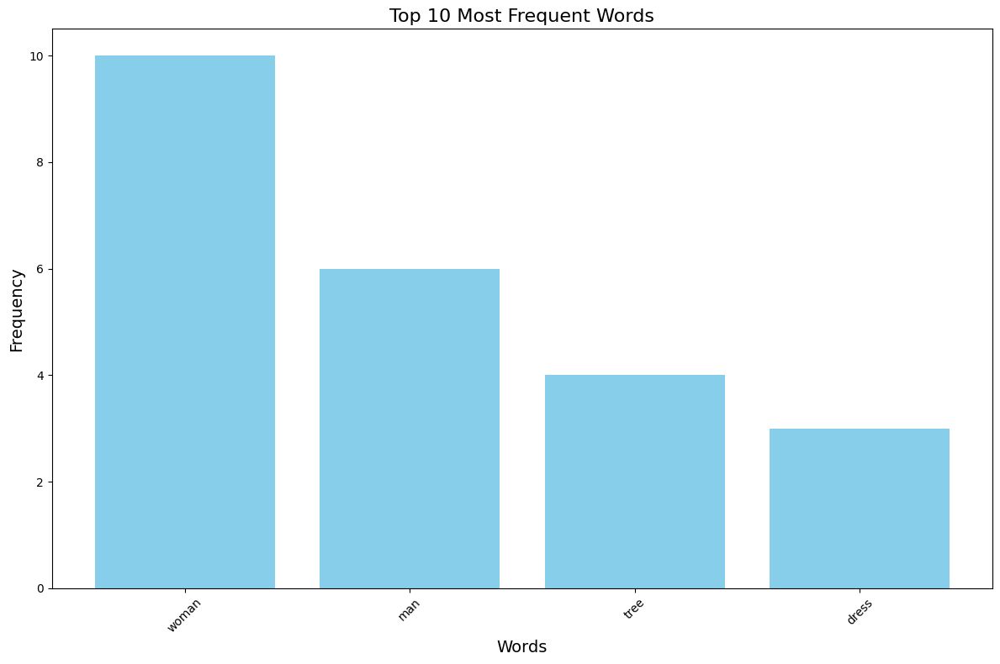

--------------   World Music   -------------- 
--------------   WITHOUT SEED    -------------- 
     Word  Frequency
0   woman         10
1     man          5
2  person          3
3    tree          3
4   dress          3


/var/folders/00/6v4ypdjx7mlb7kcwyj2mg58m0000gn/T/ipykernel_13801/914135198.py:132: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['unique_words'] = df[column_name].apply(process_row)


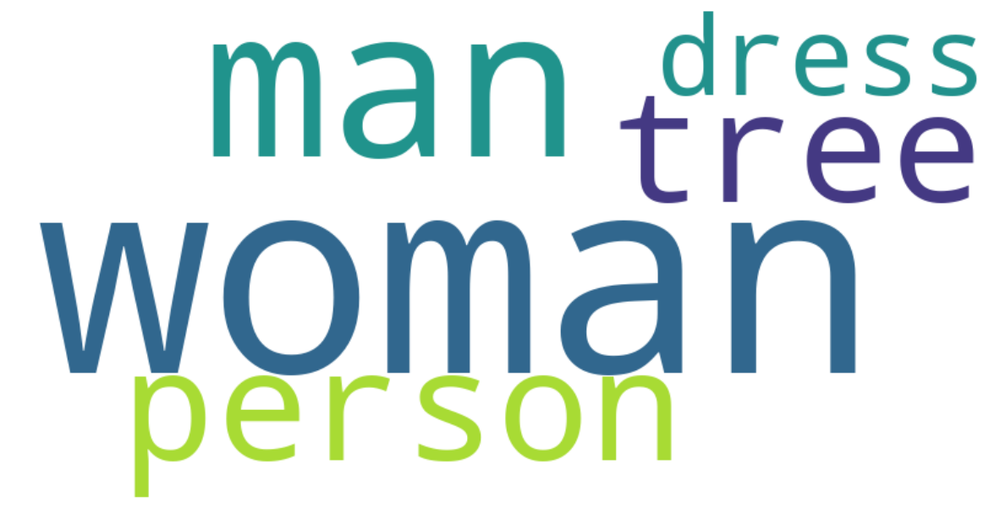

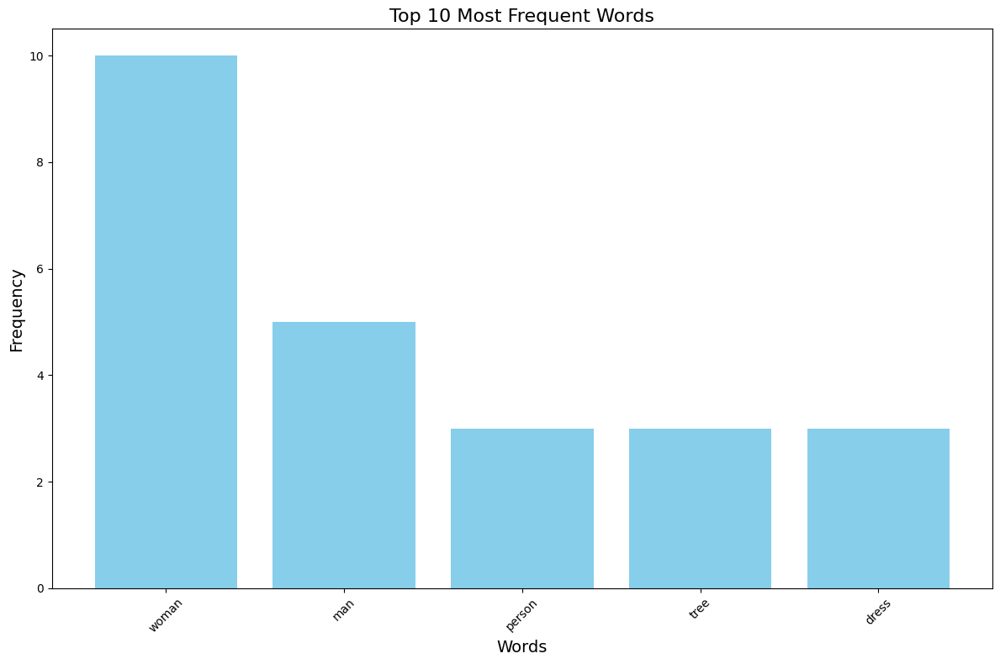

--------------   Rock And Roll   -------------- 
--------------   WITH SEED    -------------- 
     Word  Frequency
0     man         11
1  guitar          3


/var/folders/00/6v4ypdjx7mlb7kcwyj2mg58m0000gn/T/ipykernel_13801/914135198.py:132: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['unique_words'] = df[column_name].apply(process_row)


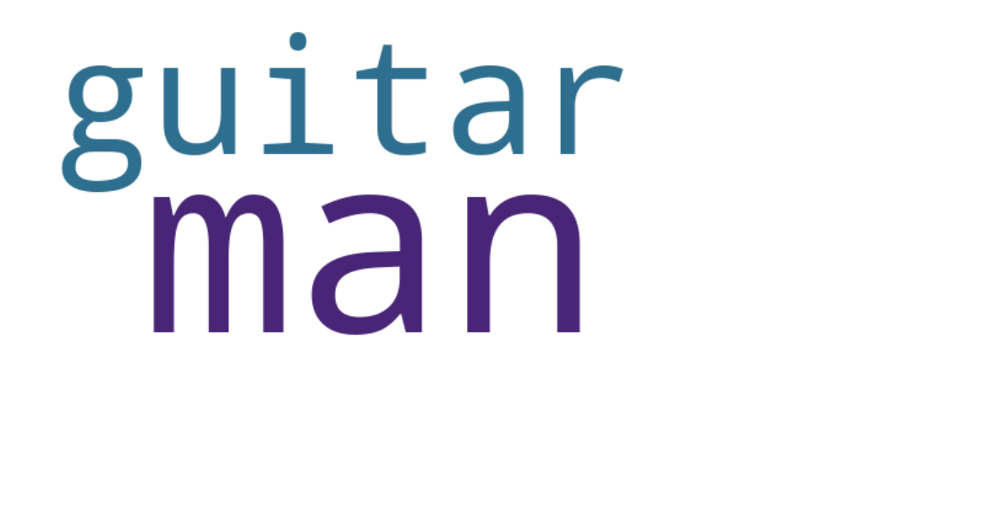

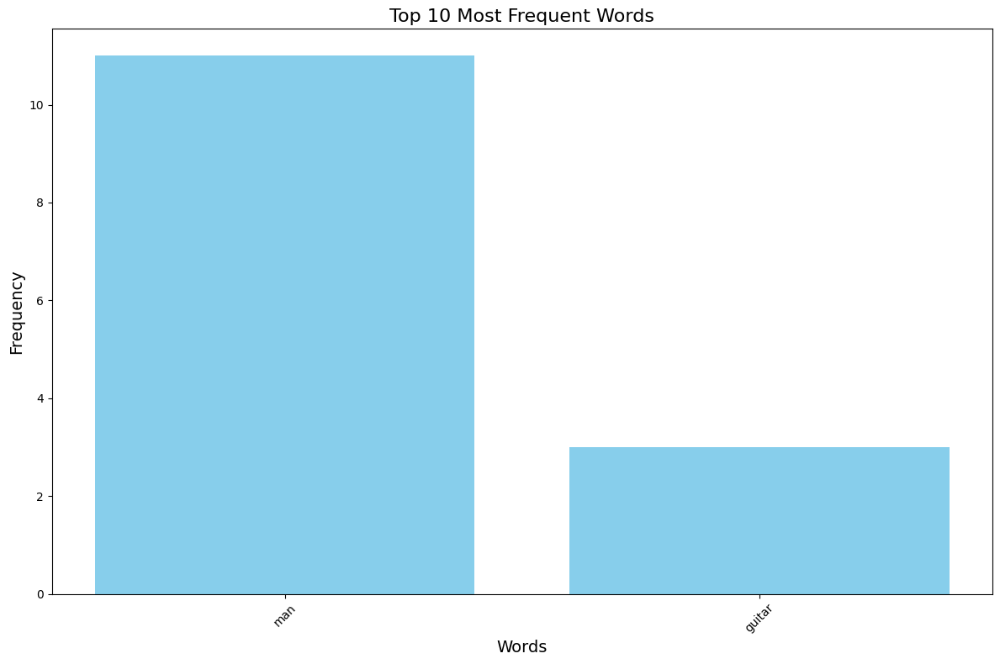

--------------   Rock And Roll   -------------- 
--------------   WITHOUT SEED    -------------- 
     Word  Frequency
0  person          4
1     man          4


/var/folders/00/6v4ypdjx7mlb7kcwyj2mg58m0000gn/T/ipykernel_13801/914135198.py:132: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['unique_words'] = df[column_name].apply(process_row)


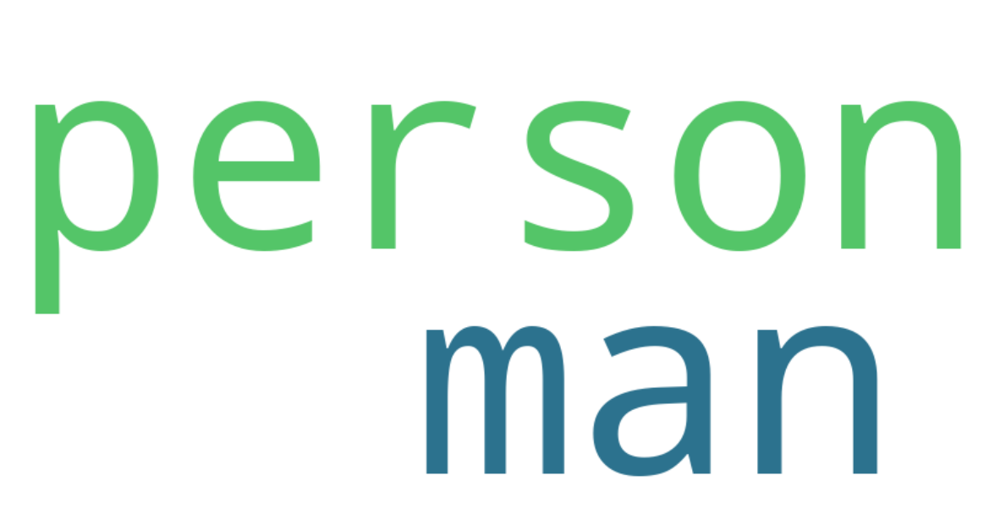

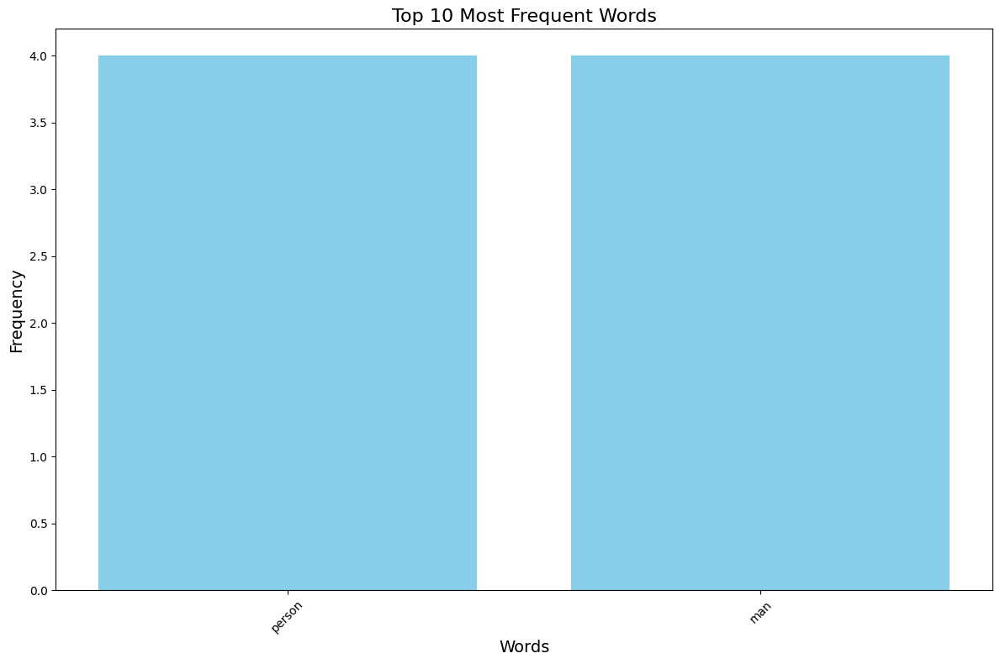

--------------   Christian   -------------- 
--------------   WITH SEED    -------------- 
    Word  Frequency
0    man          9
1  woman          5


/var/folders/00/6v4ypdjx7mlb7kcwyj2mg58m0000gn/T/ipykernel_13801/914135198.py:132: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['unique_words'] = df[column_name].apply(process_row)


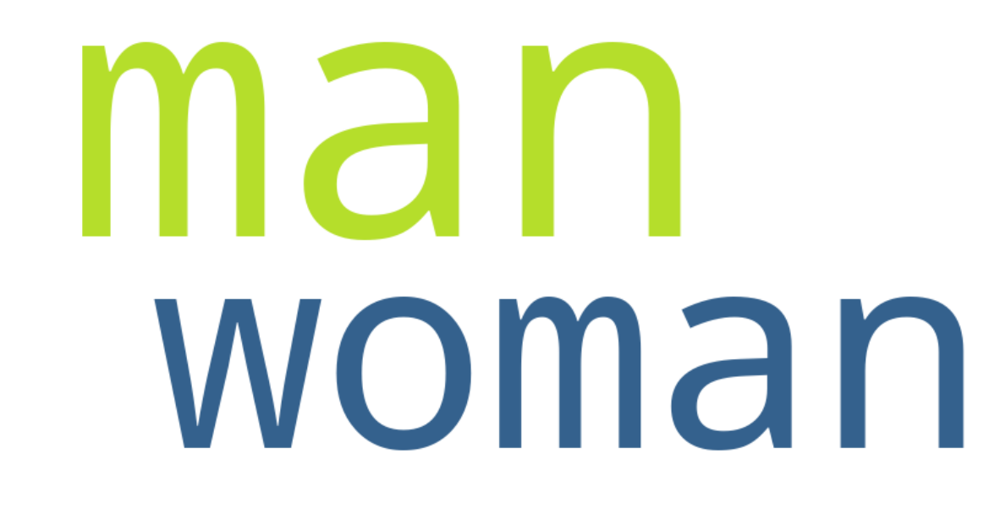

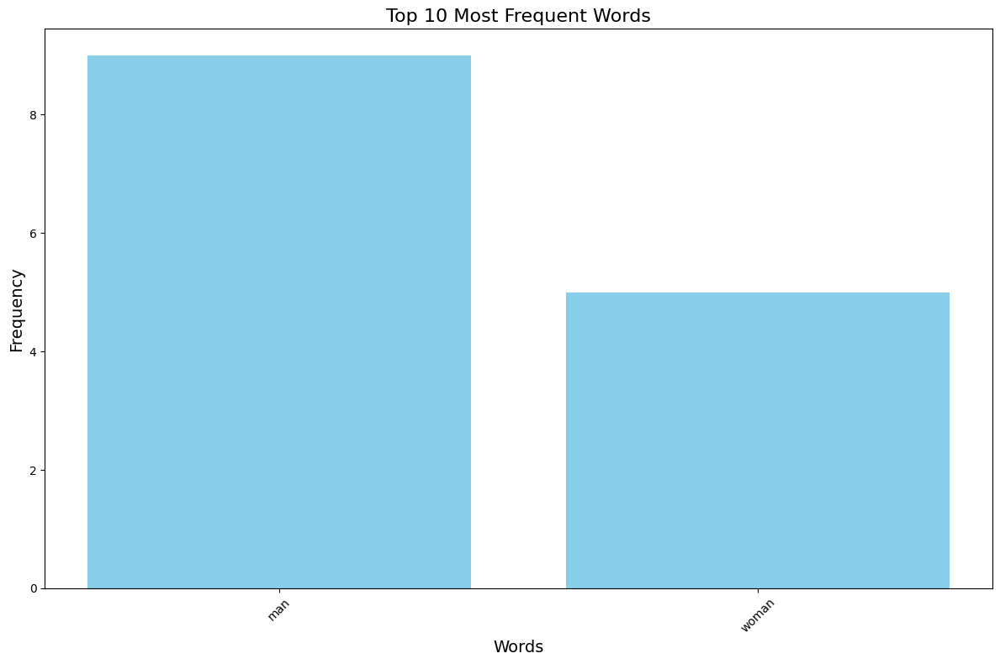

--------------   Christian   -------------- 
--------------   WITHOUT SEED    -------------- 
    Word  Frequency
0    man          6
1  woman          5


/var/folders/00/6v4ypdjx7mlb7kcwyj2mg58m0000gn/T/ipykernel_13801/914135198.py:132: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['unique_words'] = df[column_name].apply(process_row)


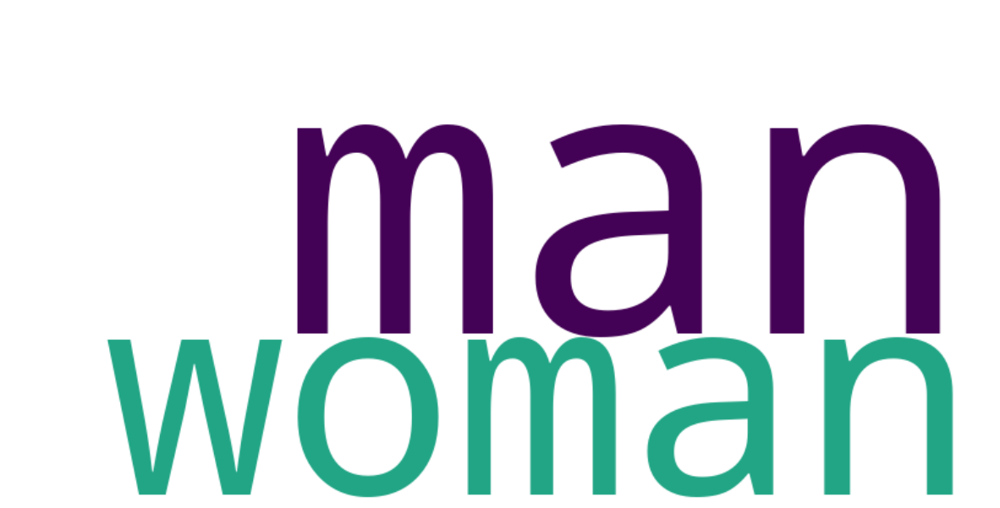

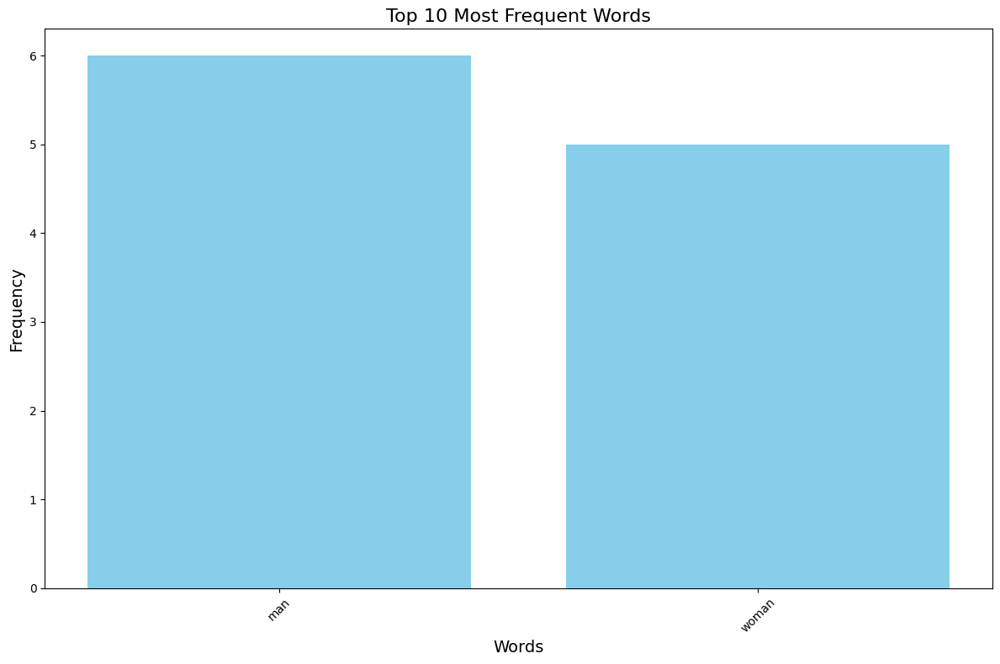

--------------   Classical   -------------- 
--------------   WITH SEED    -------------- 
       Word  Frequency
0       man         17
1     beard          5
2     woman          5
3      suit          4
4  longhair          3


/var/folders/00/6v4ypdjx7mlb7kcwyj2mg58m0000gn/T/ipykernel_13801/914135198.py:132: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['unique_words'] = df[column_name].apply(process_row)


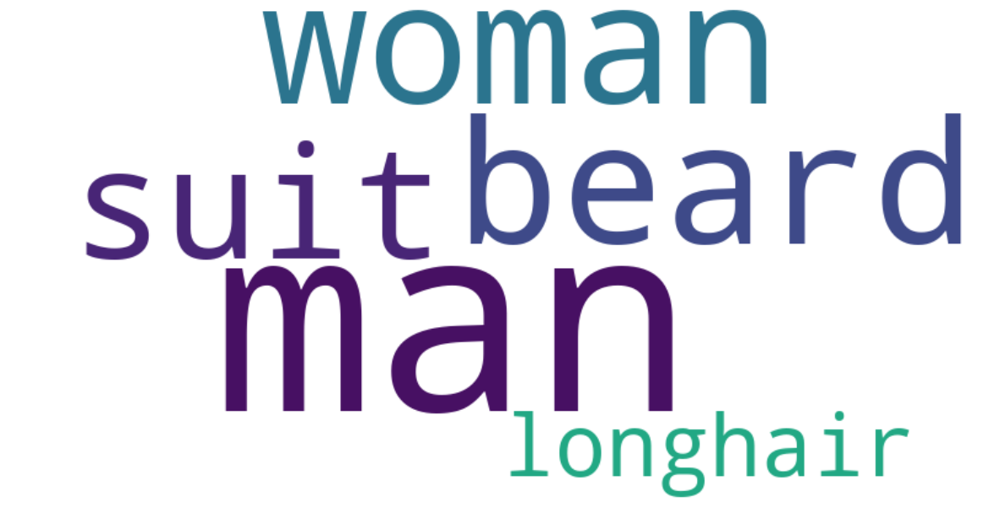

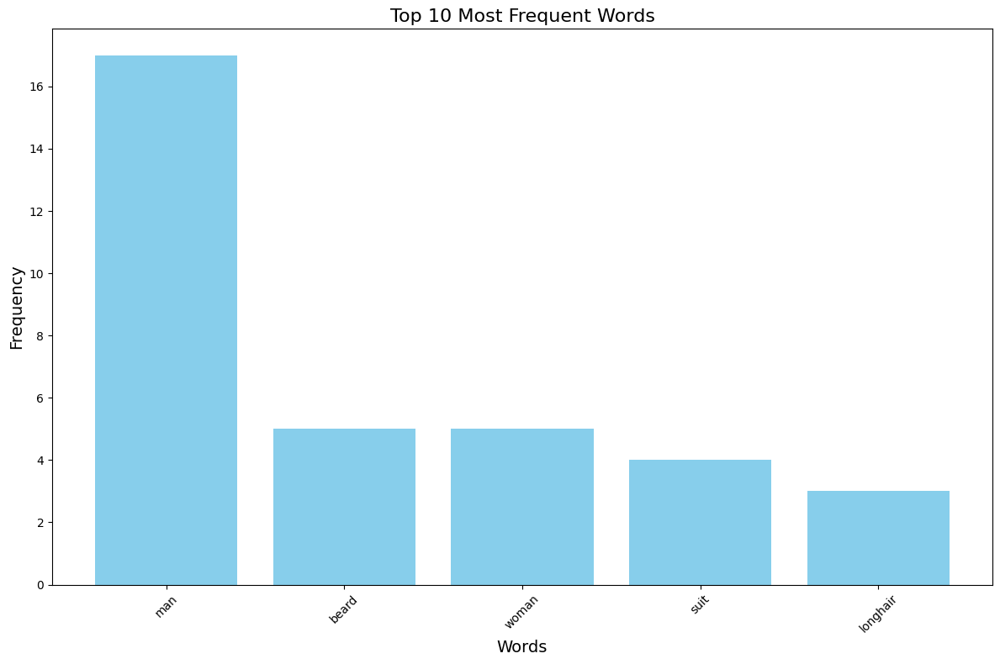

--------------   Classical   -------------- 
--------------   WITHOUT SEED    -------------- 
     Word  Frequency
0     man         10
1  person          5
2   beard          3


/var/folders/00/6v4ypdjx7mlb7kcwyj2mg58m0000gn/T/ipykernel_13801/914135198.py:132: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['unique_words'] = df[column_name].apply(process_row)


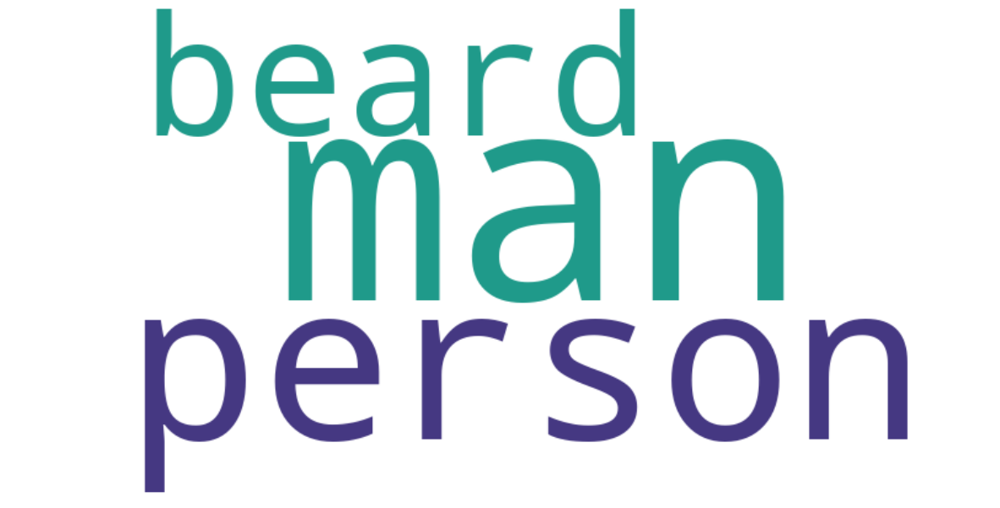

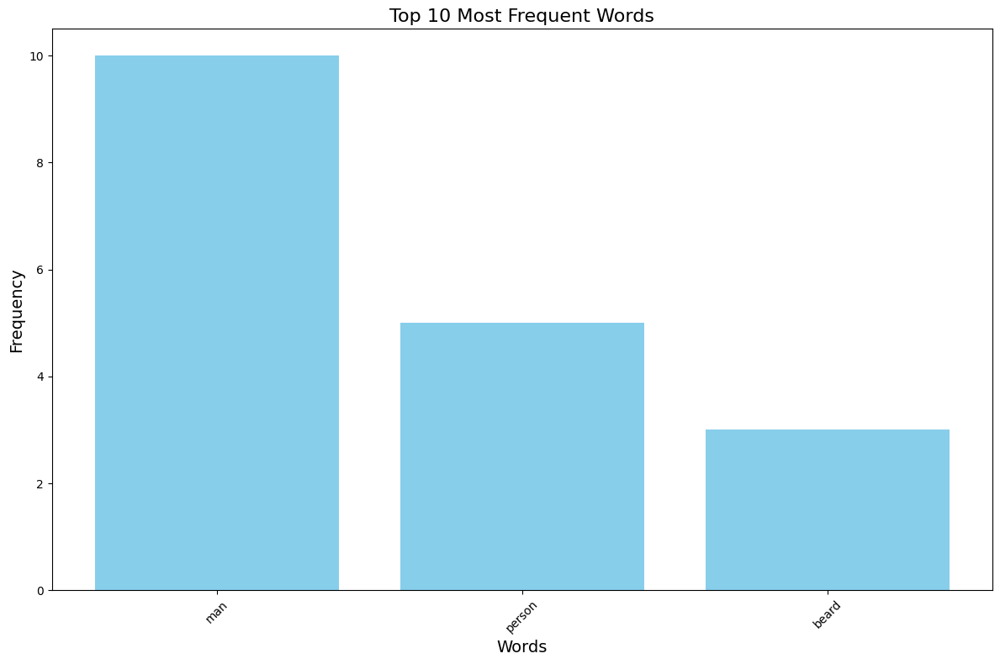

--------------   Childrens   -------------- 
--------------   WITH SEED    -------------- 
Empty DataFrame
Columns: [Word, Frequency]
Index: []
--------------   Childrens   -------------- 
--------------   WITHOUT SEED    -------------- 
Empty DataFrame
Columns: [Word, Frequency]
Index: []
--------------   Christmas   -------------- 
--------------   WITH SEED    -------------- 
   Word  Frequency
0   man          9
1  tree          3


/var/folders/00/6v4ypdjx7mlb7kcwyj2mg58m0000gn/T/ipykernel_13801/914135198.py:132: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['unique_words'] = df[column_name].apply(process_row)
/var/folders/00/6v4ypdjx7mlb7kcwyj2mg58m0000gn/T/ipykernel_13801/914135198.py:132: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['unique_words'] = df[column_name].apply(process_row)
/var/folders/00/6v4ypdjx7mlb7kcwyj2mg58m0000gn/T/ipykernel_13801/914135198.py:132: SettingWithCopyWarning: 
A value is trying to be set on a c

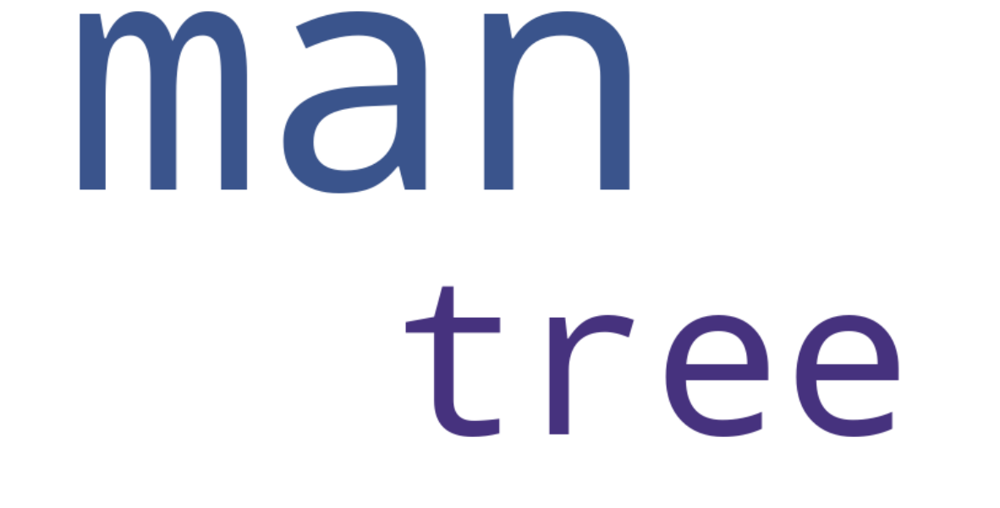

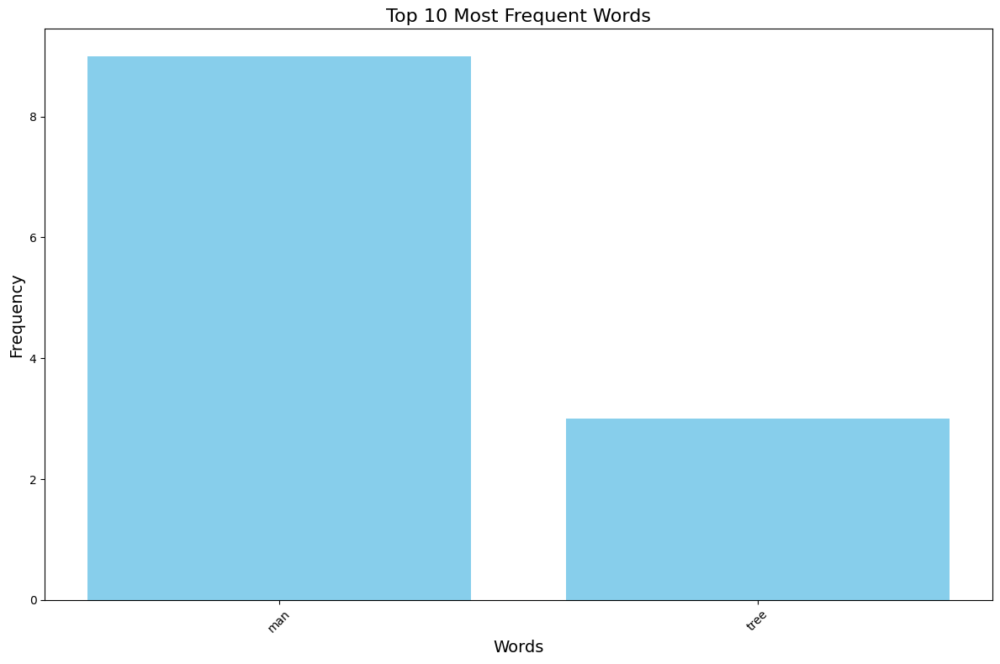

--------------   Christmas   -------------- 
--------------   WITHOUT SEED    -------------- 
  Word  Frequency
0  man          3


/var/folders/00/6v4ypdjx7mlb7kcwyj2mg58m0000gn/T/ipykernel_13801/914135198.py:132: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['unique_words'] = df[column_name].apply(process_row)


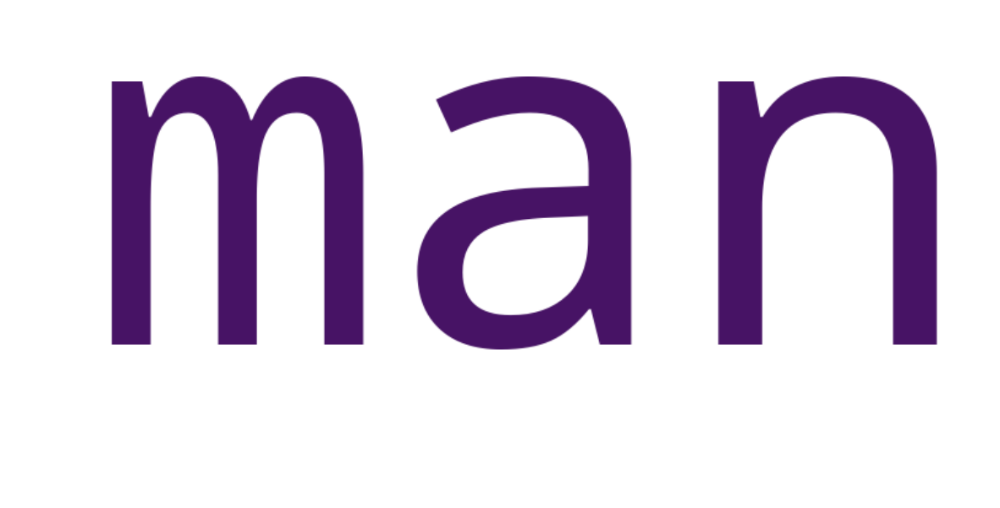

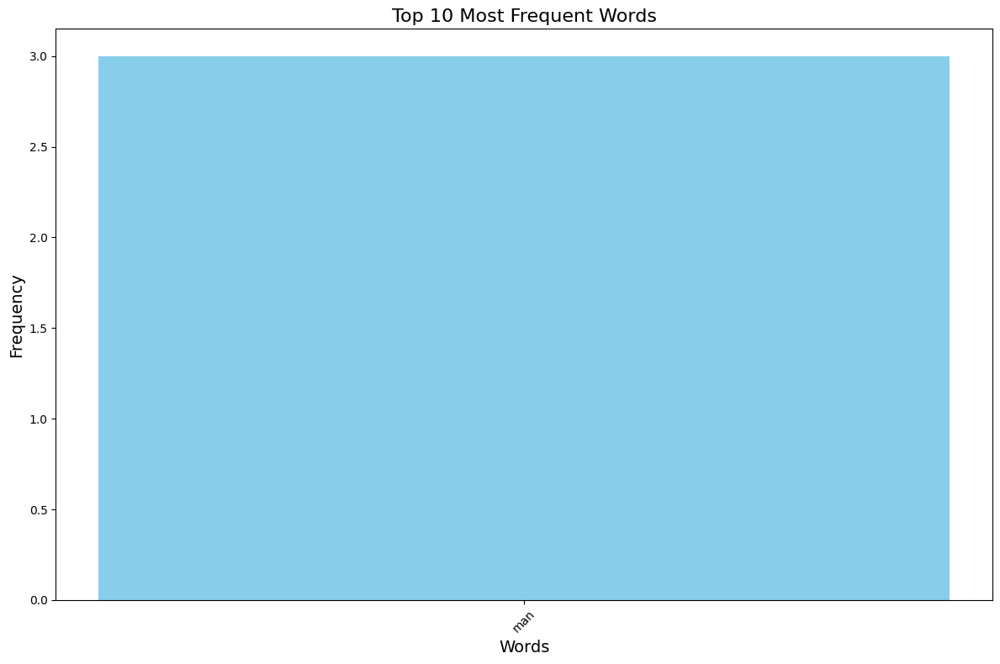

--------------   K-Pop   -------------- 
--------------   WITH SEED    -------------- 
Empty DataFrame
Columns: [Word, Frequency]
Index: []
--------------   K-Pop   -------------- 
--------------   WITHOUT SEED    -------------- 
Empty DataFrame
Columns: [Word, Frequency]
Index: []
--------------   Comedy   -------------- 
--------------   WITH SEED    -------------- 
  Word  Frequency
0  man         10


/var/folders/00/6v4ypdjx7mlb7kcwyj2mg58m0000gn/T/ipykernel_13801/914135198.py:132: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['unique_words'] = df[column_name].apply(process_row)
/var/folders/00/6v4ypdjx7mlb7kcwyj2mg58m0000gn/T/ipykernel_13801/914135198.py:132: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['unique_words'] = df[column_name].apply(process_row)
/var/folders/00/6v4ypdjx7mlb7kcwyj2mg58m0000gn/T/ipykernel_13801/914135198.py:132: SettingWithCopyWarning: 
A value is trying to be set on a c

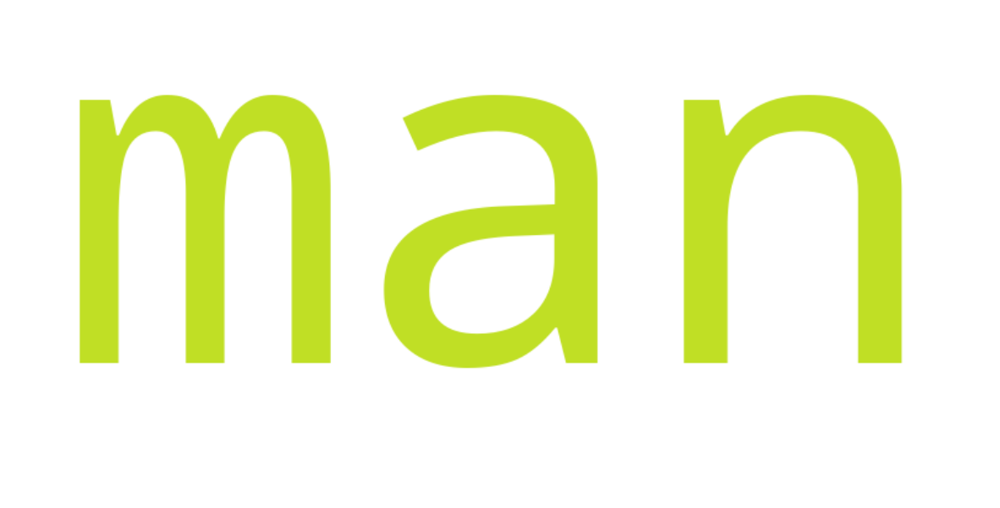

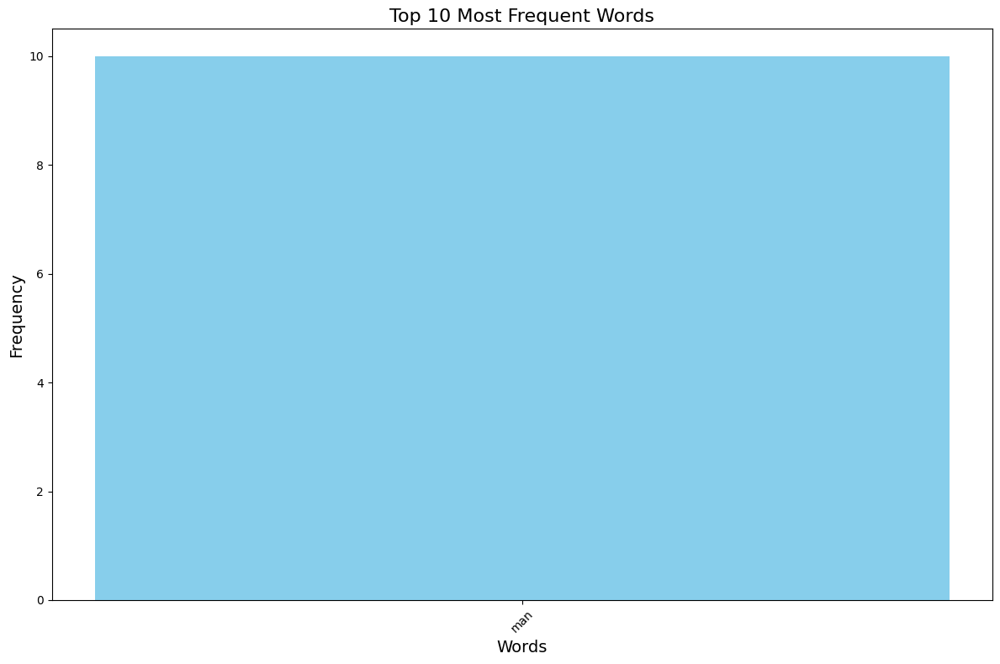

--------------   Comedy   -------------- 
--------------   WITHOUT SEED    -------------- 
     Word  Frequency
0     man          7
1  person          3


/var/folders/00/6v4ypdjx7mlb7kcwyj2mg58m0000gn/T/ipykernel_13801/914135198.py:132: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['unique_words'] = df[column_name].apply(process_row)


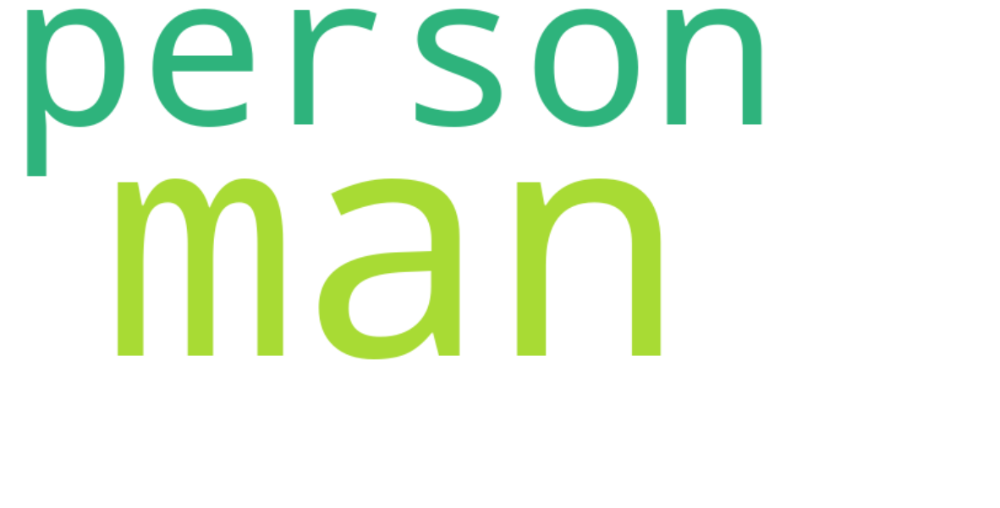

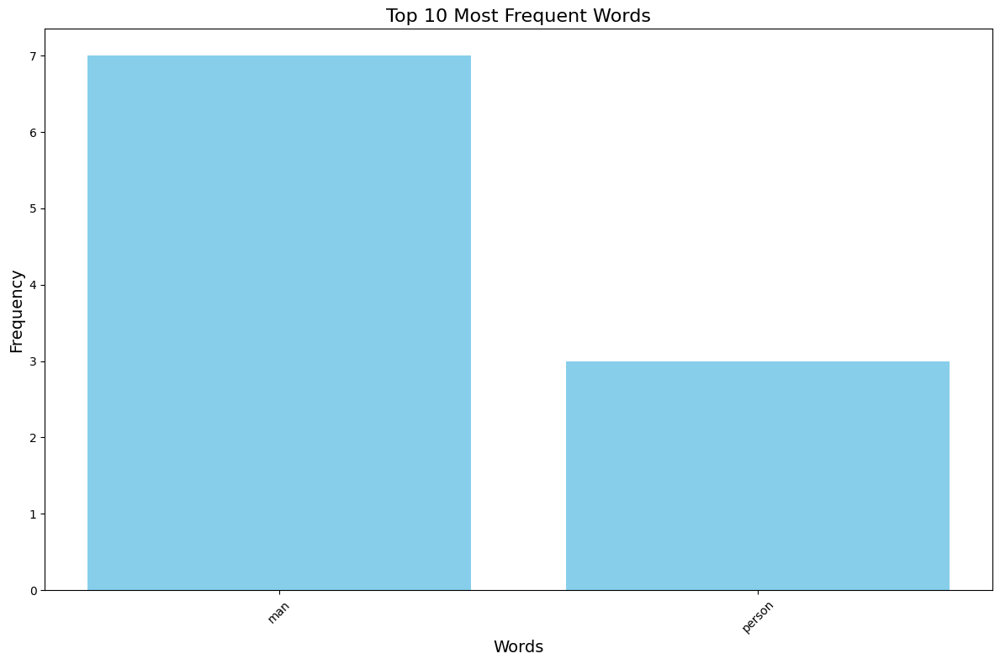

--------------   Blues   -------------- 
--------------   WITH SEED    -------------- 
  Word  Frequency
0  man          7
1  tie          3


/var/folders/00/6v4ypdjx7mlb7kcwyj2mg58m0000gn/T/ipykernel_13801/914135198.py:132: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['unique_words'] = df[column_name].apply(process_row)


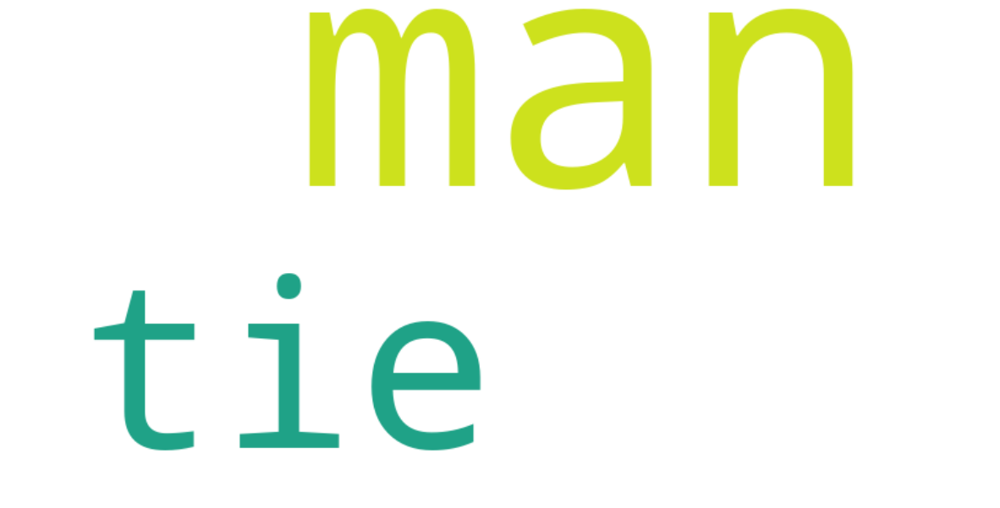

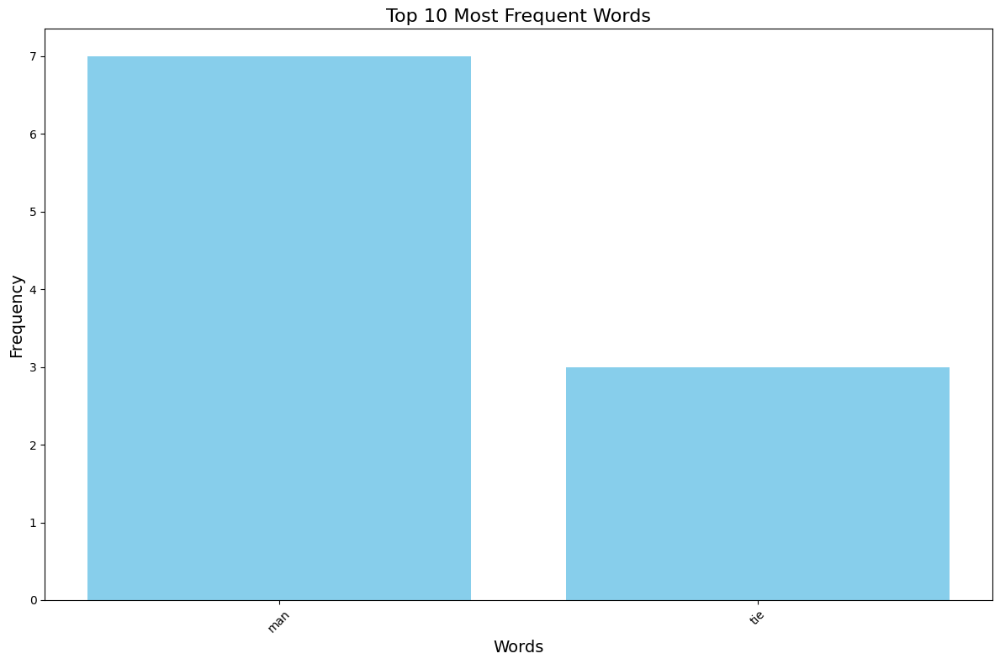

--------------   Blues   -------------- 
--------------   WITHOUT SEED    -------------- 
  Word  Frequency
0  man          5


/var/folders/00/6v4ypdjx7mlb7kcwyj2mg58m0000gn/T/ipykernel_13801/914135198.py:132: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['unique_words'] = df[column_name].apply(process_row)


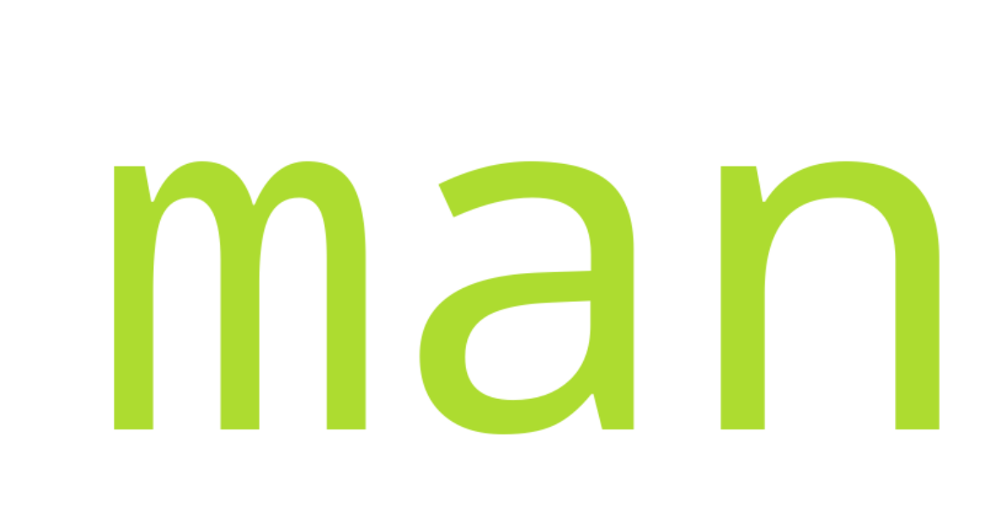

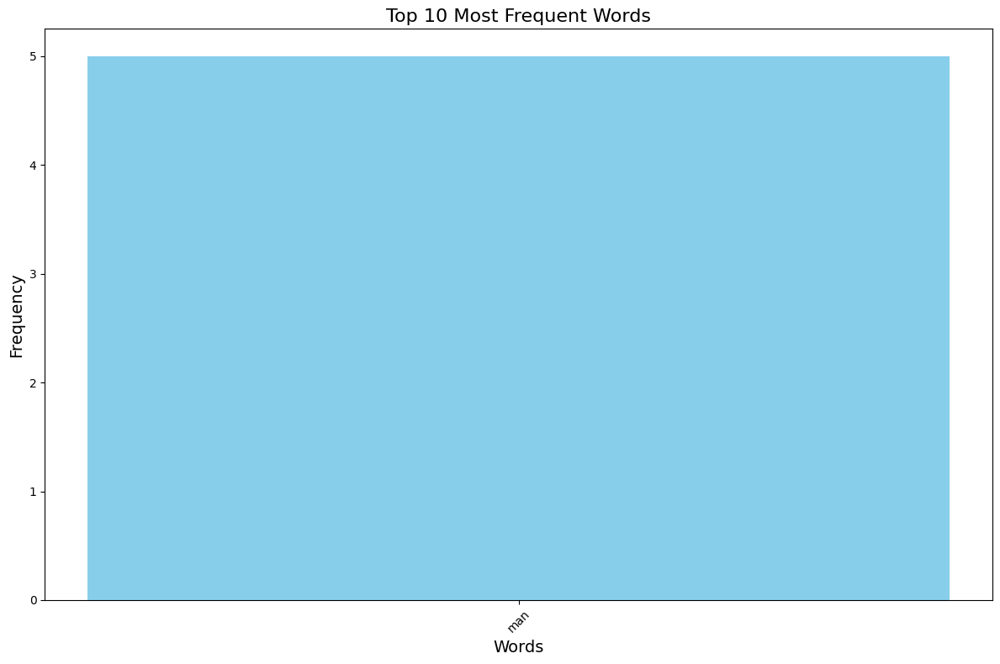

--------------   Easy Listening   -------------- 
--------------   WITH SEED    -------------- 
  Word  Frequency
0  man          9


/var/folders/00/6v4ypdjx7mlb7kcwyj2mg58m0000gn/T/ipykernel_13801/914135198.py:132: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['unique_words'] = df[column_name].apply(process_row)


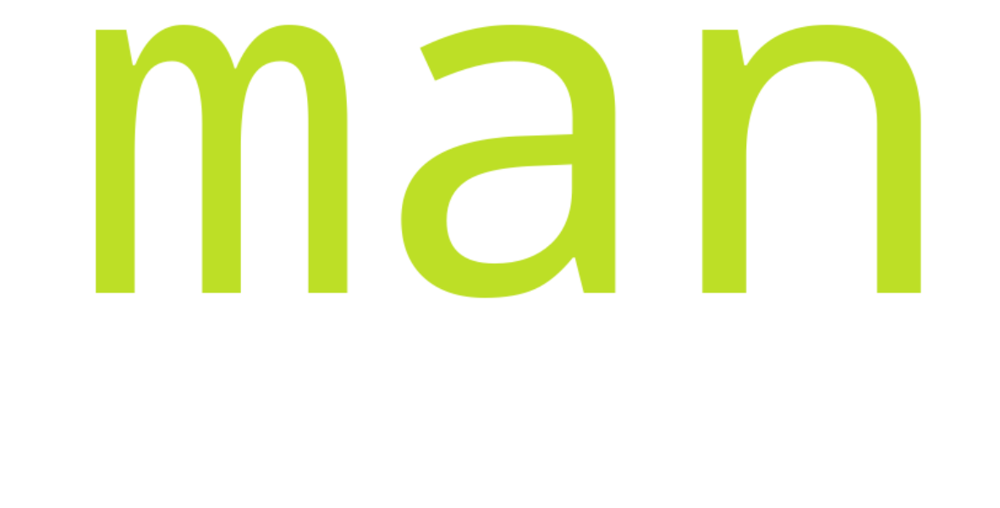

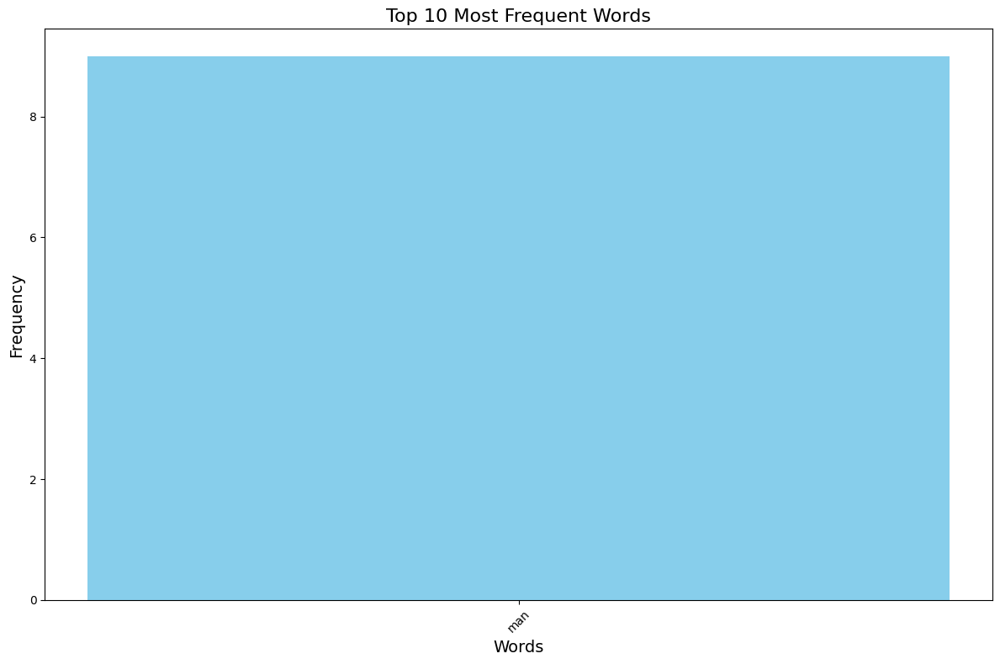

--------------   Easy Listening   -------------- 
--------------   WITHOUT SEED    -------------- 
  Word  Frequency
0  man          3


/var/folders/00/6v4ypdjx7mlb7kcwyj2mg58m0000gn/T/ipykernel_13801/914135198.py:132: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['unique_words'] = df[column_name].apply(process_row)


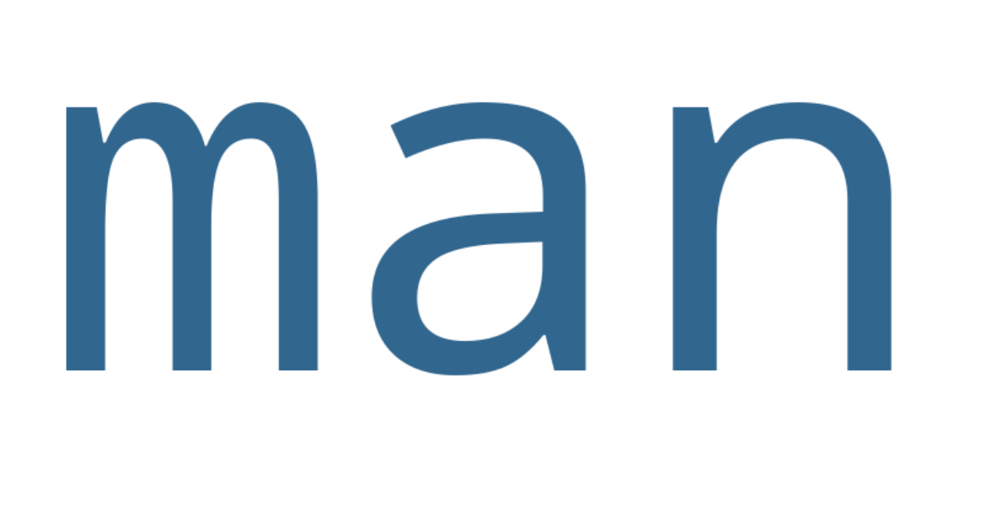

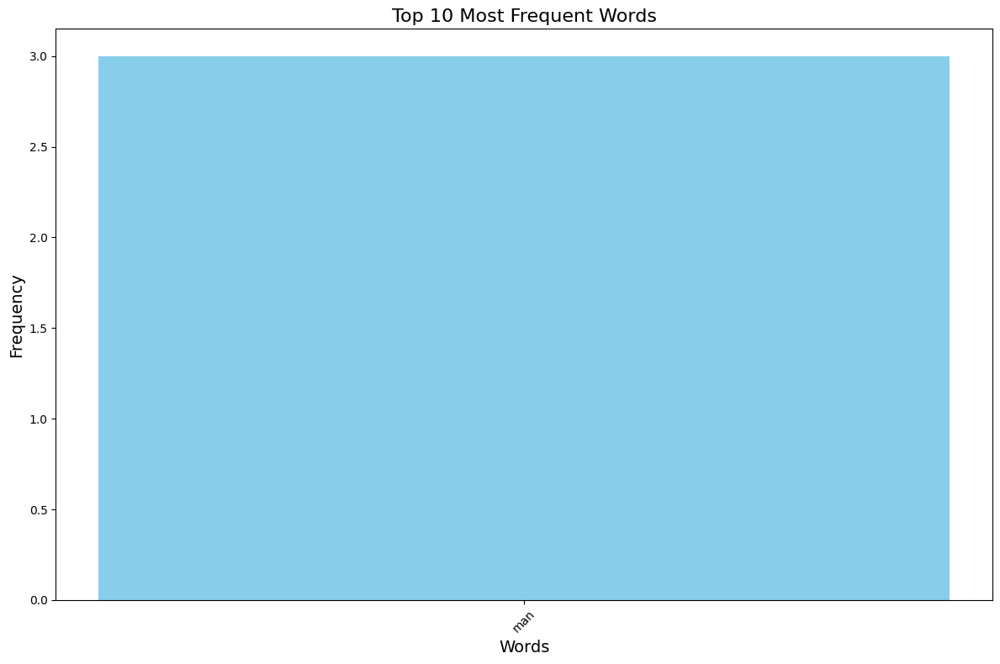

--------------   Vocal   -------------- 
--------------   WITH SEED    -------------- 
   Word  Frequency
0   man          8
1  suit          4


/var/folders/00/6v4ypdjx7mlb7kcwyj2mg58m0000gn/T/ipykernel_13801/914135198.py:132: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['unique_words'] = df[column_name].apply(process_row)


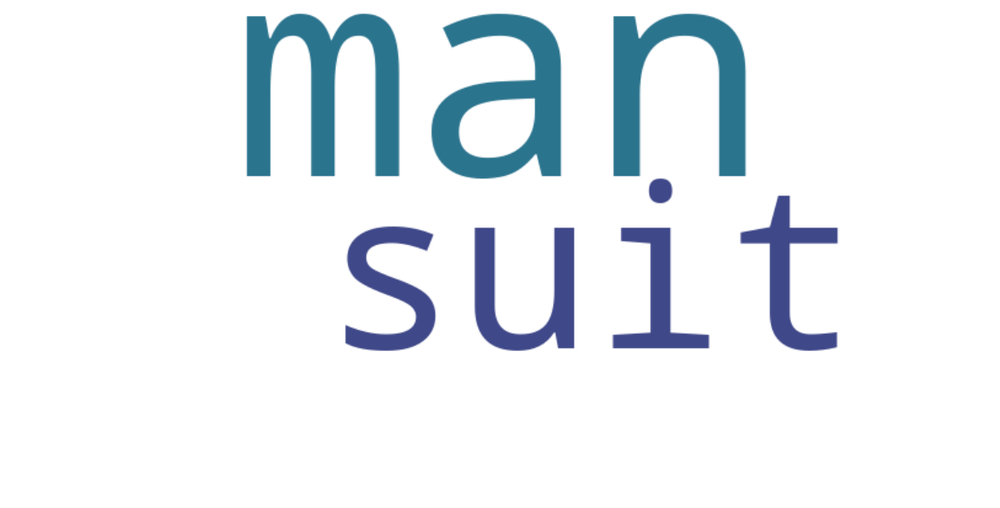

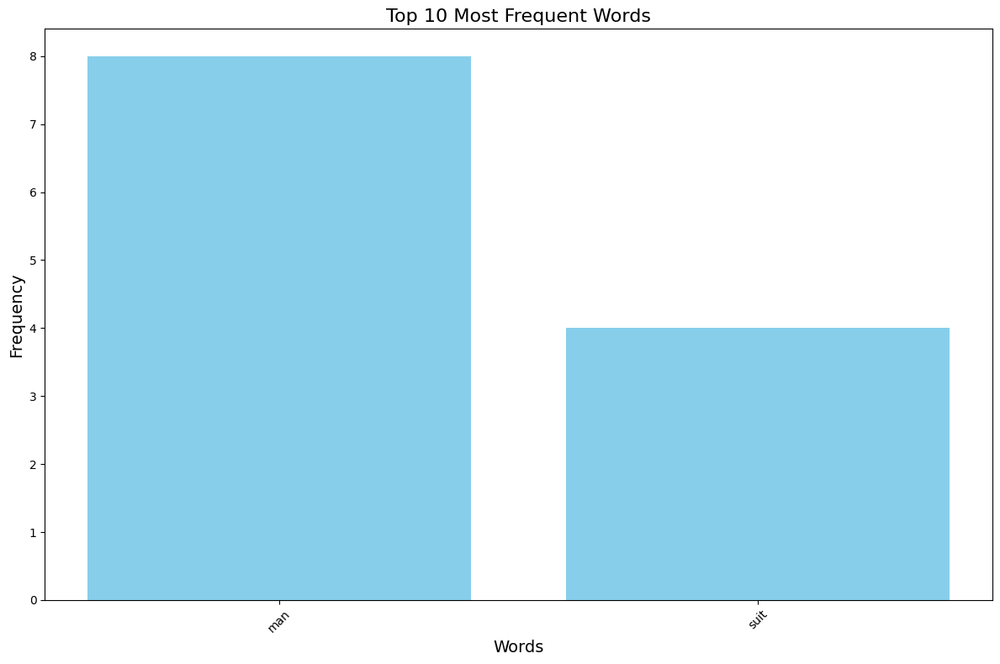

--------------   Vocal   -------------- 
--------------   WITHOUT SEED    -------------- 
     Word  Frequency
0    suit          5
1     tie          3
2  person          3
3     man          3


/var/folders/00/6v4ypdjx7mlb7kcwyj2mg58m0000gn/T/ipykernel_13801/914135198.py:132: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['unique_words'] = df[column_name].apply(process_row)


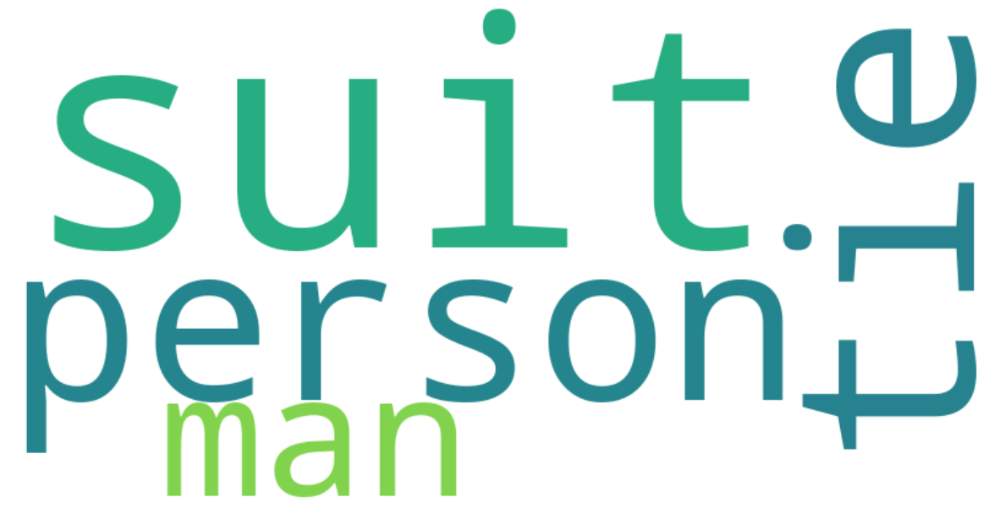

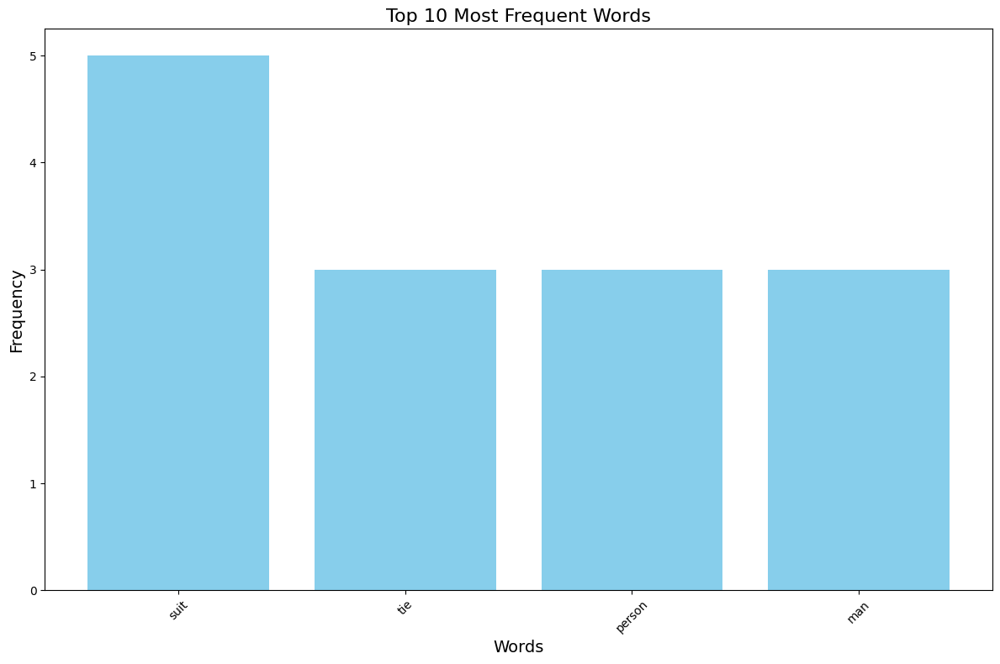

--------------   Reggae   -------------- 
--------------   WITH SEED    -------------- 
  Word  Frequency
0  man          6


/var/folders/00/6v4ypdjx7mlb7kcwyj2mg58m0000gn/T/ipykernel_13801/914135198.py:132: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['unique_words'] = df[column_name].apply(process_row)


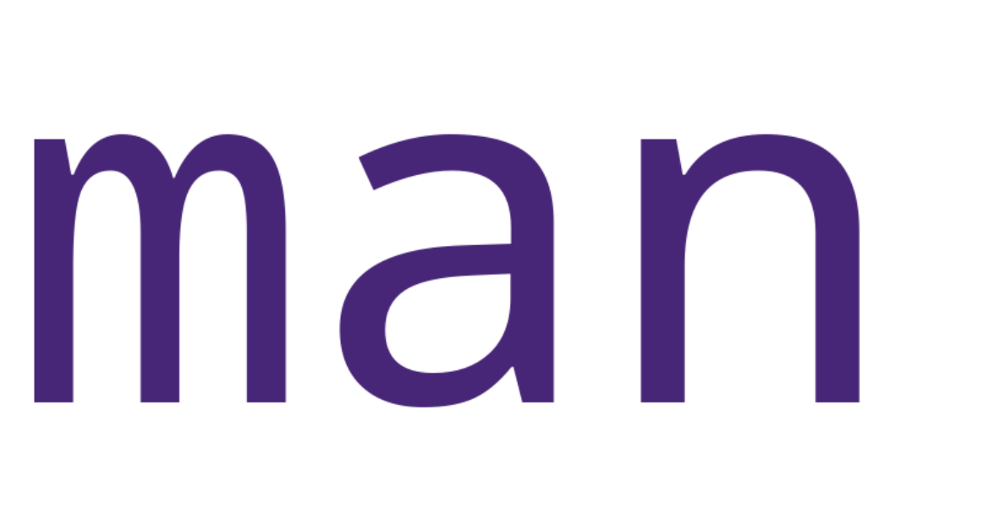

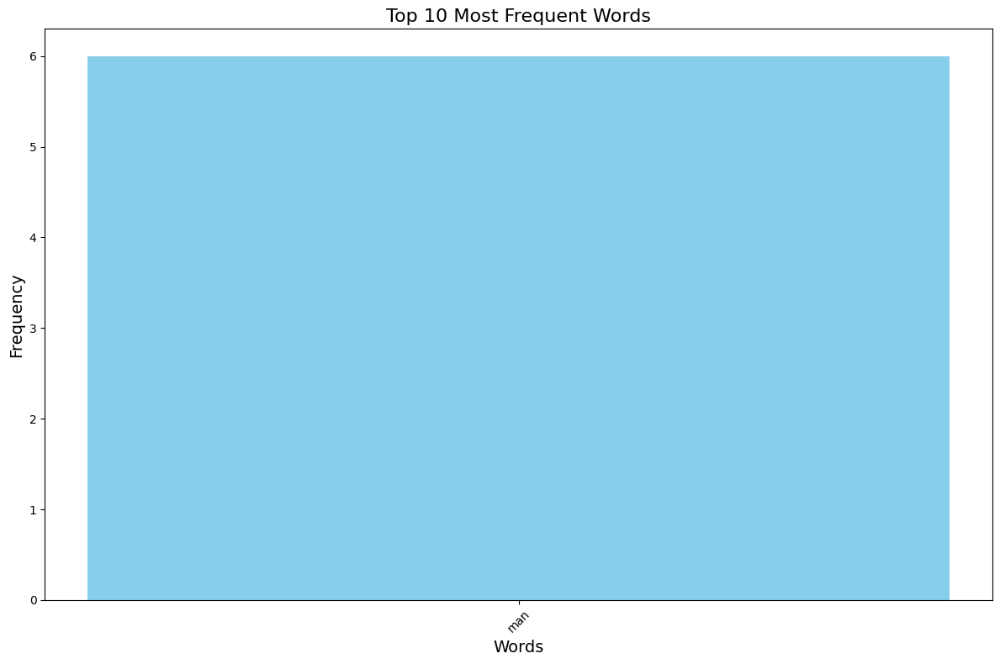

--------------   Reggae   -------------- 
--------------   WITHOUT SEED    -------------- 
  Word  Frequency
0  man          3


/var/folders/00/6v4ypdjx7mlb7kcwyj2mg58m0000gn/T/ipykernel_13801/914135198.py:132: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['unique_words'] = df[column_name].apply(process_row)


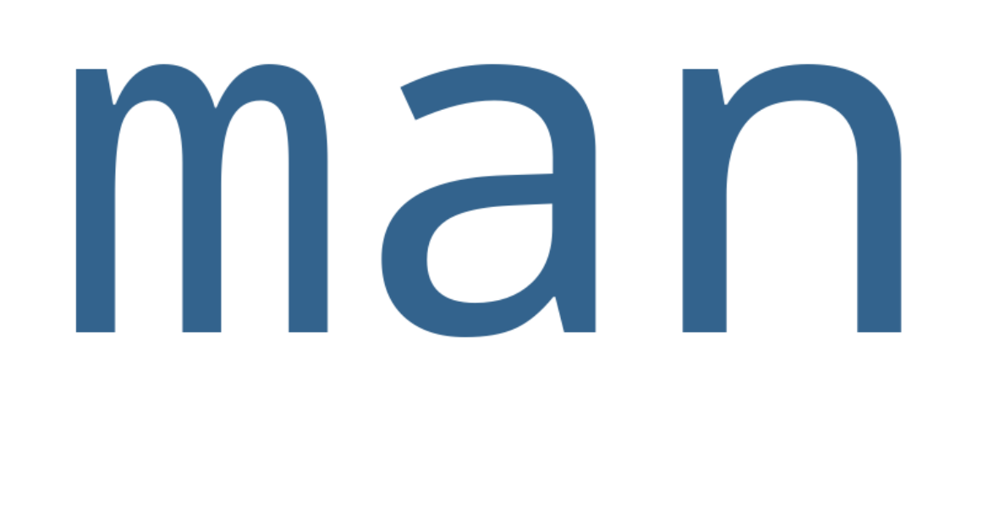

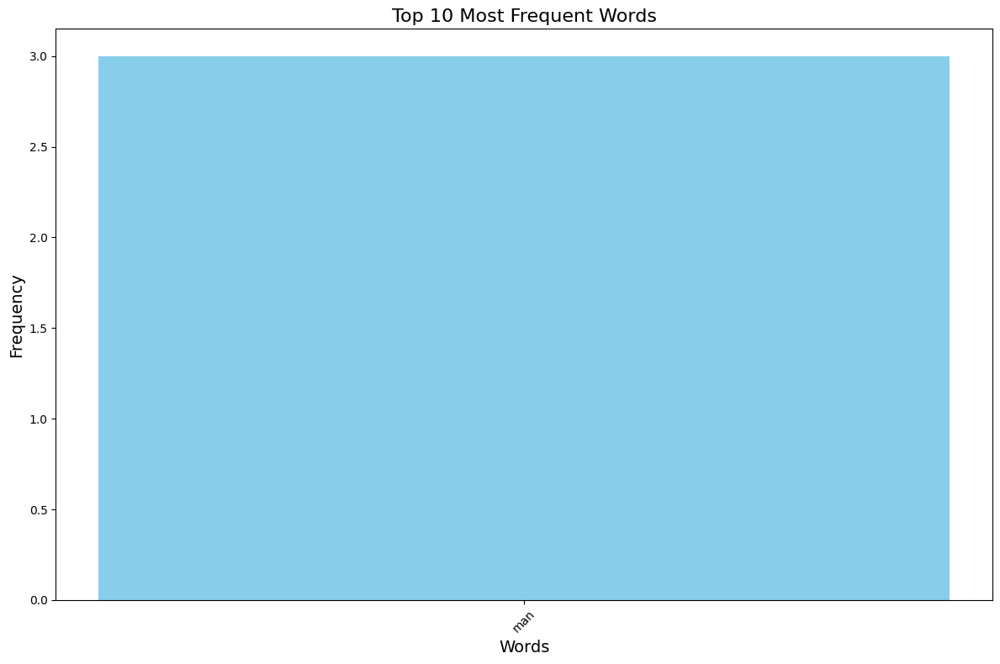

--------------   African   -------------- 
--------------   WITH SEED    -------------- 
  Word  Frequency
0  man          3


/var/folders/00/6v4ypdjx7mlb7kcwyj2mg58m0000gn/T/ipykernel_13801/914135198.py:132: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['unique_words'] = df[column_name].apply(process_row)


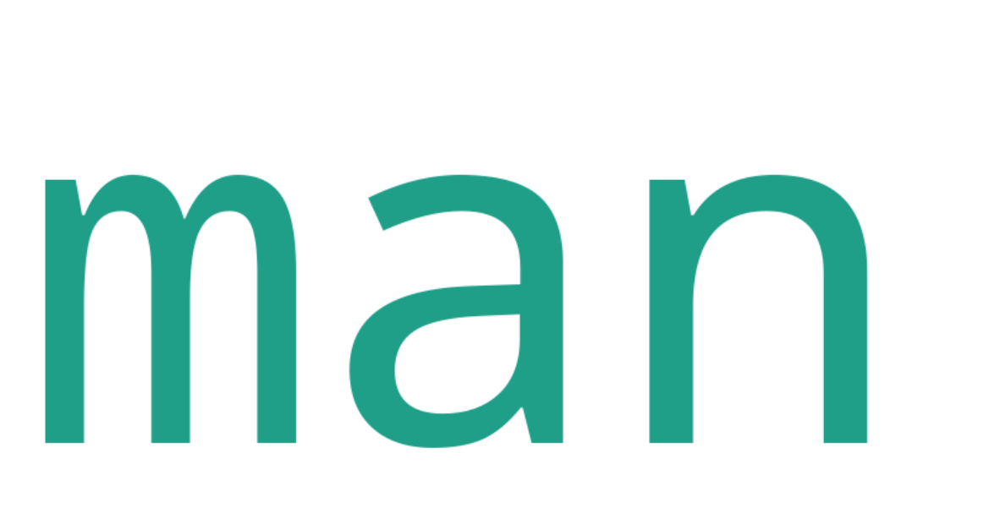

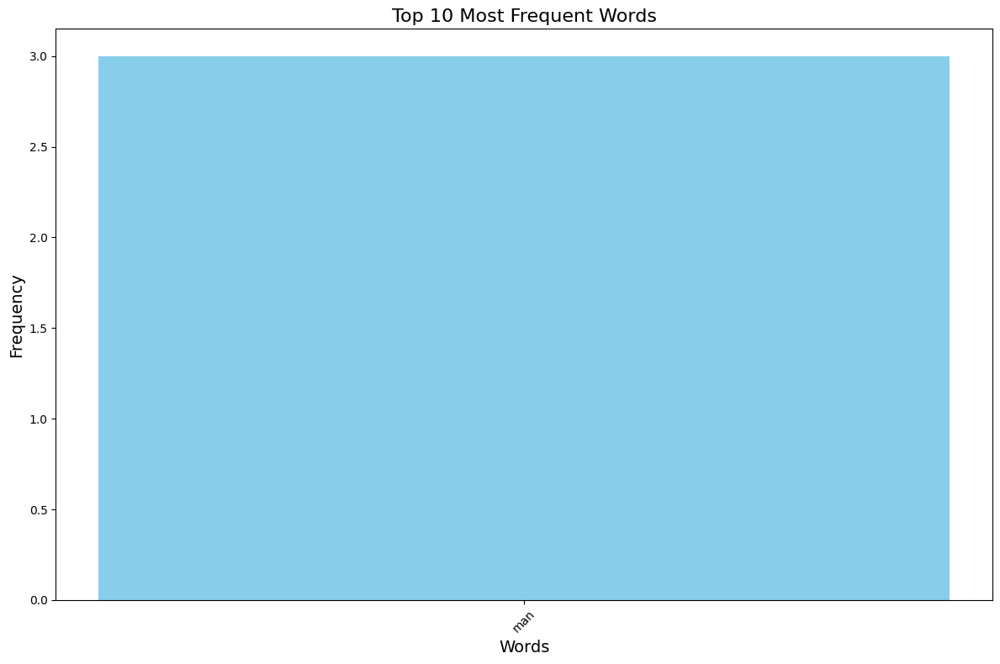

--------------   African   -------------- 
--------------   WITHOUT SEED    -------------- 
Empty DataFrame
Columns: [Word, Frequency]
Index: []
--------------   Disco   -------------- 
--------------   WITH SEED    -------------- 
Empty DataFrame
Columns: [Word, Frequency]
Index: []
--------------   Disco   -------------- 
--------------   WITHOUT SEED    -------------- 
Empty DataFrame
Columns: [Word, Frequency]
Index: []
--------------   Ballad   -------------- 
--------------   WITH SEED    -------------- 
Empty DataFrame
Columns: [Word, Frequency]
Index: []
--------------   Ballad   -------------- 
--------------   WITHOUT SEED    -------------- 
Empty DataFrame
Columns: [Word, Frequency]
Index: []


/var/folders/00/6v4ypdjx7mlb7kcwyj2mg58m0000gn/T/ipykernel_13801/914135198.py:132: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['unique_words'] = df[column_name].apply(process_row)
/var/folders/00/6v4ypdjx7mlb7kcwyj2mg58m0000gn/T/ipykernel_13801/914135198.py:132: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['unique_words'] = df[column_name].apply(process_row)
/var/folders/00/6v4ypdjx7mlb7kcwyj2mg58m0000gn/T/ipykernel_13801/914135198.py:132: SettingWithCopyWarning: 
A value is trying to be set on a c

In [610]:
for gen in frequent_genres:
    print(f"--------------   {gen}   -------------- ")
    print(f"--------------   WITH SEED    -------------- ")
    
    genre_df = df[df['big_genres'].str.contains(gen, na=False)]
    word_counts_df = get_common_words(genre_df,'text_with_seed')
    print(word_counts_df[:20])
    if len(word_counts_df[:20]) > 0:
        plot_wordcloud(word_counts_df)
        plot_bar(word_counts_df)

    print(f"--------------   {gen}   -------------- ")
    print(f"--------------   WITHOUT SEED    -------------- ")
    word_counts_df = get_common_words(genre_df,'text_without_seed')
    print(word_counts_df[:20])
    if len(word_counts_df[:20]) > 0:
        plot_wordcloud(word_counts_df)
        plot_bar(word_counts_df)

In [574]:
 word_counts_df = get_common_words(df,'text_with_seed')

In [476]:
csv_file_path = 'words_with_seed.csv' 
word_counts_df.to_csv(csv_file_path, index=False, encoding='utf-8-sig')

In [462]:
word_of_interest = ' lake '
filtered_df = df[df['text_with_seed'].str.contains(word_of_interest, case=False, na=False)]
filtered_df[['image_name', 'text_with_seed']]

,image_name,text_with_seed
1971,2011_2036.png,an album cover that shows a painting of a lake...
1996,2011_2062.png,an album cover that shows a snow covered lake ...
